# Acute-stroke TDE-HMM feature extraction and longitudinal analysis

This notebook is organized as a dependency-ordered workflow:

1. **Setup and data loading** — load preprocessed sequences and the trained eight-state TDE-HMM.
2. **Temporal features** — state time courses, fractional occupancy and switching rate.
3. **Spectral features** — subject-balanced PSD, absolute band power and cluster inference.
4. **Spatial features** — atlas alignment, static/dynamic power maps and parcel-wise inference.
5. **Clinical analysis** — affected-side Fugl–Meyer scores, interval-specific confounders, exploratory ROI heatmaps and nested-ridge prognosis.

All inferential group comparisons use subjects—not trials—as independent observations. Dynamic power is state-specific power relative to the common static reference and can therefore be negative; absolute power remains non-negative. Heatmap correlations are adjusted for age, categorical education and lesion size, whereas spatial ROI selection retains its preceding FDR control.


In [26]:
# Purpose: Report the active Python executable and host to verify the remote kernel.
import sys, socket
#sanity check for kubernetes connection
print(sys.executable)
print(socket.gethostname())


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/bin/python
run-notebook-all-static-0-0


In [27]:
# Purpose: Configure the runtime and import OSL-Dynamics modules used throughout the notebook.
import os, sys

# Suppress TensorFlow C++ backend logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=all, 1=INFO, 2=WARNING, 3=ERROR
# Now import TensorFlow
# import tensorflow as tf
# # Suppress high-level TensorFlow Python logs
# tf.get_logger().setLevel('ERROR')
# # Optional: suppress other noisy loggers        
# import logging
# logging.getLogger("tensorflow").setLevel(logging.ERROR)

In [28]:
# Purpose: Import numerical, tabular, plotting, neuroimaging, and utility dependencies.
import time
import re
import pandas as pd
import json, glob
import numpy as np
import nibabel as nib
import random
import math
import pickle
from itertools import product
from scipy.signal import resample_poly
from pathlib import Path
from typing import Dict, List, Tuple, Union
from sklearn.model_selection import GroupKFold
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from osl_dynamics.data import Data
from osl_dynamics.models.hmm import Model
from osl_dynamics.models.hmm import Config
from osl_dynamics.data.processing import standardize
from osl_dynamics.data.processing import time_embed
from osl_dynamics.models import load
from osl_dynamics.utils import plotting
from osl_dynamics.analysis import spectral
from osl_dynamics.analysis import power
from osl_dynamics.inference import modes

In [29]:
# Purpose: Set global plotting defaults and shared colours for consistent figures.
#Global plotting options:
import matplotlib.colors as mcolors

color_list=["#010213", "#2b3cd8", "#22e9f0", "#74dd2e", "#F0E43F", "#e79c39", "#e7514c", "#ef3df5"] #"#9b0bbe"
cmap_custom = mcolors.ListedColormap(color_list, name="my_custom")
#plt.register_cmap(cmap=cmap_custom)

#### Load the dataset

In [30]:
# Purpose: Convert subject/trial sequence dictionaries into an OSL Data object with aligned group labels.
def pack_sequences_and_groups(
    data: Union[List[np.ndarray], Dict[int, List[np.ndarray]]]
) -> Tuple[Data, np.ndarray, bool]:
    """
    Accepts:
      - List[np.ndarray]  -> single-subject (legacy)
      - Dict[subject_id, List[np.ndarray]] -> multi-subject
    Returns:
      - Data(list of sequences)
      - groups: np.ndarray[int], subject id per sequence
      - is_multi: bool
    """
    if isinstance(data, dict):
        seqs, groups = [], []
        for sid, trials in data.items():
            for X in trials:
                seqs.append(X)
                groups.append(int(sid))
        return Data(seqs), np.asarray(groups, int), True
    else:
        # legacy single-subject: group id = 0 for all sequences
        seqs = list(data)
        groups = np.zeros(len(seqs), dtype=int)
        return Data(seqs), groups, False

def subset_Data(data_all: Data, seq_idx: np.ndarray) -> Data:
    # Rebuild a Data object from a subset of sequences
    seqs = [data_all.arrays[i] for i in seq_idx.tolist()]
    return Data(seqs)

In [31]:
# Purpose: Load the preprocessed raw and PCA sequence dictionaries used by the trained HMM.
#load data dict after downsampling object for future use
with open('/workspace/nbenlamr/osl_results/data_dict_all_stand.pkl', 'rb') as file:
    data_dict_raw_loaded = pickle.load(file)

#load data dict pca object for future use
with open('/workspace/nbenlamr/osl_results/data_dict_all_pca.pkl', 'rb') as file:
    data_dict_pca_loaded = pickle.load(file)

In [32]:
# Purpose: Pack the PCA sequences and retain the subject/group mapping required by the model.
data_all_pca, group_all_pca, is_multi_pca = pack_sequences_and_groups(data_dict_pca_loaded)

Loading files:   0%|                                   | 0/2354 [00:00<?, ?it/s]

Loading files: 100%|██████████████████████| 2354/2354 [00:01<00:00, 1411.13it/s]


#### Load the trained HMM model

In [33]:
# Purpose: Load the previously trained best TDE-HMM model from disk.
model_loaded = load("/workspace/nbenlamr/osl_results/Results_HMM_bestconfig_all")

2026-07-30 11:35:09 INFO osl-dynamics [mod_base.py:689:load]: Loading model: /workspace/nbenlamr/osl_results/Results_HMM_bestconfig_all


In [34]:
# Purpose: Display the fitted HMM hyperparameters as a model-identity sanity check.
#Check hyperparameters of the best model
print(f"Number of hidden states of the best hyperparameter configuration: {model_loaded.config.n_states}.\n")
print(f"Learning rate of the best hyperparameter configuration: {model_loaded.config.learning_rate}.\n")
print(f"Sequence length of the best hyperparameter configuration: {model_loaded.config.sequence_length}.\n")
n_states = model_loaded.config.n_states
print(f"Number of hidden states of the best hyperparameter configuration: {model_loaded.config.n_states}.\n")

Number of hidden states of the best hyperparameter configuration: 8.

Learning rate of the best hyperparameter configuration: 0.0003.

Sequence length of the best hyperparameter configuration: 600.

Number of hidden states of the best hyperparameter configuration: 8.



### Feature extraction: **time-domain** features

- State probability time-courses

In [35]:
# Purpose: Infer state probability time courses from the loaded HMM and PCA data.
#Extract saved free energy - optional, not needed for feature extraction
#fe = model_loaded.free_energy(data_all_pca)

#Extract state probability time courses (alphas)
alphas = model_loaded.get_alpha(data_all_pca) #(n-trials, n-timepoints, n-states)

Getting alpha: 100%|████████████████████████| 2354/2354 [05:23<00:00,  7.28it/s]


In [36]:
# Purpose: Concatenate trial state probabilities for descriptive inspection only.
#Get the average state probability time courses across all trials for each subject
alpha_avgtrials_all = np.concatenate(alphas, axis=0)

In [37]:
# Purpose: Convert probabilistic state time courses to hard state assignments.
# Hard classify the state probabilities
stc = modes.argmax_time_courses(alphas)
# Plot the state time course for the first subject 
stc_avgtrials_all = np.concatenate(stc, axis=0)

*Plot single-trial examples*

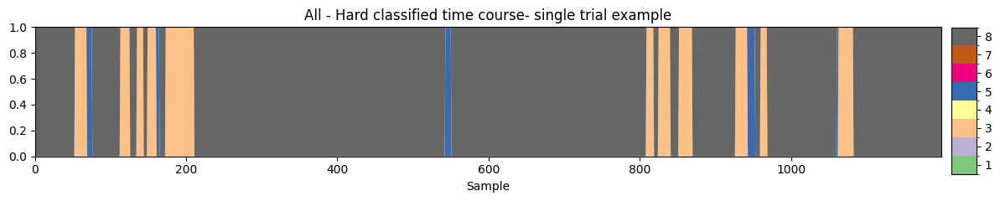

In [38]:
# Purpose: Plot one trial as a qualitative example of the hard state sequence.
trial_idx = 176 # trial index to plot
fig, ax = plotting.plot_alpha(stc[trial_idx], title="All - Hard classified time course- single trial example", cmap="Accent")

plt.show()

- Fractional occupancies

In [39]:
# Purpose: Compute trial-level fractional occupancy for every HMM state.
fo = modes.fractional_occupancies(stc)
gfo = np.mean(fo, axis=0)
print(fo.shape) # (n-trials, n-states)
print(gfo.shape)

(2354, 8)
(8,)


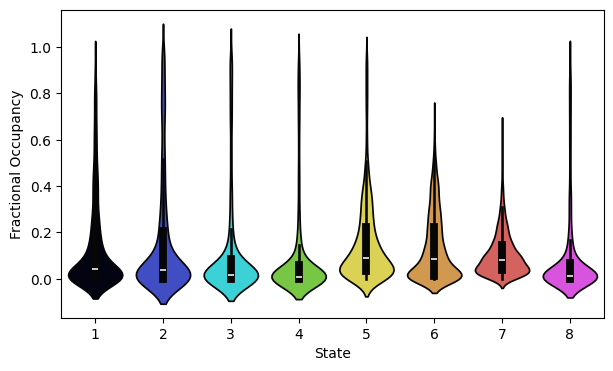

In [40]:
# Purpose: Display the trial-level fractional-occupancy distributions across states.
fig, ax = plotting.plot_violin(
	fo.T,
	x_label="State",
	y_label="Fractional Occupancy",
	sns_kwargs={"palette": color_list}
)
plt.show()

### Feature extraction: **spectral** features

- *Trimming of the raw dataset*: 
If we trained on time-delay embedded data we lose a few time points from the start and end of the data. 
Additionally, when we separate the data into sequences (e.g. multi-taper spectra) we lose time points from the end of the time series (that do not form a complete sequence). 
Consequently, we need to trim the source-space data to match the inferred state probabilities (`alpha`).

**Warning** : this step can be computationally heavy, therefore it can be worthy to extract them using the following python script: *"feature_extraction_acutestroke.py"* instead of using Kubernetes. 

In [41]:
# Purpose: Document the optional raw-data trimming workflow; disabled because spectra were precomputed.
# all_trials = [trial for trials in data_dict_raw_loaded.values() for trial in trials]

# data_raw = Data(all_trials)
# x = data_raw.trim_time_series(n_embeddings=15, sequence_length=sequence_length)

In [42]:
# Purpose: Document optional time-length sanity checks for freshly computed spectra.
# #Sanity check:
# print(len(alphas[0]))
# print(len(x[0]))

- PSD computation

In [43]:
# Purpose: Document the optional multitaper PSD/coherence computation; disabled to avoid accidental heavy execution.
# f, psd, coh, w = spectral.multitaper_spectra(
#     data=x,
#     alpha=alphas,
#     sampling_frequency=250,
#     time_half_bandwidth=4,
#     n_tapers=7,
#     frequency_range=[1, 45],
#     standardize=True,
#     return_weights=True,
#     n_jobs=1
# )

In [44]:
# Purpose: Document optional saving of newly computed spectral arrays.
# np.save("/mnt/uphummel/scratch/gcarneva/osl_results/spectra/AcuteStroke/f_v001.npy", f)
# np.save("/mnt/uphummel/scratch/gcarneva/osl_results/spectra/AcuteStroke/psd_v001.npy", psd)
# np.save("/mnt/uphummel/scratch/gcarneva/osl_results/spectra/AcuteStroke/coh_v001.npy", coh)
# np.save("/mnt/uphummel/scratch/gcarneva/osl_results/spectra/AcuteStroke/w_v001.npy", w)

In [45]:
# Purpose: Document optional coherence cleaning checks for newly computed spectra.
# # Sanity check on coherence: ensure no NaN or Inf
# coh_clean = np.nan_to_num(coh, nan=0.0, posinf=0.0, neginf=0.0)
# coh_clean = np.clip(coh_clean, 0, 1)

In [46]:
# Purpose: Document optional saving of a cleaned coherence array.
#np.save("/mnt/uphummel/scratch/gcarneva/osl_results/spectra/AcuteStroke/coh_clean_v001.npy", coh_clean)

In [47]:
# Purpose: Load trial metadata and reconstruct an explicit trial-to-subject/group mapping.
import pickle
import pandas as pd
from pathlib import Path

ROOT = Path("/workspace/nbenlamr/osl_results")

with open(ROOT / "data_dict_all_pca.pkl", "rb") as f:
    data_dict_pca = pickle.load(f)

with open(ROOT / "group_labels_all.pkl", "rb") as f:
    group_labels = pickle.load(f)

group_map = {
    "healthyold": "healthy",
    "left_lesion": "stroke",
    "right_lesion_flipped": "stroke",
}
group_order = ["healthy", "stroke"]

# Consistent group colors. Blue is reserved for negative-valued contrasts.
group_colors = {
    "healthy": "#009E73",  # green
    "stroke": "#7B2CBF",   # purple
}

trial_meta_rows = []
for sid, trials in data_dict_pca.items():
    original_group = group_labels[int(sid)]
    for trial_idx, _ in enumerate(trials):
        trial_meta_rows.append({
            "subject_id": int(sid),
            "trial_idx": int(trial_idx),
            "original_group": original_group,
            "group": group_map[original_group],
        })

trial_meta = pd.DataFrame(trial_meta_rows)
print(trial_meta.head())
print("Trials per group:")
print(trial_meta["group"].value_counts())
print("Subjects per group:")
print(trial_meta[["subject_id", "group"]].drop_duplicates()["group"].value_counts())
print("trial_meta rows:", len(trial_meta))


   subject_id  trial_idx original_group    group
0      247167          0     healthyold  healthy
1      247167          1     healthyold  healthy
2      247167          2     healthyold  healthy
3      247167          3     healthyold  healthy
4      247167          4     healthyold  healthy
Trials per group:
stroke     1940
healthy     414
Name: group, dtype: int64
Subjects per group:
stroke     73
healthy    16
Name: group, dtype: int64
trial_meta rows: 2354


In [48]:
# Purpose: Load precomputed frequency, PSD, coherence, and multitaper-weight arrays.
#Load spectral data --> extracted from the python script: "feature_extraction_acutestroke_v2.py"
BASE = "/workspace/nbenlamr/osl_results/spectra/AcuteStroke"

f = np.load(f"{BASE}/f_v003_downsampl_0Hz.npy")
psd = np.load(f"{BASE}/psd_v003_downsampl_0Hz.npy")
coh = np.load(f"{BASE}/coh_v003_downsampl.npy", mmap_mode="r")
w = np.load(f"{BASE}/w_v003_downsampl.npy", mmap_mode="r")
coh_clean = np.load(f"{BASE}/coh_clean_v003_downsampl.npy", mmap_mode="r")


In [49]:
# Purpose: Verify the dimensions of all loaded spectral arrays before aggregation.
print(f.shape) #(n-freqs,)
print(psd.shape) #(n-trials, n-states, n-parcels, n-freqs)
print(coh.shape) #(n-trials, n-states, n-parcels, n-parcels, n-freqs)
print(w.shape) # (n-trials,)
print(coh_clean.shape) #(n-trials, n-states, n-parcels, n-parcels, n-freqs)

(160,)
(2354, 8, 62, 160)
(2354, 8, 62, 62, 160)
(2354,)
(2354, 8, 62, 62, 160)


- Group-level, parcel-averaged **static** & **dynamic** spectrum

In [50]:
# Purpose: Aggregate trials within subjects and build subject-balanced healthy/stroke spectra.
# Subject-balanced healthy-versus-stroke group results
assert len(fo) == len(trial_meta) == psd.shape[0]

# Fractional occupancy: trials -> subject -> group.
fo_trial_rows = []
for trial_pos, trial_fo in enumerate(fo):
    meta = trial_meta.iloc[trial_pos]
    for state in range(n_states):
        fo_trial_rows.append({
            "subject_id": int(meta["subject_id"]),
            "group": meta["group"],
            "state": state,
            "fractional_occupancy": float(trial_fo[state]),
        })
fo_trial_df = pd.DataFrame(fo_trial_rows)
fo_subject_df = fo_trial_df.groupby(
    ["subject_id", "group", "state"], as_index=False
)["fractional_occupancy"].mean()
fo_group_df = fo_subject_df.groupby(
    ["group", "state"], as_index=False
)["fractional_occupancy"].agg(["mean", "std", "count"]).reset_index()
fo_group_df["sem"] = fo_group_df["std"] / np.sqrt(fo_group_df["count"])
group_gfo = {
    group: fo_group_df[fo_group_df["group"] == group]
        .sort_values("state")["mean"].to_numpy()
    for group in group_order
}

# PSD: trials -> subject. Multitaper weights are only applied within subject.
subject_spectra = {}
for sid, meta in trial_meta.groupby("subject_id"):
    idx = meta.index.to_numpy()
    subject_spectra[int(sid)] = np.average(
        psd[idx], axis=0, weights=np.asarray(w[idx], float)
    ).astype(np.float32)

# Common subject-balanced static reference for both groups.
all_subject_psd = np.stack([subject_spectra[sid] for sid in sorted(subject_spectra)])
pooled_gpsd = all_subject_psd.mean(axis=0)
pooled_gfo = fo_subject_df.groupby("state")["fractional_occupancy"].mean().sort_index().to_numpy()
pooled_static = np.average(pooled_gpsd, axis=0, weights=pooled_gfo)
pooled_dynamic = pooled_gpsd - pooled_static[np.newaxis, ...]
pooled_dynamic_mean_channels = pooled_dynamic.mean(axis=1)

group_results = {}
for group_name in group_order:
    subject_ids = trial_meta.loc[
        trial_meta["group"] == group_name, "subject_id"
    ].drop_duplicates().astype(int).to_numpy()
    subject_psd = np.stack([subject_spectra[sid] for sid in subject_ids])
    subject_dynamic_psd = subject_psd - pooled_static[np.newaxis, np.newaxis, ...]
    gpsd = subject_psd.mean(axis=0)
    gpsd_dyn = subject_dynamic_psd.mean(axis=0)

    group_results[group_name] = {
        "subject_ids": subject_ids,
        "n_subjects": len(subject_ids),
        "subject_psd": subject_psd,
        "subject_dynamic_psd": subject_dynamic_psd,
        "gfo": group_gfo[group_name],
        "gpsd": gpsd,
        "gpsd_static": np.average(gpsd, axis=0, weights=group_gfo[group_name]),
        "grand_static": np.average(gpsd, axis=0, weights=group_gfo[group_name]).mean(axis=0),
        # Legacy plotting names: these are state PSDs averaged across parcels.
        "gpsd_static_mean_channels": gpsd.mean(axis=1),
        "gpsd_static_mean_channels_err": subject_psd.mean(axis=2).std(axis=0, ddof=1),
        "gpsd_dyn": gpsd_dyn,
        "gpsd_dyn_mean_channels": gpsd_dyn.mean(axis=1),
        # SD across subjects (not SEM across parcels).
        "gpsd_dyn_mean_channels_sd": subject_dynamic_psd.mean(axis=2).std(axis=0, ddof=1),
        "gpsd_dyn_mean_channels_err": subject_dynamic_psd.mean(axis=2).std(axis=0, ddof=1),
    }
    print(group_name, "subjects:", len(subject_ids), "gpsd:", gpsd.shape)

display(fo_group_df)


healthy subjects: 16 gpsd: (8, 62, 160)
stroke subjects: 73 gpsd: (8, 62, 160)


,group,state,mean,std,count,sem
0,healthy,0,0.079570,0.142947,16,0.035737
1,healthy,1,0.200461,0.276480,16,0.069120
2,healthy,2,0.037019,0.054278,16,0.013570
3,healthy,3,0.037214,0.076364,16,0.019091
4,healthy,4,0.203153,0.232165,16,0.058041
5,healthy,5,0.180142,0.144111,16,0.036028
6,healthy,6,0.083139,0.059671,16,0.014918
7,healthy,7,0.179302,0.283184,16,0.070796
8,stroke,0,0.152613,0.180110,73,0.021080
9,stroke,1,0.150767,0.223481,73,0.026156


#### Statistical inference

All healthy-versus-stroke inference uses subjects as independent observations. Trial-level values are averaged within subject before testing.

- Fractional occupancy: two-sided label-permutation test of the group mean difference; Benjamini-Hochberg FDR across the 8 states.
- Switching rate: transitions per second pooled within subject across trials; two-sided label-permutation test of the group mean difference.
- Absolute band power: two-sided Welch test on log-transformed subject power; FDR across 8 states × 4 bands.
- Static and state-resolved spectra: two-sided cluster-mass label-permutation tests across contiguous frequency bins. Cluster p-values control the maximum cluster within a panel; state-by-band cluster p-values are additionally FDR-corrected across all panels.
- Dynamic spatial power: two-sided parcel-wise Welch tests on subject maps centered across parcels. The comparison cell applies FDR jointly across 62 parcels × 4 canonical bands separately within each state; states are not included in the correction family.
- Static absolute spatial power: each subject’s state PSDs are weighted by fractional occupancy; two-sided parcel-wise Welch tests on centered log-power maps with one FDR correction across 62 parcels × 4 canonical bands. There is no state dimension in this analysis.
- RSN power: two-sided Welch tests followed by FDR across all state × RSN comparisons.

The significance threshold is q < 0.05. Effect sizes are Hedges' g (stroke minus healthy). These analyses do not adjust for age, sex, lesion volume/location, recording duration, or clinical severity and should therefore be treated as group-level univariate inference rather than causal evidence.

In [51]:
# Purpose: Define reusable subject-level permutation, effect-size, FDR, and plotting helpers.
# Reusable subject-level statistical inference helpers.
from scipy import stats
from matplotlib.patches import Patch

STAT_ALPHA = 0.05
N_PERMUTATIONS = 5000
N_CLUSTER_PERMUTATIONS = 2000
STAT_RANDOM_SEED = 20260727


def fdr_bh(p_values):
    """Benjamini-Hochberg FDR correction, preserving NaNs."""
    p_values = np.asarray(p_values, dtype=float)
    q_values = np.full(p_values.shape, np.nan, dtype=float)
    valid = np.isfinite(p_values)
    if not np.any(valid):
        return q_values

    p = p_values[valid]
    order = np.argsort(p)
    ranked = p[order]
    adjusted = ranked * len(ranked) / np.arange(1, len(ranked) + 1)
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted = np.clip(adjusted, 0, 1)
    restored = np.empty_like(adjusted)
    restored[order] = adjusted
    q_values[valid] = restored
    return q_values


def hedges_g(x, y, axis=0):
    """Bias-corrected standardized effect: y (stroke) minus x (healthy)."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    nx, ny = x.shape[axis], y.shape[axis]
    vx = np.var(x, axis=axis, ddof=1)
    vy = np.var(y, axis=axis, ddof=1)
    pooled = np.sqrt(((nx - 1) * vx + (ny - 1) * vy) / (nx + ny - 2))
    correction = 1 - 3 / (4 * (nx + ny) - 9)
    difference = np.mean(y, axis=axis) - np.mean(x, axis=axis)
    return np.divide(
        difference,
        pooled,
        out=np.full_like(np.asarray(difference, dtype=float), np.nan),
        where=pooled > 0,
    ) * correction


def permutation_mean_difference(x, y, n_permutations=N_PERMUTATIONS, seed=0):
    """Two-sided independent-label permutation test for a mean difference."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    observed = y.mean() - x.mean()
    pooled = np.concatenate([x, y])
    nx = len(x)
    rng = np.random.default_rng(seed)
    exceedances = 0
    for _ in range(n_permutations):
        shuffled = rng.permutation(pooled)
        difference = shuffled[nx:].mean() - shuffled[:nx].mean()
        exceedances += abs(difference) >= abs(observed)
    p_value = (exceedances + 1) / (n_permutations + 1)
    return observed, p_value


def welch_feature_test(healthy, stroke):
    """Vectorized two-sided Welch test and Hedges' g over axis 0."""
    healthy = np.asarray(healthy, dtype=float)
    stroke = np.asarray(stroke, dtype=float)
    test = stats.ttest_ind(
        stroke,
        healthy,
        axis=0,
        equal_var=False,
        nan_policy="omit",
    )
    return np.asarray(test.statistic), np.asarray(test.pvalue), hedges_g(healthy, stroke)


def contiguous_true_regions(mask):
    """Return half-open index intervals for contiguous True samples."""
    mask = np.asarray(mask, dtype=bool)
    changes = np.diff(np.r_[False, mask, False].astype(int))
    starts = np.flatnonzero(changes == 1)
    stops = np.flatnonzero(changes == -1)
    return list(zip(starts, stops))


def cluster_permutation_1d(
    healthy,
    stroke,
    n_permutations=N_PERMUTATIONS,
    seed=0,
    cluster_forming_alpha=0.05,
):
    """Two-sided max-cluster-mass label permutation test over frequency."""
    healthy = np.asarray(healthy, dtype=float)
    stroke = np.asarray(stroke, dtype=float)
    observed_test = stats.ttest_ind(
        stroke, healthy, axis=0, equal_var=False, nan_policy="omit"
    )
    observed_t = np.nan_to_num(observed_test.statistic)
    observed_p = np.nan_to_num(observed_test.pvalue, nan=1.0)
    observed_regions = contiguous_true_regions(
        observed_p < cluster_forming_alpha
    )
    observed_masses = np.array([
        np.sum(np.abs(observed_t[start:stop]))
        for start, stop in observed_regions
    ])

    pooled = np.concatenate([healthy, stroke], axis=0)
    n_healthy = len(healthy)
    rng = np.random.default_rng(seed)
    null_max_mass = np.zeros(n_permutations)

    for permutation in range(n_permutations):
        order = rng.permutation(len(pooled))
        perm_healthy = pooled[order[:n_healthy]]
        perm_stroke = pooled[order[n_healthy:]]
        perm_test = stats.ttest_ind(
            perm_stroke,
            perm_healthy,
            axis=0,
            equal_var=False,
            nan_policy="omit",
        )
        perm_t = np.nan_to_num(perm_test.statistic)
        perm_p = np.nan_to_num(perm_test.pvalue, nan=1.0)
        regions = contiguous_true_regions(perm_p < cluster_forming_alpha)
        if regions:
            null_max_mass[permutation] = max(
                np.sum(np.abs(perm_t[start:stop]))
                for start, stop in regions
            )

    cluster_p = np.array([
        (1 + np.sum(null_max_mass >= mass)) / (n_permutations + 1)
        for mass in observed_masses
    ])
    clusters = [
        {"start": start, "stop": stop, "mass": mass, "p_cluster": p_value}
        for (start, stop), mass, p_value in zip(
            observed_regions, observed_masses, cluster_p
        )
    ]
    return {"t": observed_t, "clusters": clusters}


def significance_stars(q_value):
    if not np.isfinite(q_value):
        return ""
    if q_value < 0.001:
        return "***"
    if q_value < 0.01:
        return "**"
    if q_value < 0.05:
        return "*"
    return ""

,state,healthy_mean,stroke_mean,stroke_minus_healthy,hedges_g,p_permutation,q_fdr
0,1,0.079570,0.152613,0.073043,0.415517,0.138772,0.252292
1,2,0.200461,0.150767,-0.049695,-0.211005,0.460108,0.460108
2,3,0.037019,0.137775,0.100755,0.467534,0.087582,0.252292
3,4,0.037214,0.107753,0.070539,0.349489,0.220756,0.252292
4,5,0.203153,0.145117,-0.058036,-0.363881,0.190562,0.252292
5,6,0.180142,0.123844,-0.056298,-0.456293,0.097580,0.252292
6,7,0.083139,0.108065,0.024927,0.349648,0.207758,0.252292
7,8,0.179302,0.074066,-0.105235,-0.586337,0.030794,0.246351


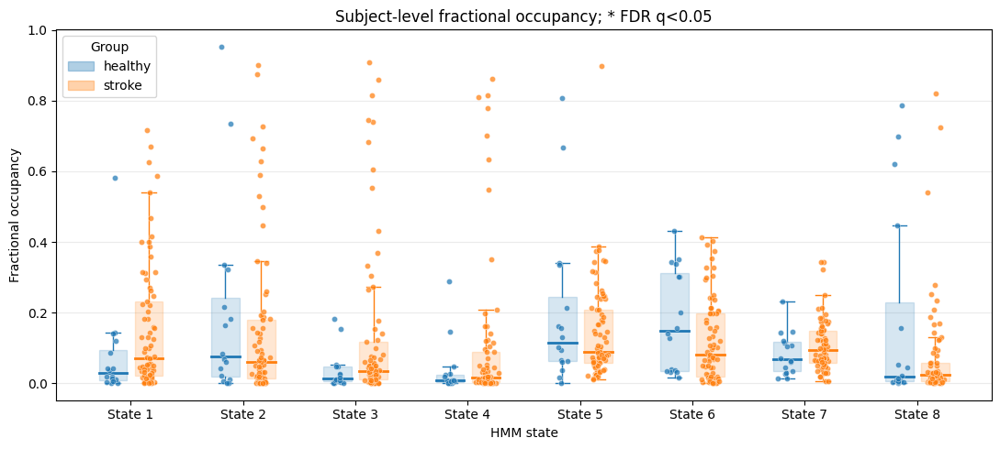

In [52]:
# Purpose: Test and plot healthy-versus-stroke fractional occupancy at subject level.
# Subject-level fractional occupancy inference and group plot.
fo_stat_rows = []
for state in range(n_states):
    healthy_values = fo_subject_df.loc[
        (fo_subject_df["group"] == "healthy")
        & (fo_subject_df["state"] == state),
        "fractional_occupancy",
    ].to_numpy()
    stroke_values = fo_subject_df.loc[
        (fo_subject_df["group"] == "stroke")
        & (fo_subject_df["state"] == state),
        "fractional_occupancy",
    ].to_numpy()
    difference, p_value = permutation_mean_difference(
        healthy_values,
        stroke_values,
        seed=STAT_RANDOM_SEED + state,
    )
    fo_stat_rows.append({
        "state": state + 1,
        "healthy_mean": healthy_values.mean(),
        "stroke_mean": stroke_values.mean(),
        "stroke_minus_healthy": difference,
        "hedges_g": hedges_g(healthy_values, stroke_values),
        "p_permutation": p_value,
    })

fo_inference_df = pd.DataFrame(fo_stat_rows)
fo_inference_df["q_fdr"] = fdr_bh(
    fo_inference_df["p_permutation"].to_numpy()
)
display(fo_inference_df)
fo_inference_df.to_csv(ROOT / "fractional_occupancy_inference.csv", index=False)

fig, ax = plt.subplots(figsize=(11, 5))
rng = np.random.default_rng(STAT_RANDOM_SEED)
colors = dict(zip(group_order, plt.rcParams["axes.prop_cycle"].by_key()["color"]))
positions = np.arange(1, n_states + 1)
width = 0.32

for group_index, group_name in enumerate(group_order):
    offset = (group_index - (len(group_order) - 1) / 2) * width
    for state in range(n_states):
        values = fo_subject_df.loc[
            (fo_subject_df["group"] == group_name)
            & (fo_subject_df["state"] == state),
            "fractional_occupancy",
        ].to_numpy()
        position = positions[state] + offset
        ax.boxplot(
            [values], positions=[position], widths=0.25,
            patch_artist=True, showfliers=False, manage_ticks=False,
            boxprops={"facecolor": colors[group_name], "edgecolor": colors[group_name], "alpha": 0.18},
            medianprops={"color": colors[group_name], "linewidth": 2},
            whiskerprops={"color": colors[group_name]},
            capprops={"color": colors[group_name]},
        )
        ax.scatter(
            position + rng.normal(0, 0.035, len(values)), values,
            s=20, color=colors[group_name], edgecolor="white",
            linewidth=0.35, alpha=0.72, zorder=3,
        )

for state, row in fo_inference_df.iterrows():
    stars = significance_stars(row["q_fdr"])
    if stars:
        state_values = fo_subject_df.loc[
            fo_subject_df["state"] == state, "fractional_occupancy"
        ].to_numpy()
        y = state_values.max() + 0.04
        ax.text(state + 1, y, stars, ha="center", va="bottom", fontsize=12)

ax.set_xticks(positions)
ax.set_xticklabels([f"State {state}" for state in positions])
ax.set_xlabel("HMM state")
ax.set_ylabel("Fractional occupancy")
ax.set_title("Subject-level fractional occupancy; * FDR q<0.05")
ax.grid(axis="y", alpha=0.25)
ax.legend(
    handles=[Patch(facecolor=colors[g], edgecolor=colors[g], alpha=0.35, label=g) for g in group_order],
    title="Group",
)
plt.tight_layout()
plt.show()

,healthy_mean_hz,stroke_mean_hz,stroke_minus_healthy_hz,hedges_g,p_permutation,significant_p05
0,13.239301,14.252888,1.013587,0.200843,0.463707,False


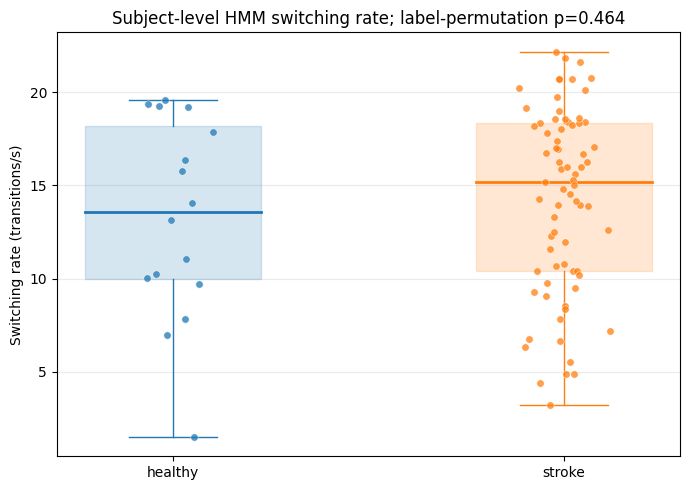

In [53]:
# Purpose: Compute subject switching rate without counting trial boundaries as transitions.
# Subject-level HMM switching rate: number of state transitions per second.
# Transitions are counted only within trials; trial boundaries are not treated as switches.
sampling_frequency = 250.0
switch_trial_rows = []

for trial_position, trial_stc in enumerate(stc):
    trial_stc = np.asarray(trial_stc)
    if trial_stc.ndim == 2:
        hard_states = np.argmax(trial_stc, axis=-1)
    elif trial_stc.ndim == 1:
        hard_states = trial_stc.astype(int)
    else:
        raise ValueError(f"Unexpected state-time-course shape: {trial_stc.shape}")

    n_opportunities = max(len(hard_states) - 1, 0)
    n_switches = int(np.count_nonzero(np.diff(hard_states)))
    meta = trial_meta.iloc[trial_position]
    switch_trial_rows.append({
        "subject_id": int(meta["subject_id"]),
        "group": meta["group"],
        "trial_idx": int(meta["trial_idx"]),
        "n_switches": n_switches,
        "transition_time_seconds": n_opportunities / sampling_frequency,
    })

switch_trial_df = pd.DataFrame(switch_trial_rows)
switch_subject_df = switch_trial_df.groupby(
    ["subject_id", "group"], as_index=False
)[["n_switches", "transition_time_seconds"]].sum()
switch_subject_df["switching_rate_hz"] = (
    switch_subject_df["n_switches"]
    / switch_subject_df["transition_time_seconds"]
)

healthy_switching = switch_subject_df.loc[
    switch_subject_df["group"] == "healthy", "switching_rate_hz"
].to_numpy()
stroke_switching = switch_subject_df.loc[
    switch_subject_df["group"] == "stroke", "switching_rate_hz"
].to_numpy()
switch_difference, switch_p = permutation_mean_difference(
    healthy_switching, stroke_switching, seed=STAT_RANDOM_SEED + 80
)

switching_rate_inference_df = pd.DataFrame([{
    "healthy_mean_hz": healthy_switching.mean(),
    "stroke_mean_hz": stroke_switching.mean(),
    "stroke_minus_healthy_hz": switch_difference,
    "hedges_g": hedges_g(healthy_switching, stroke_switching),
    "p_permutation": switch_p,
    "significant_p05": switch_p < STAT_ALPHA,
}])
display(switching_rate_inference_df)
switching_rate_inference_df.to_csv(
    ROOT / "switching_rate_inference.csv", index=False
)
switch_subject_df.to_csv(ROOT / "subject_switching_rates.csv", index=False)

fig, ax = plt.subplots(figsize=(7, 5))
rng = np.random.default_rng(STAT_RANDOM_SEED + 80)
colors = dict(zip(
    group_order, plt.rcParams["axes.prop_cycle"].by_key()["color"]
))
for group_index, group_name in enumerate(group_order, start=1):
    values = switch_subject_df.loc[
        switch_subject_df["group"] == group_name, "switching_rate_hz"
    ].to_numpy()
    ax.boxplot(
        [values], positions=[group_index], widths=0.45,
        patch_artist=True, showfliers=False, manage_ticks=False,
        boxprops={
            "facecolor": colors[group_name],
            "edgecolor": colors[group_name], "alpha": 0.18,
        },
        medianprops={"color": colors[group_name], "linewidth": 2},
        whiskerprops={"color": colors[group_name]},
        capprops={"color": colors[group_name]},
    )
    ax.scatter(
        group_index + rng.normal(0, 0.055, len(values)), values,
        s=28, color=colors[group_name], edgecolor="white",
        linewidth=0.4, alpha=0.75, zorder=3,
    )

stars = significance_stars(switch_p)
if stars:
    all_rates = switch_subject_df["switching_rate_hz"].to_numpy()
    y_range = np.ptp(all_rates) or max(abs(all_rates.mean()), 1.0)
    ax.text(1.5, all_rates.max() + 0.08 * y_range, stars,
            ha="center", va="bottom", fontsize=13)
ax.set_xticks([1, 2])
ax.set_xticklabels(group_order)
ax.set_ylabel("Switching rate (transitions/s)")
ax.set_title(
    f"Subject-level HMM switching rate; label-permutation p={switch_p:.3g}"
)
ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


In [54]:
# Purpose: Integrate subject spectra into broadband and canonical-band absolute power summaries.
# Subject-level broadband and canonical-band power, followed by group mean and SD.
power_frequency_range = (float(f.min()), float(f.max()))
frequency_bands = {
    "Delta": (1.0, 4.0),
    "Theta": (4.0, 8.0),
    "Alpha": (8.0, 13.0),
    "Beta": (13.0, 30.0),
}

def integrate_subject_power(subject_psd, frequency_range, average_parcels=True):
    low, high = frequency_range
    mask = (f >= low) & (f <= high)
    if mask.sum() < 2:
        raise ValueError(
            f"Frequency range {low:g}-{high:g} Hz contains fewer than two bins."
        )
    spectra = subject_psd[..., mask]
    if average_parcels:
        spectra = spectra.mean(axis=2)
    return np.trapz(spectra, x=f[mask], axis=-1)

power_rows = []
band_power_rows = []

for group_name in group_order:
    res = group_results[group_name]

    # Broadband parcel-averaged absolute and dynamic power: (subjects, states).
    state_power = integrate_subject_power(
        res["subject_psd"], power_frequency_range
    )
    dynamic_power = integrate_subject_power(
        res["subject_dynamic_psd"], power_frequency_range
    )
    res["subject_state_power"] = state_power
    res["subject_dynamic_power"] = dynamic_power

    for state in range(n_states):
        absolute = state_power[:, state]
        dynamic = dynamic_power[:, state]
        power_rows.append({
            "group": group_name,
            "state": state + 1,
            "n_subjects": len(absolute),
            "frequency_min_hz": power_frequency_range[0],
            "frequency_max_hz": power_frequency_range[1],
            "absolute_power_mean": absolute.mean(),
            "absolute_power_sd": absolute.std(ddof=1),
            "absolute_power_sem": (
                absolute.std(ddof=1) / np.sqrt(len(absolute))
            ),
            "dynamic_power_mean": dynamic.mean(),
            "dynamic_power_sd": dynamic.std(ddof=1),
            "dynamic_power_sem": (
                dynamic.std(ddof=1) / np.sqrt(len(dynamic))
            ),
        })

    # Canonical-band parcel-averaged absolute and dynamic power.
    # Each array has shape (subjects, states).
    res["subject_absolute_power_by_band"] = {}
    res["subject_dynamic_power_by_band"] = {}

    for band_name, band_range in frequency_bands.items():
        absolute_values = integrate_subject_power(
            res["subject_psd"], band_range
        )
        dynamic_values = integrate_subject_power(
            res["subject_dynamic_psd"], band_range
        )

        res["subject_absolute_power_by_band"][band_name] = absolute_values
        res["subject_dynamic_power_by_band"][band_name] = dynamic_values

        for state in range(n_states):
            absolute = absolute_values[:, state]
            dynamic = dynamic_values[:, state]
            band_power_rows.append({
                "group": group_name,
                "band": band_name,
                "state": state + 1,
                "n_subjects": len(absolute),
                "frequency_min_hz": band_range[0],
                "frequency_max_hz": band_range[1],
                "absolute_power_mean": absolute.mean(),
                "absolute_power_sd": absolute.std(ddof=1),
                "absolute_power_sem": (
                    absolute.std(ddof=1) / np.sqrt(len(absolute))
                ),
                "dynamic_power_mean": dynamic.mean(),
                "dynamic_power_sd": dynamic.std(ddof=1),
                "dynamic_power_sem": (
                    dynamic.std(ddof=1) / np.sqrt(len(dynamic))
                ),
            })

power_by_group_state = pd.DataFrame(power_rows)
band_power_by_group_state = pd.DataFrame(band_power_rows)

display(power_by_group_state)
display(band_power_by_group_state)

power_output = ROOT / "absolute_and_dynamic_power_by_state.csv"
band_power_output = ROOT / "absolute_and_dynamic_power_by_frequency_band.csv"
power_by_group_state.to_csv(power_output, index=False)
band_power_by_group_state.to_csv(band_power_output, index=False)
print("Saved:", power_output)
print("Saved:", band_power_output)

,group,state,n_subjects,frequency_min_hz,frequency_max_hz,absolute_power_mean,absolute_power_sd,absolute_power_sem,dynamic_power_mean,dynamic_power_sd,dynamic_power_sem
0,healthy,1,16,0.0,79.5,0.509944,0.112516,0.028129,-0.231291,0.112516,0.028129
1,healthy,2,16,0.0,79.5,0.595347,0.174204,0.043551,-0.145889,0.174204,0.043551
2,healthy,3,16,0.0,79.5,0.588929,0.223740,0.055935,-0.152307,0.223740,0.055935
3,healthy,4,16,0.0,79.5,0.551829,0.161475,0.040369,-0.189406,0.161475,0.040369
4,healthy,5,16,0.0,79.5,0.412083,0.090892,0.022723,-0.329153,0.090892,0.022723
5,healthy,6,16,0.0,79.5,1.068383,0.192565,0.048141,0.327148,0.192565,0.048141
6,healthy,7,16,0.0,79.5,1.658180,0.352350,0.088087,0.916944,0.352350,0.088087
7,healthy,8,16,0.0,79.5,0.768298,0.115546,0.028886,0.027062,0.115546,0.028886
8,stroke,1,73,0.0,79.5,0.536723,0.099282,0.011620,-0.204512,0.099282,0.011620
9,stroke,2,73,0.0,79.5,0.578885,0.124437,0.014564,-0.162351,0.124437,0.014564


,group,band,state,n_subjects,frequency_min_hz,frequency_max_hz,absolute_power_mean,absolute_power_sd,absolute_power_sem,dynamic_power_mean,dynamic_power_sd,dynamic_power_sem
0,healthy,Delta,1,16,1.0,4.0,0.042504,0.013255,0.003314,-0.051157,0.013255,0.003314
1,healthy,Delta,2,16,1.0,4.0,0.034318,0.009704,0.002426,-0.059342,0.009704,0.002426
2,healthy,Delta,3,16,1.0,4.0,0.072361,0.036729,0.009182,-0.021299,0.036729,0.009182
3,healthy,Delta,4,16,1.0,4.0,0.042340,0.017389,0.004347,-0.051320,0.017389,0.004347
4,healthy,Delta,5,16,1.0,4.0,0.039642,0.013781,0.003445,-0.054018,0.013781,0.003445
...,...,...,...,...,...,...,...,...,...,...,...,...
59,stroke,Beta,4,73,13.0,30.0,0.183782,0.043872,0.005135,-0.044076,0.043872,0.005135
60,stroke,Beta,5,73,13.0,30.0,0.139475,0.028687,0.003358,-0.088383,0.028687,0.003358
61,stroke,Beta,6,73,13.0,30.0,0.344996,0.084197,0.009855,0.117138,0.084197,0.009855
62,stroke,Beta,7,73,13.0,30.0,0.370425,0.079580,0.009314,0.142567,0.079580,0.009314


Saved: /workspace/nbenlamr/osl_results/absolute_and_dynamic_power_by_state.csv
Saved: /workspace/nbenlamr/osl_results/absolute_and_dynamic_power_by_frequency_band.csv


,band,state,healthy_mean_raw,stroke_mean_raw,stroke_to_healthy_geometric_ratio,welch_t_log_power,hedges_g_log_power,p_value,q_fdr
0,Delta,1,0.042504,0.049659,1.153002,1.654790,0.404854,0.110344,0.555674
1,Delta,2,0.034318,0.035546,1.041658,0.457918,0.134511,0.651802,0.834307
2,Delta,3,0.072361,0.102574,1.480564,2.364763,0.767109,0.028809,0.307293
3,Delta,4,0.042340,0.047907,1.155118,1.154896,0.354517,0.261840,0.644530
4,Delta,5,0.039642,0.036840,0.954091,-0.498197,-0.172477,0.624297,0.832395
5,Delta,6,0.095520,0.083452,0.864603,-2.181678,-0.537555,0.038740,0.309922
6,Delta,7,0.369318,0.396296,1.105388,0.975304,0.310191,0.341462,0.725724
7,Delta,8,0.080218,0.078940,0.986530,-0.122654,-0.035178,0.903543,0.958745
8,Theta,1,0.050659,0.056157,1.097197,1.398762,0.334150,0.173648,0.555674
9,Theta,2,0.041521,0.044020,1.069063,0.805325,0.244401,0.430082,0.725724


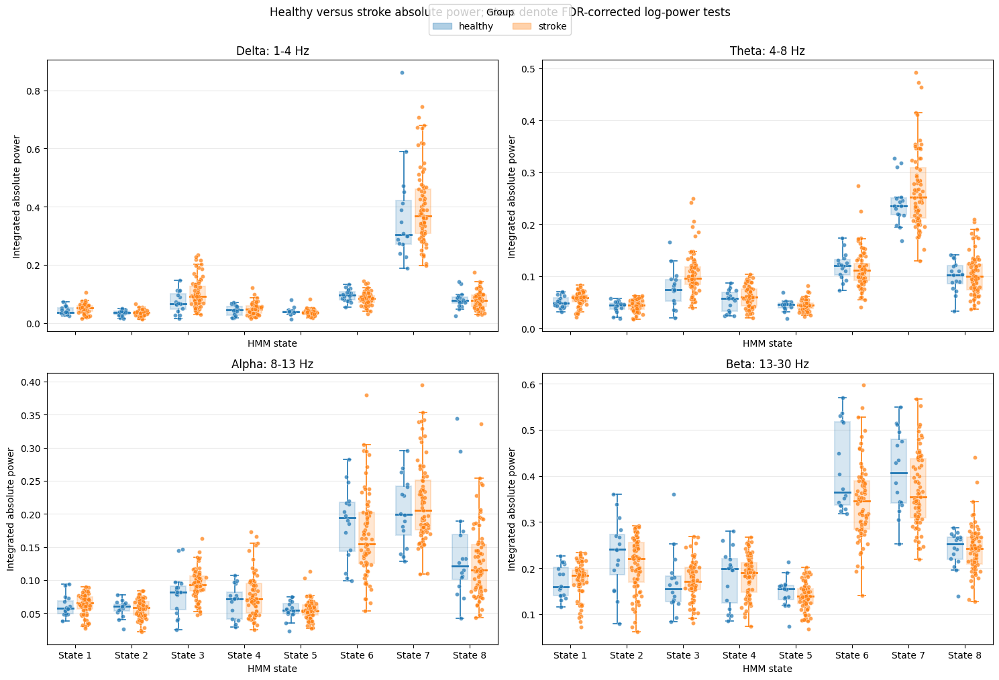

In [55]:
# Purpose: Test group differences in log band power and show raw-scale subject distributions.
# Absolute band-power inference and transparent subject-level boxplots.
# Inference is performed on log power; plotting remains on the original scale.
band_stat_rows = []
for band_name in frequency_bands:
    for state in range(n_states):
        healthy_raw = group_results["healthy"][
            "subject_absolute_power_by_band"
        ][band_name][:, state]
        stroke_raw = group_results["stroke"][
            "subject_absolute_power_by_band"
        ][band_name][:, state]
        positive_floor = np.finfo(float).tiny
        healthy_log = np.log(np.clip(healthy_raw, positive_floor, None))
        stroke_log = np.log(np.clip(stroke_raw, positive_floor, None))
        t_value, p_value, effect = welch_feature_test(
            healthy_log[:, np.newaxis], stroke_log[:, np.newaxis]
        )
        band_stat_rows.append({
            "band": band_name,
            "state": state + 1,
            "healthy_mean_raw": healthy_raw.mean(),
            "stroke_mean_raw": stroke_raw.mean(),
            "stroke_to_healthy_geometric_ratio": np.exp(
                stroke_log.mean() - healthy_log.mean()
            ),
            "welch_t_log_power": float(t_value),
            "hedges_g_log_power": float(effect),
            "p_value": float(p_value),
        })

band_inference_df = pd.DataFrame(band_stat_rows)
band_inference_df["q_fdr"] = fdr_bh(
    band_inference_df["p_value"].to_numpy()
)
display(band_inference_df)
band_inference_df.to_csv(
    ROOT / "absolute_band_power_inference.csv", index=False
)

fig, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axes = axes.ravel()
state_positions = np.arange(1, n_states + 1)
group_width = 0.34
box_width = 0.27
point_jitter = 0.045
rng = np.random.default_rng(STAT_RANDOM_SEED)
for ax, (band_name, (low, high)) in zip(axes, frequency_bands.items()):
    band_max = 0
    for group_index, group_name in enumerate(group_order):
        offset = (group_index - (len(group_order) - 1) / 2) * group_width
        color = group_colors[group_name]
        for state_index, state_position in enumerate(state_positions):
            values = group_results[group_name][
                "subject_absolute_power_by_band"
            ][band_name][:, state_index]
            band_max = max(band_max, np.nanmax(values))
            position = state_position + offset
            ax.boxplot(
                [values], positions=[position], widths=box_width,
                patch_artist=True, showfliers=False, manage_ticks=False,
                boxprops={"facecolor": color, "edgecolor": color, "alpha": 0.18, "linewidth": 1.5},
                medianprops={"color": color, "linewidth": 2},
                whiskerprops={"color": color, "linewidth": 1.2},
                capprops={"color": color, "linewidth": 1.2},
            )
            ax.scatter(
                np.full(len(values), position)
                + rng.normal(0, point_jitter, len(values)),
                values, s=20, color=color, edgecolor="white",
                linewidth=0.35, alpha=0.72, zorder=3,
            )

    band_stats = band_inference_df[
        band_inference_df["band"] == band_name
    ].sort_values("state")
    annotation_step = max(band_max * 0.035, np.finfo(float).eps)
    for _, row in band_stats.iterrows():
        stars = significance_stars(row["q_fdr"])
        if stars:
            state = int(row["state"])
            state_max = max(
                group_results[group_name]["subject_absolute_power_by_band"]
                [band_name][:, state - 1].max()
                for group_name in group_order
            )
            ax.text(
                state, state_max + annotation_step, stars,
                ha="center", va="bottom", fontsize=12,
            )

    ax.set_xticks(state_positions)
    ax.set_xticklabels([f"State {state}" for state in state_positions])
    ax.set_xlim(0.5, n_states + 0.5)
    ax.set_title(f"{band_name}: {low:g}-{high:g} Hz")
    ax.set_xlabel("HMM state")
    ax.set_ylabel("Integrated absolute power")
    ax.grid(axis="y", alpha=0.25)

legend_handles = [
    Patch(facecolor=group_colors[g], edgecolor=group_colors[g], alpha=0.35, label=g)
    for g in group_order
]
fig.legend(handles=legend_handles, title="Group", loc="upper center", ncol=len(group_order))
fig.suptitle(
    "Healthy versus stroke absolute power; stars denote FDR-corrected log-power tests",
    y=1.01,
)
plt.tight_layout()
plt.show()

,cluster,frequency_start_hz,frequency_end_hz,direction_stroke_minus_healthy,cluster_mass,p_cluster_fwer
0,1,14.5,23.5,-1.0,73.728377,0.028486


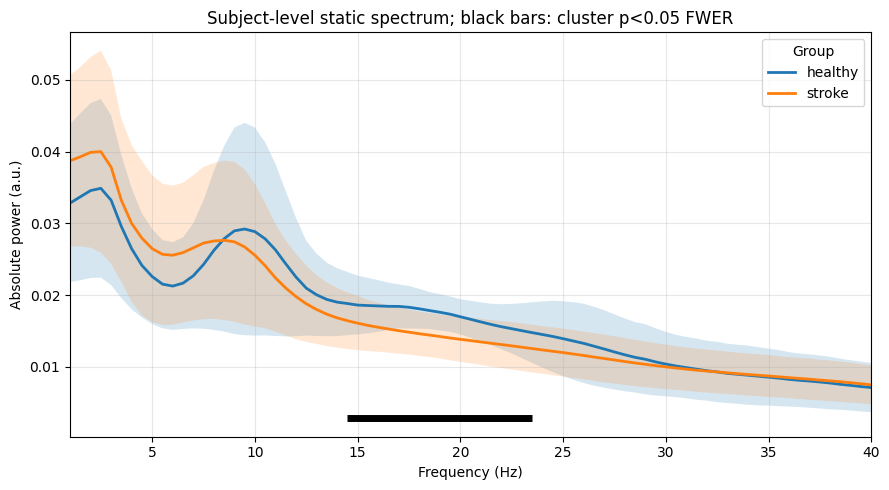

In [56]:
# Purpose: Compare subject-level static spectra with cluster-based permutation inference.
# Subject-balanced static spectra with cluster-based permutation inference.
static_subject_curves = {}
static_mask = (f >= 1) & (f <= 40)
f_static = f[static_mask]

for group_name in group_order:
    res = group_results[group_name]
    subject_fo = np.stack([
        fo_subject_df.loc[
            (fo_subject_df["subject_id"] == subject_id)
            & (fo_subject_df["group"] == group_name)
        ].sort_values("state")["fractional_occupancy"].to_numpy()
        for subject_id in res["subject_ids"]
    ])
    subject_static_psd = np.sum(
        res["subject_psd"] * subject_fo[:, :, np.newaxis, np.newaxis],
        axis=1,
    )
    static_subject_curves[group_name] = subject_static_psd.mean(axis=1)[:, static_mask]

positive_floor = np.finfo(float).tiny
static_cluster_result = cluster_permutation_1d(
    np.log(np.clip(static_subject_curves["healthy"], positive_floor, None)),
    np.log(np.clip(static_subject_curves["stroke"], positive_floor, None)),
    n_permutations=N_CLUSTER_PERMUTATIONS,
    seed=STAT_RANDOM_SEED + 100,
)

fig, ax = plt.subplots(figsize=(9, 5))
for group_name in group_order:
    curves = static_subject_curves[group_name]
    mean_curve = curves.mean(axis=0)
    sd_curve = curves.std(axis=0, ddof=1)
    ax.plot(
        f_static, mean_curve, linewidth=2,
        color=group_colors[group_name], label=group_name,
    )
    ax.fill_between(
        f_static, mean_curve - sd_curve, mean_curve + sd_curve,
        color=group_colors[group_name], alpha=0.18,
    )

cluster_rows = []
ymin, ymax = ax.get_ylim()
bar_y = ymin + 0.03 * (ymax - ymin)
for cluster_index, cluster in enumerate(static_cluster_result["clusters"], start=1):
    start, stop = cluster["start"], cluster["stop"]
    direction = np.sign(
        static_subject_curves["stroke"][:, start:stop].mean()
        - static_subject_curves["healthy"][:, start:stop].mean()
    )
    cluster_rows.append({
        "cluster": cluster_index,
        "frequency_start_hz": f_static[start],
        "frequency_end_hz": f_static[stop - 1],
        "direction_stroke_minus_healthy": direction,
        "cluster_mass": cluster["mass"],
        "p_cluster_fwer": cluster["p_cluster"],
    })
    if cluster["p_cluster"] < STAT_ALPHA:
        ax.plot(
            [f_static[start], f_static[stop - 1]], [bar_y, bar_y],
            color="black", linewidth=5, solid_capstyle="butt",
        )

static_spectrum_inference_df = pd.DataFrame(cluster_rows)
display(static_spectrum_inference_df)
static_spectrum_inference_df.to_csv(
    ROOT / "static_spectrum_cluster_inference.csv", index=False
)
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Absolute power (a.u.)")
ax.set_title("Subject-level static spectrum; black bars: cluster p<0.05 FWER")
ax.set_xlim(1, 40)
ax.grid(True, alpha=0.3)
ax.legend(title="Group")
plt.tight_layout()
plt.show()

,state,cluster,frequency_start_hz,frequency_end_hz,stroke_minus_healthy_raw_power,direction,cluster_mass,p_cluster_fwer_within_state,q_fdr_across_state_clusters
0,3,1,1.0,9.0,0.007797,stroke > healthy,41.148419,0.123938,0.231884
1,6,1,1.0,3.0,-0.004334,stroke < healthy,11.204318,0.231884,0.231884
2,6,2,14.5,24.5,-0.005238,stroke < healthy,67.348828,0.100950,0.231884
3,7,1,17.5,21.0,-0.003243,stroke < healthy,19.252580,0.196902,0.231884


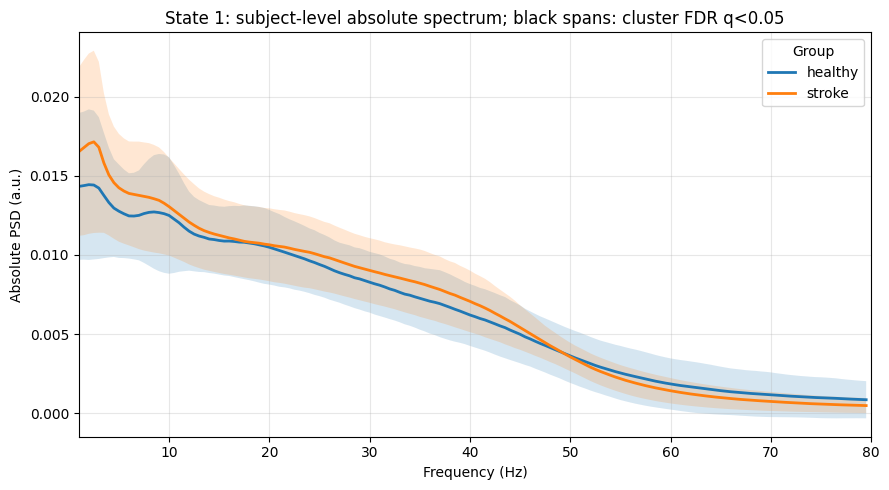

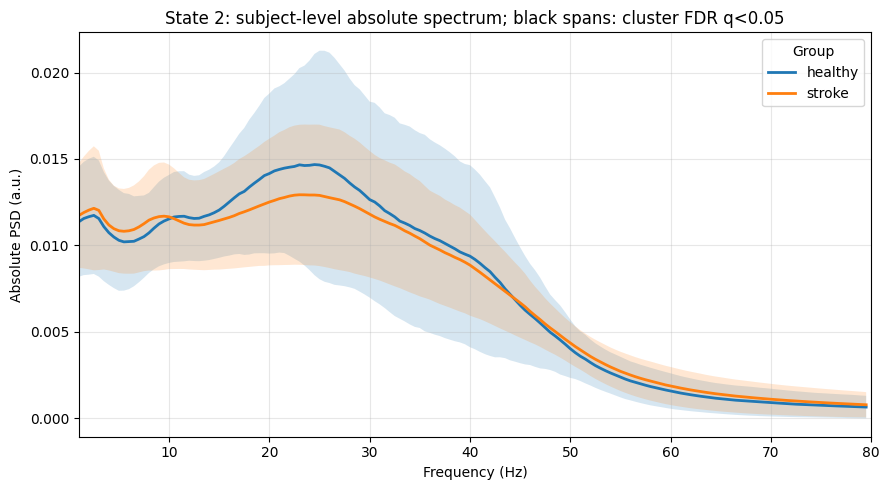

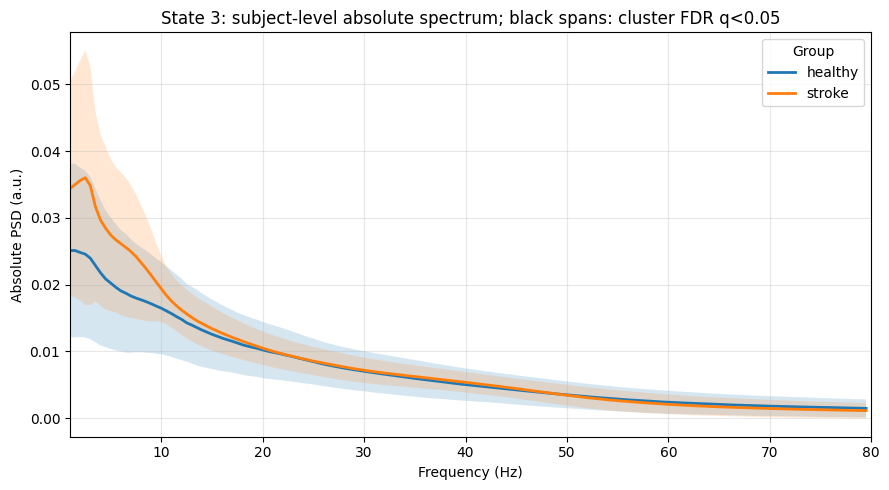

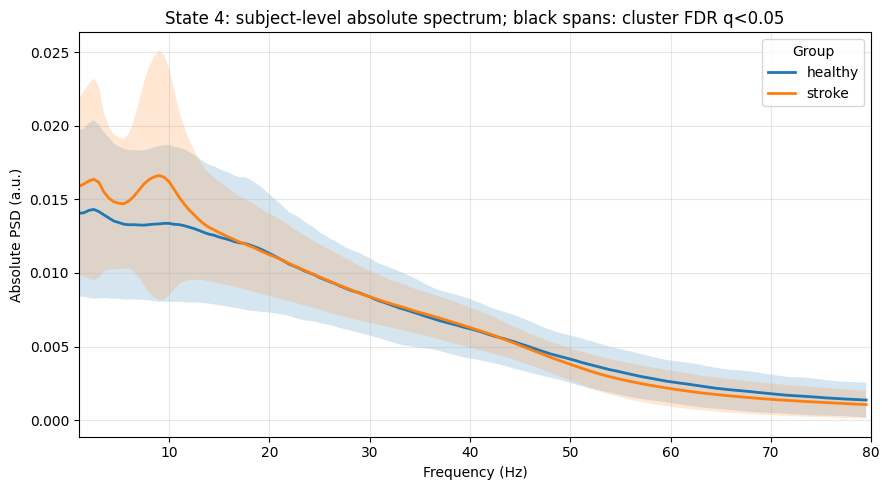

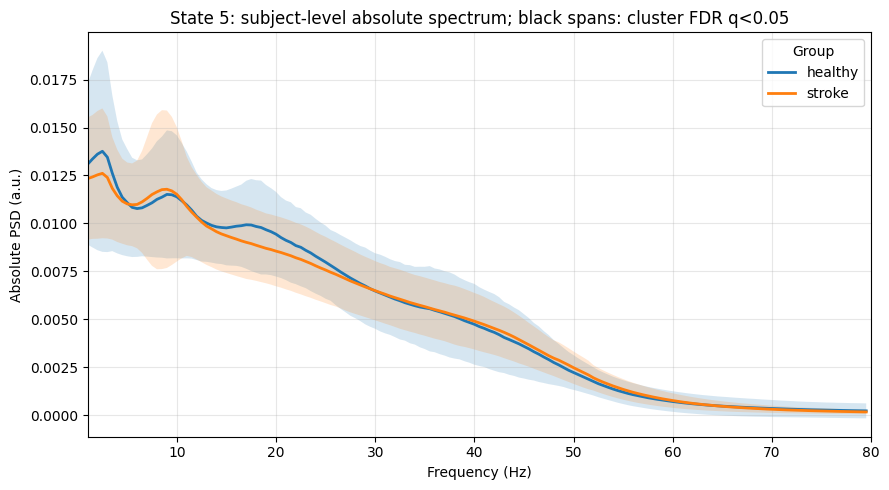

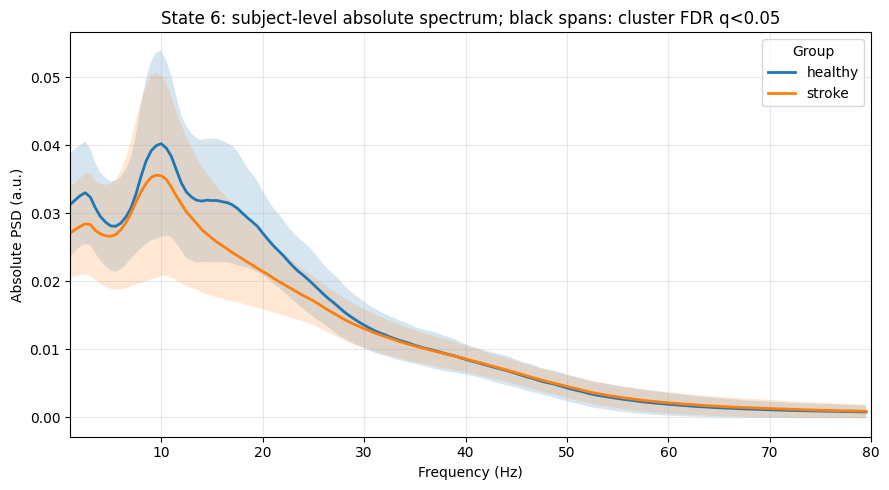

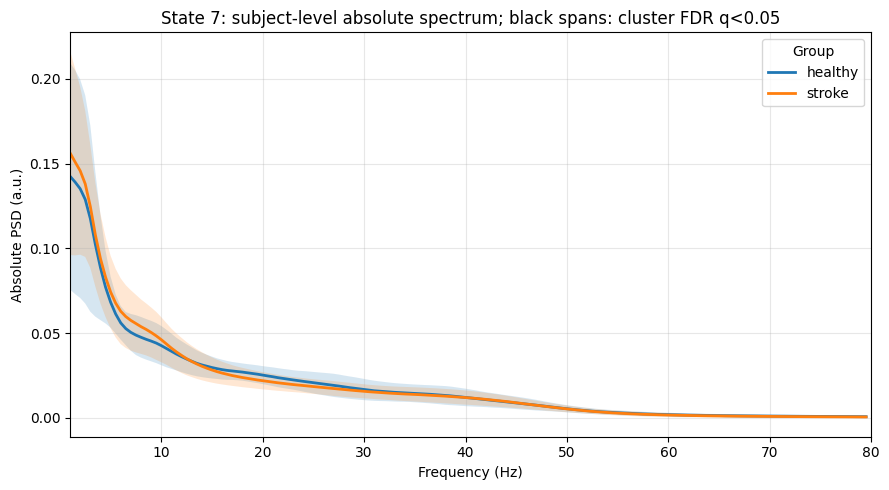

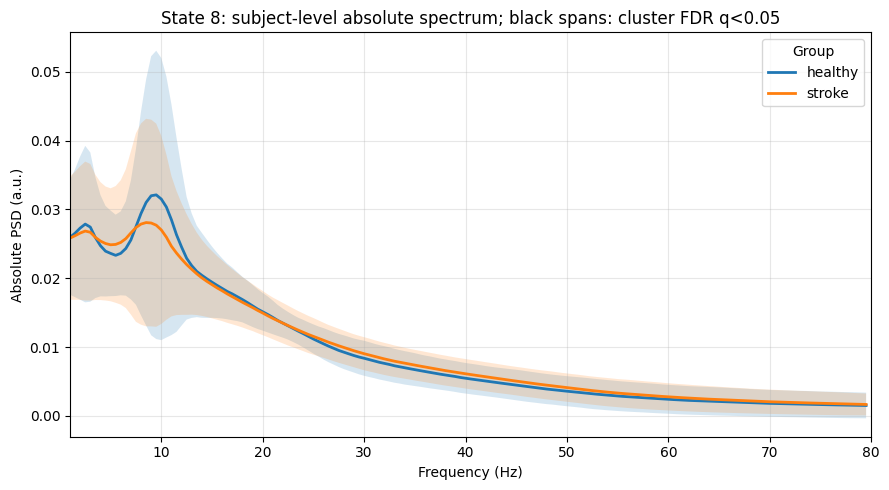

Displayed and saved subject-level absolute state spectra to: /workspace/nbenlamr/osl_results/spectra/absolute_state_spectra_healthy_vs_stroke


In [57]:
# Purpose: Compare subject-level state spectra over 1–80 Hz with cluster inference.
# Subject-level absolute spectrum for each HMM state with cluster inference.
from pathlib import Path

state_spectrum_mask = (f >= 1) & (f <= 80)
f_state_spectrum = f[state_spectrum_mask]
state_spectrum_output_dir = Path(
    "../../osl_results/spectra/absolute_state_spectra_healthy_vs_stroke"
)
state_spectrum_output_dir.mkdir(parents=True, exist_ok=True)

# Curves have shape (subjects, states, frequencies).
absolute_state_curves = {
    group_name: group_results[group_name]["subject_psd"].mean(axis=2)[
        :, :, state_spectrum_mask
    ]
    for group_name in group_order
}

state_spectrum_cluster_results = {}
state_spectrum_rows = []
positive_floor = np.finfo(float).tiny

for state in range(n_states):
    healthy_curves = absolute_state_curves["healthy"][:, state, :]
    stroke_curves = absolute_state_curves["stroke"][:, state, :]

    # Test log power because absolute PSD is positive and right-skewed.
    result = cluster_permutation_1d(
        np.log(np.clip(healthy_curves, positive_floor, None)),
        np.log(np.clip(stroke_curves, positive_floor, None)),
        n_permutations=N_CLUSTER_PERMUTATIONS,
        seed=STAT_RANDOM_SEED + 2000 + state,
    )
    state_spectrum_cluster_results[state] = result

    for cluster_index, cluster in enumerate(result["clusters"], start=1):
        start, stop = cluster["start"], cluster["stop"]
        raw_difference = (
            stroke_curves[:, start:stop].mean()
            - healthy_curves[:, start:stop].mean()
        )
        state_spectrum_rows.append({
            "state": state + 1,
            "cluster": cluster_index,
            "frequency_start_hz": f_state_spectrum[start],
            "frequency_end_hz": f_state_spectrum[stop - 1],
            "stroke_minus_healthy_raw_power": raw_difference,
            "direction": (
                "stroke > healthy" if raw_difference > 0
                else "stroke < healthy"
            ),
            "cluster_mass": cluster["mass"],
            "p_cluster_fwer_within_state": cluster["p_cluster"],
        })

state_spectrum_inference_df = pd.DataFrame(state_spectrum_rows)
if len(state_spectrum_inference_df):
    state_spectrum_inference_df["q_fdr_across_state_clusters"] = fdr_bh(
        state_spectrum_inference_df[
            "p_cluster_fwer_within_state"
        ].to_numpy()
    )
else:
    state_spectrum_inference_df[
        "q_fdr_across_state_clusters"
    ] = pd.Series(dtype=float)

display(state_spectrum_inference_df)
state_spectrum_inference_df.to_csv(
    ROOT / "absolute_state_spectrum_cluster_inference.csv",
    index=False,
)

# Attach global FDR values back to the cluster dictionaries.
if len(state_spectrum_inference_df):
    for _, row in state_spectrum_inference_df.iterrows():
        cluster = state_spectrum_cluster_results[
            int(row["state"]) - 1
        ]["clusters"][int(row["cluster"]) - 1]
        cluster["q_global"] = row["q_fdr_across_state_clusters"]

for state in range(n_states):
    fig, ax = plt.subplots(figsize=(9, 5))

    for group_name in group_order:
        curves = absolute_state_curves[group_name][:, state, :]
        mean_curve = curves.mean(axis=0)
        sd_curve = curves.std(axis=0, ddof=1)
        ax.plot(
            f_state_spectrum,
            mean_curve,
            linewidth=2,
            color=group_colors[group_name],
            label=group_name,
        )
        ax.fill_between(
            f_state_spectrum,
            mean_curve - sd_curve,
            mean_curve + sd_curve,
            color=group_colors[group_name],
            alpha=0.18,
        )

    ymin, ymax = ax.get_ylim()
    bar_y = ymin + 0.035 * (ymax - ymin)
    for cluster in state_spectrum_cluster_results[state]["clusters"]:
        if cluster.get("q_global", 1.0) < STAT_ALPHA:
            start, stop = cluster["start"], cluster["stop"]
            ax.axvspan(
                f_state_spectrum[start],
                f_state_spectrum[stop - 1],
                color="black",
                alpha=0.08,
            )
            ax.plot(
                [f_state_spectrum[start], f_state_spectrum[stop - 1]],
                [bar_y, bar_y],
                color="black",
                linewidth=5,
                solid_capstyle="butt",
            )

    ax.set_xlim(1, 80)
    ax.set_xlabel("Frequency (Hz)")
    ax.set_ylabel("Absolute PSD (a.u.)")
    ax.set_title(
        f"State {state + 1}: subject-level absolute spectrum; "
        "black spans: cluster FDR q<0.05"
    )
    ax.grid(True, alpha=0.3)
    ax.legend(title="Group")
    plt.tight_layout()

    base = state_spectrum_output_dir / (
        f"absolute_psd_state_{state + 1:02d}_healthy_vs_stroke"
    )
    fig.savefig(base.with_suffix(".png"), dpi=300, bbox_inches="tight")
    fig.savefig(base.with_suffix(".pdf"), bbox_inches="tight")
    plt.show()
    plt.close(fig)

print(
    "Displayed and saved subject-level absolute state spectra to:",
    state_spectrum_output_dir.resolve(),
)

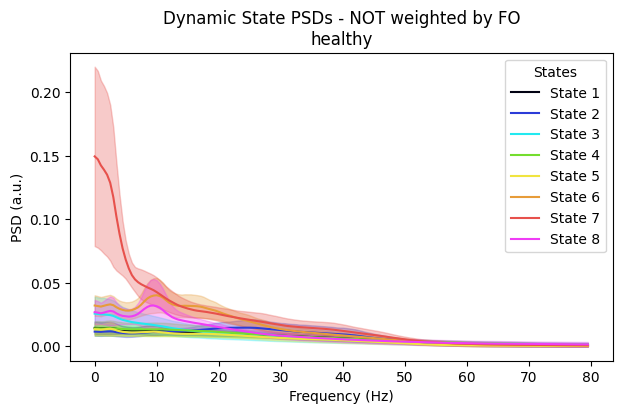

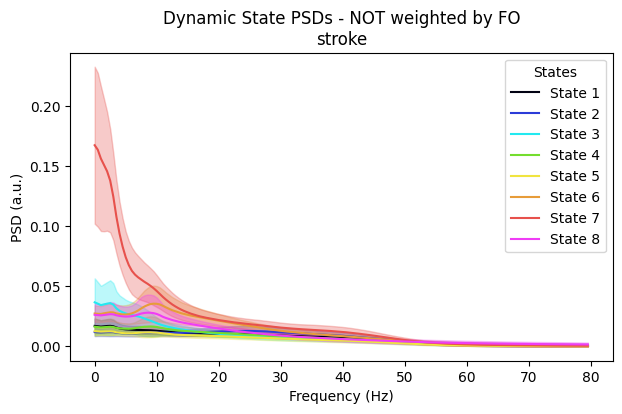

In [58]:
# Purpose: Plot descriptive state spectra separately for each group.
#Dynamic State PSDs: One Figure Per Group
for group_name, res in group_results.items():
    gpsd_static_mean_channels = res["gpsd_static_mean_channels"]
    gpsd_static_mean_channels_err = res["gpsd_static_mean_channels_err"]

    fig, ax = plotting.plot_line(
        [f] * gpsd_static_mean_channels.shape[0],
        gpsd_static_mean_channels,
        errors=[
            gpsd_static_mean_channels - gpsd_static_mean_channels_err,
            gpsd_static_mean_channels + gpsd_static_mean_channels_err,
        ],
        labels=[f"State {i + 1}" for i in range(gpsd_static_mean_channels.shape[0])],
        x_label="Frequency (Hz)",
        y_label="PSD (a.u.)",
        title=f"Dynamic State PSDs - NOT weighted by FO\n{group_name}",
    )

    for i, line in enumerate(ax.lines):
        line.set_color(color_list[i])

    for i, poly in enumerate(ax.collections):
        poly.set_facecolor(color_list[i])
        poly.set_edgecolor(color_list[i])

    if ax.legend_ is not None:
        ax.legend_.remove()

    ax.legend(
        handles=ax.lines,
        labels=[f"State {i+1}" for i in range(gpsd_static_mean_channels.shape[0])],
        title="States",
    )

    plt.show()

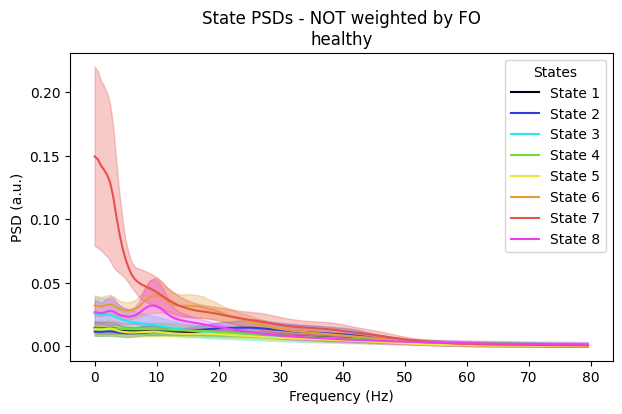

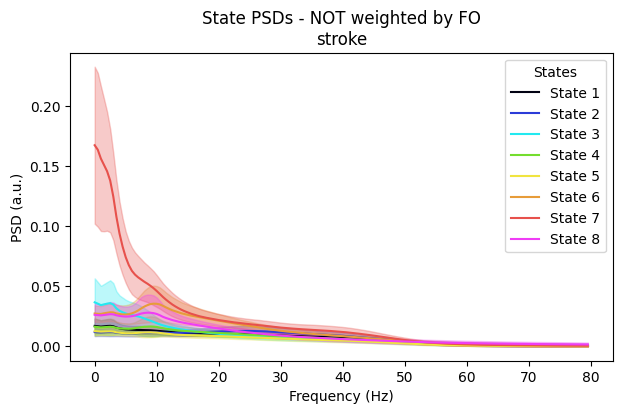

In [59]:
# Purpose: Plot state-resolved absolute spectra with across-subject uncertainty for each group.
for group_name, res in group_results.items():
    gpsd_static_mean_channels = res["gpsd_static_mean_channels"]
    gpsd_static_mean_channels_err = res["gpsd_static_mean_channels_err"]
    n_states = gpsd_static_mean_channels.shape[0]

    fig, ax = plotting.plot_line(
        [f] * n_states,
        gpsd_static_mean_channels,
        errors=[
            gpsd_static_mean_channels - gpsd_static_mean_channels_err,
            gpsd_static_mean_channels + gpsd_static_mean_channels_err,
        ],
        labels=[f"State {i + 1}" for i in range(n_states)],
        x_label="Frequency (Hz)",
        y_label="PSD (a.u.)",
        title=f"State PSDs - NOT weighted by FO\n{group_name}",
    )

    for i, line in enumerate(ax.lines):
        line.set_color(color_list[i])

    for i, poly in enumerate(ax.collections):
        poly.set_facecolor(color_list[i])
        poly.set_edgecolor(color_list[i])

    if ax.legend_ is not None:
        ax.legend_.remove()

    ax.legend(
        handles=ax.lines,
        labels=[f"State {i+1}" for i in range(n_states)],
        title="States",
    )

    plt.show()

In [ ]:
# Purpose: Plot genuinely FO-weighted state PSDs over 0-40 Hz for each group.
# Each subject state spectrum is multiplied by that subjects state-specific FO
# before calculating the group mean and SD across subjects.
from pathlib import Path

required_objects = ["f", "group_results", "fo_subject_df", "group_order", "color_list"]
missing_objects = [name for name in required_objects if name not in globals()]
if missing_objects:
    raise RuntimeError(
        "Run the spectral aggregation and fractional-occupancy cells first. "
        f"Missing: {missing_objects}"
    )

frequency_mask_40hz = (f >= 0) & (f <= 40)
f_40hz = f[frequency_mask_40hz]
fo_weighted_output_dir = Path(
    "../../osl_results/spectra/fo_weighted_state_psd_0_40hz"
)
fo_weighted_output_dir.mkdir(parents=True, exist_ok=True)

fo_weighted_state_psd = {}
for group_name in group_order:
    result = group_results[group_name]
    subject_ids = np.asarray(result["subject_ids"], dtype=int)

    # Match one eight-state FO vector to every subject in the PSD array.
    subject_fo = np.stack([
        fo_subject_df.loc[
            (fo_subject_df["subject_id"] == subject_id)
            & (fo_subject_df["group"] == group_name)
        ].sort_values("state")["fractional_occupancy"].to_numpy(float)
        for subject_id in subject_ids
    ])
    if subject_fo.shape != (len(subject_ids), n_states):
        raise ValueError(
            f"Unexpected FO shape for {group_name}: {subject_fo.shape}; "
            f"expected {(len(subject_ids), n_states)}."
        )

    # subject_psd: subjects x states x parcels x frequencies.
    subject_state_spectra = result["subject_psd"].mean(axis=2)[
        :, :, frequency_mask_40hz
    ]
    weighted_subject_spectra = (
        subject_state_spectra * subject_fo[:, :, np.newaxis]
    )
    fo_weighted_state_psd[group_name] = weighted_subject_spectra

    group_mean = weighted_subject_spectra.mean(axis=0)
    group_sd = weighted_subject_spectra.std(axis=0, ddof=1)

    fig, ax = plt.subplots(figsize=(9, 5.5))
    for state in range(n_states):
        color = color_list[state]
        ax.plot(
            f_40hz,
            group_mean[state],
            color=color,
            linewidth=2,
            label=f"State {state + 1}",
        )
        ax.fill_between(
            f_40hz,
            group_mean[state] - group_sd[state],
            group_mean[state] + group_sd[state],
            color=color,
            alpha=0.18,
        )

    ax.set_xlim(0, 40)
    ax.set_xlabel("Frequency (Hz)")
    ax.set_ylabel("FO-weighted PSD (a.u.)")
    ax.set_title(
        "State PSDs weighted by subject-level fractional occupancy\n"
        f"{group_name}"
    )
    ax.grid(True, alpha=0.25)
    ax.legend(title="States", loc="upper right")
    plt.tight_layout()

    base = fo_weighted_output_dir / f"fo_weighted_state_psd_{group_name}_0_40hz"
    fig.savefig(base.with_suffix(".png"), dpi=300, bbox_inches="tight")
    fig.savefig(base.with_suffix(".pdf"), bbox_inches="tight")
    plt.show()

print(f"Saved FO-weighted 0-40 Hz figures to: {fo_weighted_output_dir.resolve()}")


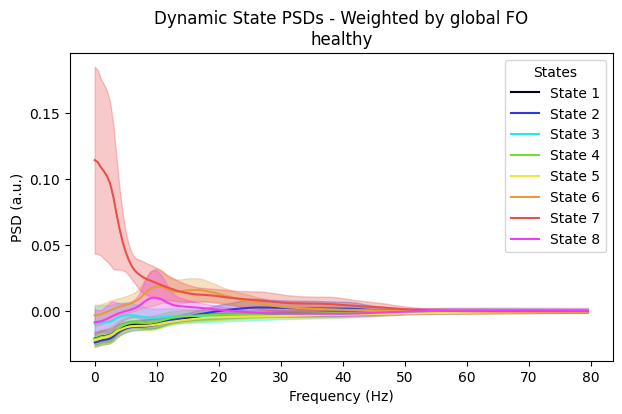

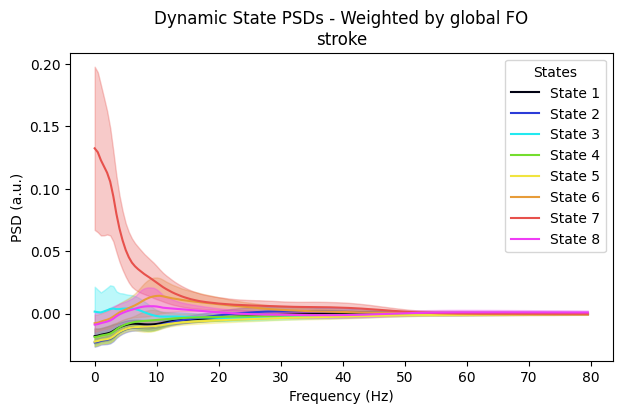

In [60]:
# Purpose: Plot centered dynamic spectra with across-subject uncertainty for each group.
for group_name, res in group_results.items():
    gpsd_dyn_mean_channels = res["gpsd_dyn_mean_channels"]
    gpsd_dyn_mean_channels_err = res["gpsd_dyn_mean_channels_err"]
    n_states = gpsd_dyn_mean_channels.shape[0]

    fig, ax = plotting.plot_line(
        [f] * n_states,
        gpsd_dyn_mean_channels,
        errors=[
            gpsd_dyn_mean_channels - gpsd_dyn_mean_channels_err,
            gpsd_dyn_mean_channels + gpsd_dyn_mean_channels_err,
        ],
        labels=[f"State {i + 1}" for i in range(n_states)],
        x_label="Frequency (Hz)",
        y_label="PSD (a.u.)",
        title=f"Dynamic State PSDs - Weighted by global FO\n{group_name}",
    )

    for i, line in enumerate(ax.lines):
        line.set_color(color_list[i])

    for i, poly in enumerate(ax.collections):
        poly.set_facecolor(color_list[i])
        poly.set_edgecolor(color_list[i])

    if ax.legend_ is not None:
        ax.legend_.remove()

    ax.legend(
        handles=ax.lines,
        labels=[f"State {i+1}" for i in range(n_states)],
        title="States",
    )

    plt.show()

,state,band,cluster_index,frequency_start_hz,frequency_end_hz,cluster_mass,p_cluster_fwer_within_panel,q_fdr_across_all_clusters
0,3,Delta,0,1.0,4.0,19.035996,0.018991,0.059470
1,3,Theta,0,4.0,8.0,23.744602,0.012494,0.059470
2,3,Alpha,0,8.0,9.0,6.983747,0.068466,0.095852
3,6,Delta,0,1.5,2.5,6.535395,0.051974,0.090955
4,6,Beta,0,15.0,24.0,55.519159,0.025487,0.059470
5,7,Theta,0,6.0,7.0,6.274130,0.095952,0.099450
6,7,Beta,0,18.0,21.0,15.790579,0.099450,0.099450


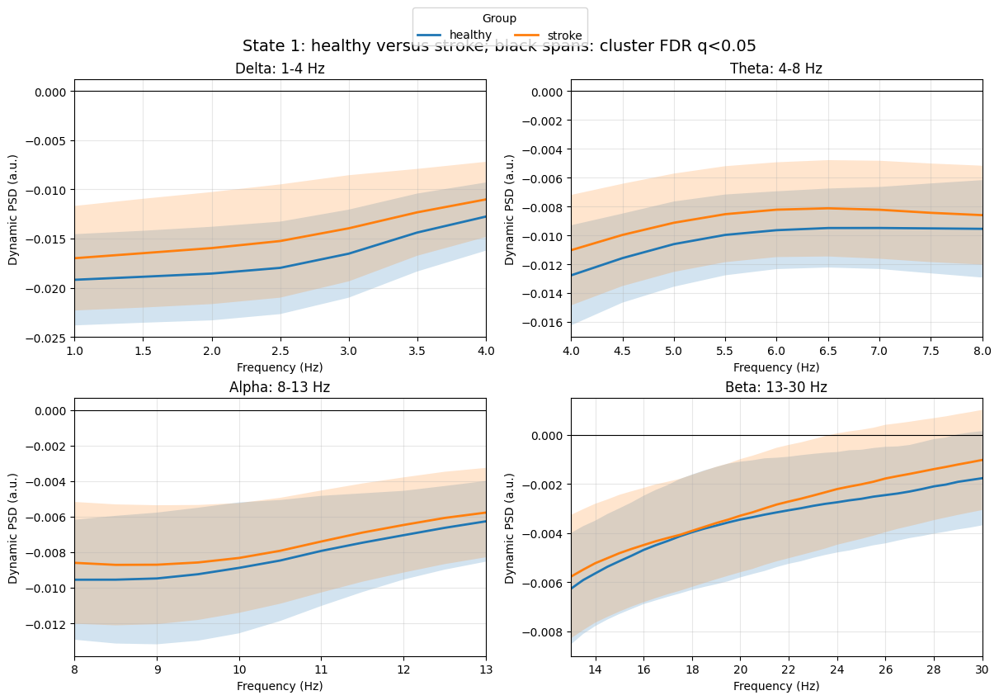

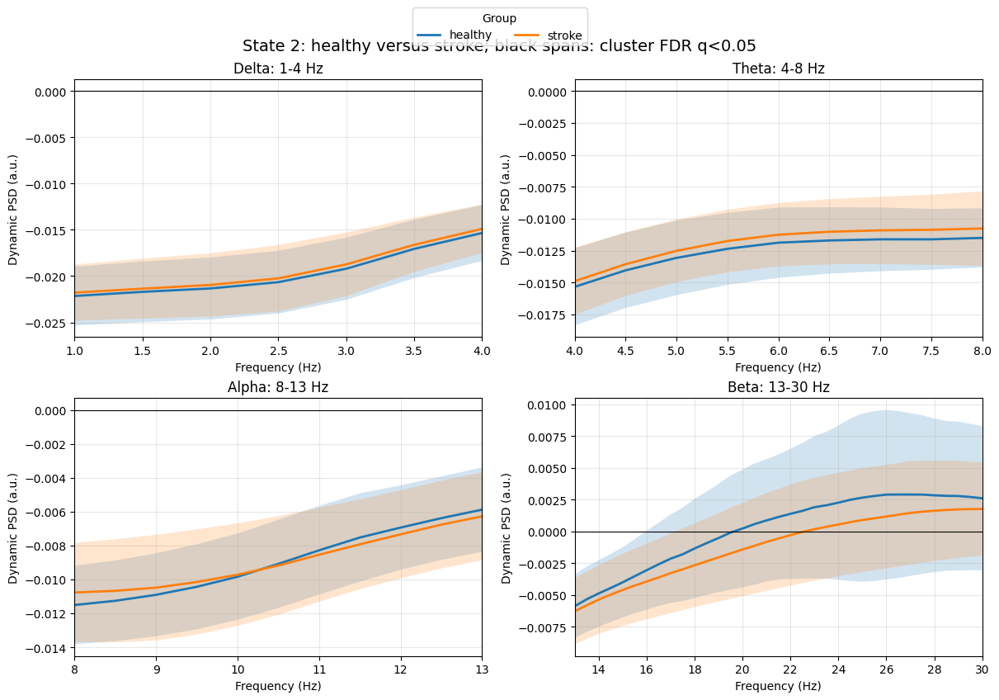

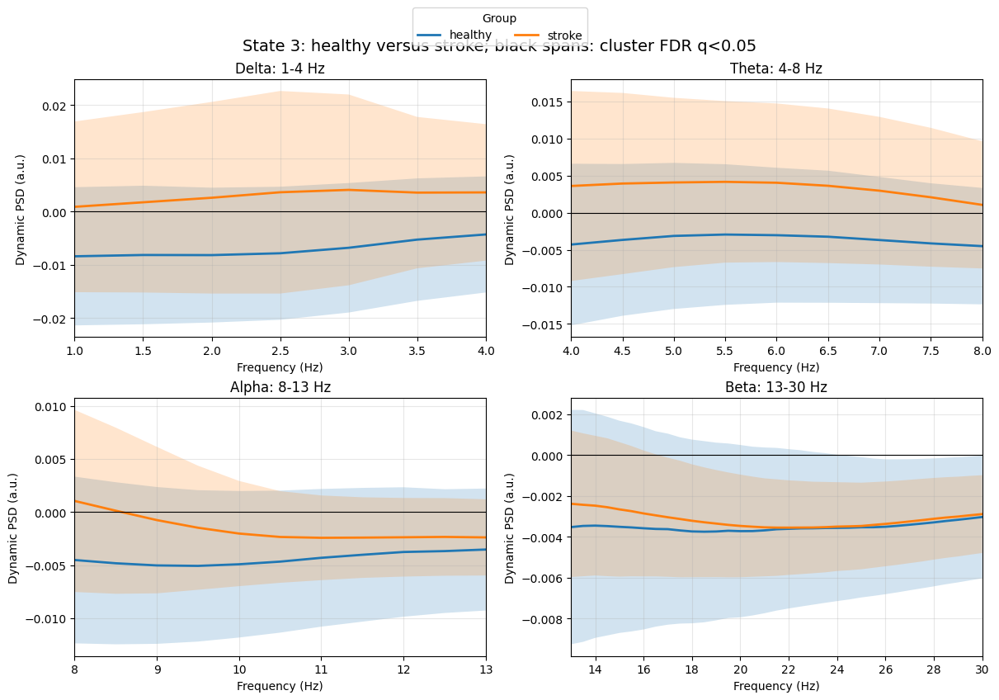

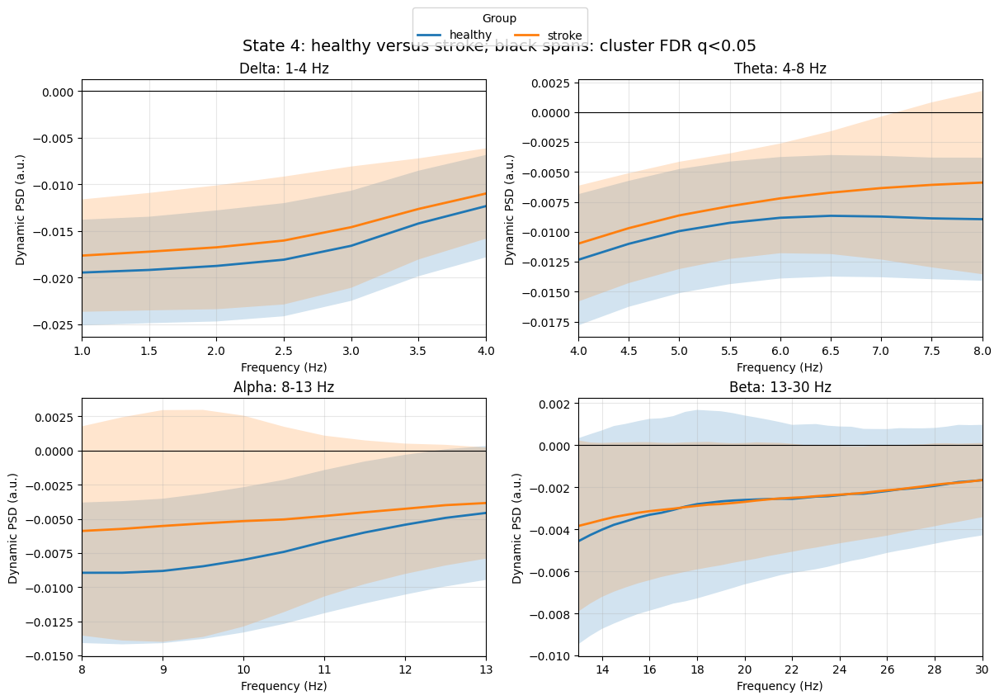

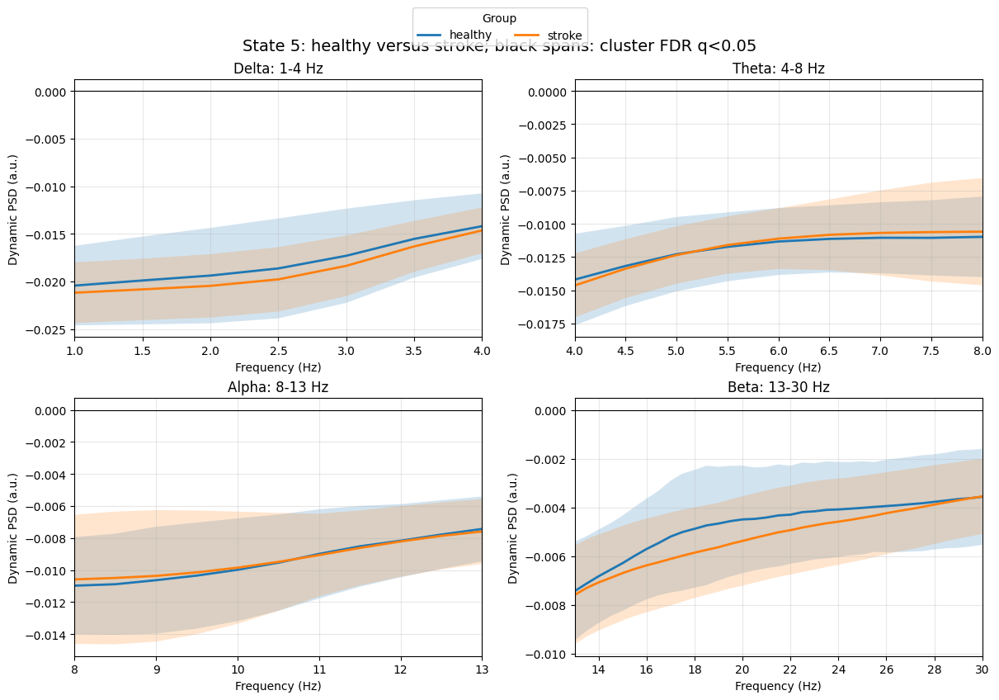

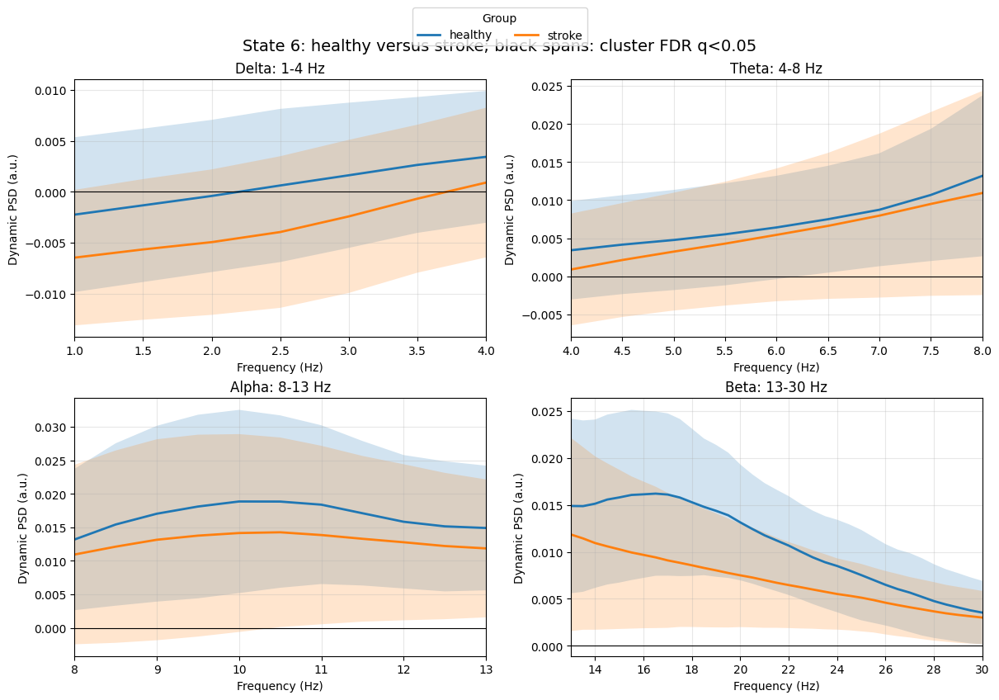

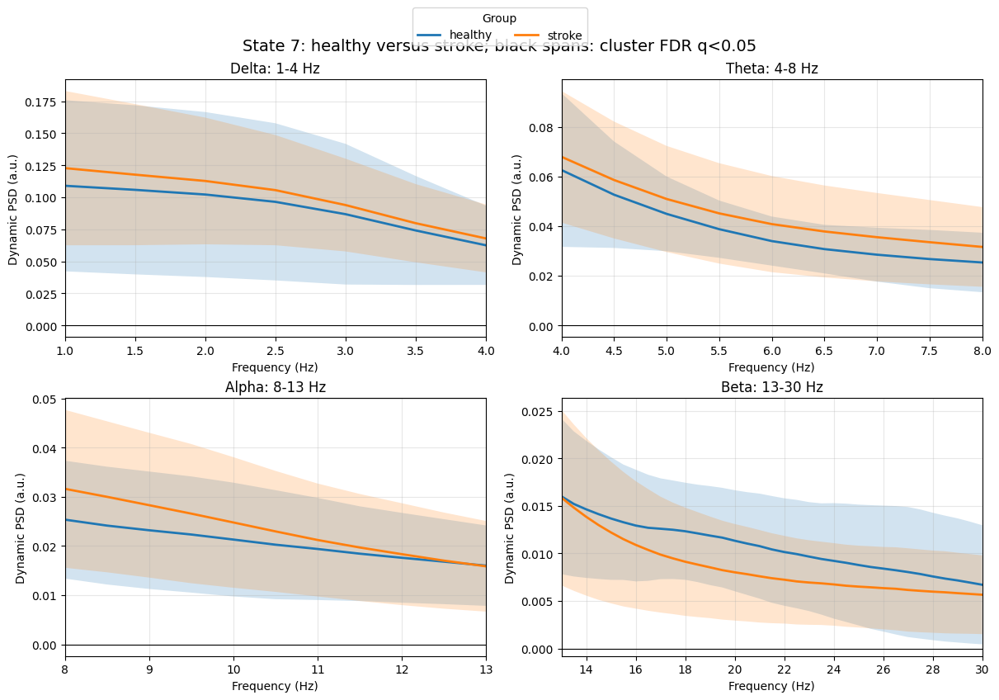

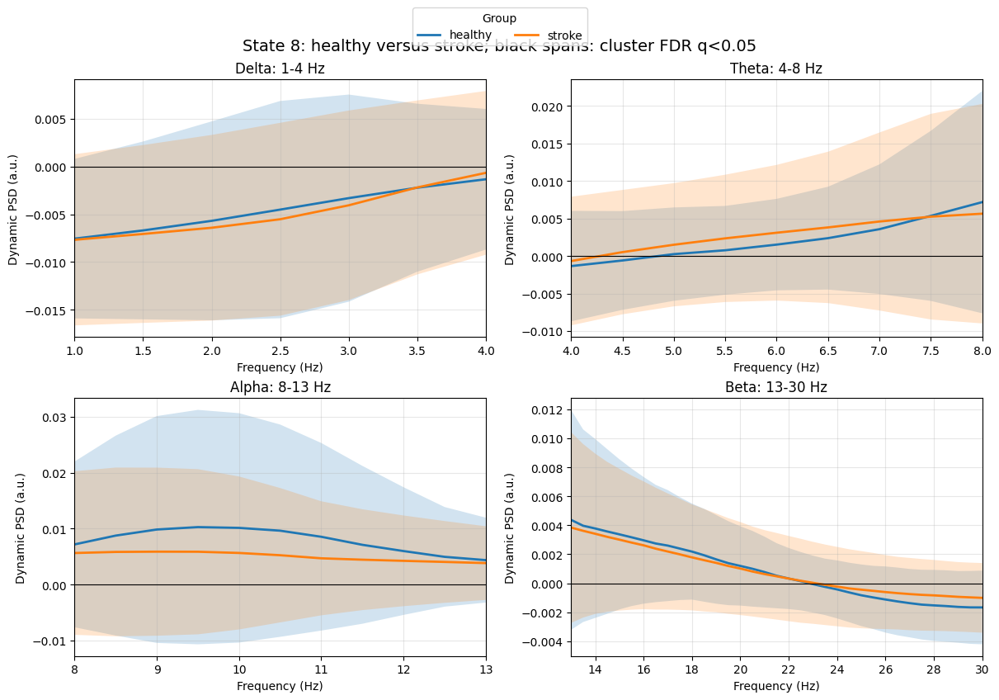

Displayed and saved state-by-band PSD figures to: /workspace/nbenlamr/osl_results/spectra/state_psd_by_band_healthy_vs_stroke


In [61]:
# Purpose: Compare healthy and stroke dynamic PSD within each state and canonical band.
# State-by-band dynamic PSD with cluster-based permutation inference.
from pathlib import Path

n_states = group_results[group_order[0]]["subject_dynamic_psd"].shape[1]
output_dir = Path("../../osl_results/spectra/state_psd_by_band_healthy_vs_stroke")
output_dir.mkdir(parents=True, exist_ok=True)

spectral_cluster_results = {}
all_cluster_records = []
for state in range(n_states):
    for band_index, (band_name, (low, high)) in enumerate(frequency_bands.items()):
        band_mask = (f >= low) & (f <= high)
        healthy_curves = group_results["healthy"]["subject_dynamic_psd"][:, state].mean(axis=1)[:, band_mask]
        stroke_curves = group_results["stroke"]["subject_dynamic_psd"][:, state].mean(axis=1)[:, band_mask]
        result = cluster_permutation_1d(
            healthy_curves, stroke_curves,
            n_permutations=N_CLUSTER_PERMUTATIONS,
            seed=STAT_RANDOM_SEED + 1000 + state * 10 + band_index,
        )
        spectral_cluster_results[(state, band_name)] = result
        for cluster_index, cluster in enumerate(result["clusters"]):
            record = {
                "state": state + 1,
                "band": band_name,
                "cluster_index": cluster_index,
                "frequency_start_hz": f[band_mask][cluster["start"]],
                "frequency_end_hz": f[band_mask][cluster["stop"] - 1],
                "cluster_mass": cluster["mass"],
                "p_cluster_fwer_within_panel": cluster["p_cluster"],
            }
            all_cluster_records.append(record)

if all_cluster_records:
    cluster_q = fdr_bh(np.array([
        record["p_cluster_fwer_within_panel"]
        for record in all_cluster_records
    ]))
    for record, q_value in zip(all_cluster_records, cluster_q):
        record["q_fdr_across_all_clusters"] = q_value
        spectral_cluster_results[
            (record["state"] - 1, record["band"])
        ]["clusters"][record["cluster_index"]]["q_global"] = q_value

spectral_cluster_inference_df = pd.DataFrame(all_cluster_records)
display(spectral_cluster_inference_df)
spectral_cluster_inference_df.to_csv(
    ROOT / "state_psd_cluster_inference.csv", index=False
)

for state in range(n_states):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
    axes = axes.ravel()
    for ax, (band_name, (low, high)) in zip(axes, frequency_bands.items()):
        band_mask = (f >= low) & (f <= high)
        f_band = f[band_mask]
        curves_by_group = {}
        for group_name in group_order:
            curves = group_results[group_name]["subject_dynamic_psd"][:, state].mean(axis=1)[:, band_mask]
            curves_by_group[group_name] = curves
            mean_curve = curves.mean(axis=0)
            sd_curve = curves.std(axis=0, ddof=1)
            ax.plot(
                f_band, mean_curve, linewidth=2,
                color=group_colors[group_name], label=group_name,
            )
            ax.fill_between(
                f_band, mean_curve - sd_curve, mean_curve + sd_curve,
                color=group_colors[group_name], alpha=0.2,
            )

        ax.axhline(0, color="black", linewidth=0.8)
        ymin, ymax = ax.get_ylim()
        bar_y = ymin + 0.04 * (ymax - ymin)
        for cluster in spectral_cluster_results[(state, band_name)]["clusters"]:
            if cluster.get("q_global", 1.0) < STAT_ALPHA:
                start, stop = cluster["start"], cluster["stop"]
                ax.axvspan(f_band[start], f_band[stop - 1], color="black", alpha=0.08)
                ax.plot(
                    [f_band[start], f_band[stop - 1]], [bar_y, bar_y],
                    color="black", linewidth=4, solid_capstyle="butt",
                )

        ax.set_xlim(low, high)
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Dynamic PSD (a.u.)")
        ax.set_title(f"{band_name}: {low:g}-{high:g} Hz")
        ax.grid(True, alpha=0.3)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Group", loc="upper center", ncol=len(group_order), bbox_to_anchor=(0.5, 1.05))
    fig.suptitle(
        f"State {state + 1}: healthy versus stroke; black spans: cluster FDR q<0.05",
        fontsize=14,
    )
    base = output_dir / f"dynamic_psd_state_{state + 1:02d}_frequency_bands_healthy_vs_stroke"
    fig.savefig(base.with_suffix(".png"), dpi=300, bbox_inches="tight")
    fig.savefig(base.with_suffix(".pdf"), bbox_inches="tight")
    plt.show()
    plt.close(fig)

print(f"Displayed and saved state-by-band PSD figures to: {output_dir.resolve()}")

### Feature extraction: **spatial** features

- Load mask and parcellation files for spatial visualization

In [62]:
# Purpose: Import Nilearn plotting utilities for atlas and cortical-map visualization.
from nilearn import plotting

In [63]:
# Purpose: Resolve and load the DKT cortical mask and parcellation images.
mask_candidates = glob.glob('/workspace/nbenlamr/spatial_template/mask_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz') #CHANGE
parcellation_candidates = glob.glob('/workspace/nbenlamr/spatial_template/parcellation_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz') #CHANGE

# Ensure files were found
print(mask_candidates)
print(parcellation_candidates)

mask_file = mask_candidates[0] if len(mask_candidates) > 0 else None
parcellation_file = parcellation_candidates[0] if len(parcellation_candidates) > 0 else None

['/workspace/nbenlamr/spatial_template/mask_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz']
['/workspace/nbenlamr/spatial_template/parcellation_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz']


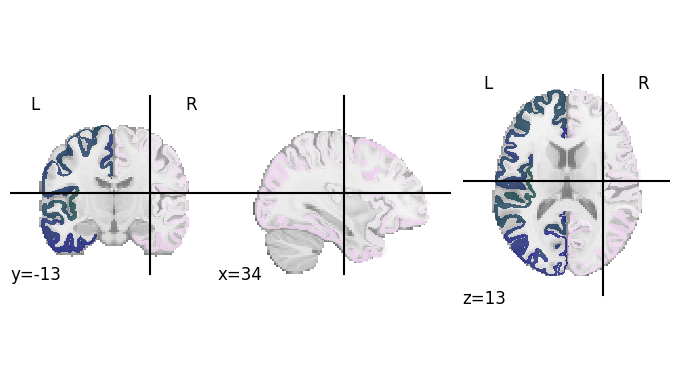

In [64]:
# Purpose: Display the DKT parcellation as a visual template sanity check.
plotting.plot_roi("/workspace/nbenlamr/spatial_template/parcellation_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz")

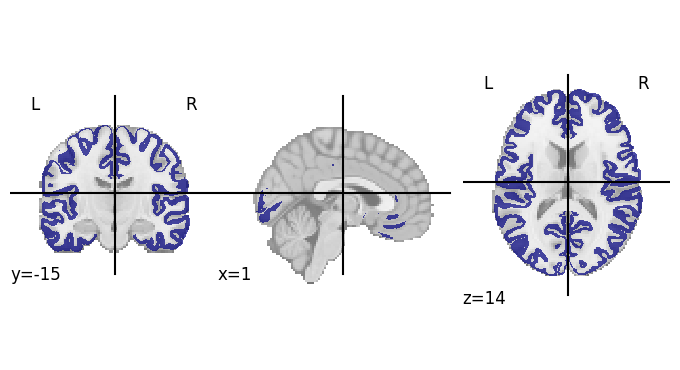

In [65]:
# Purpose: Display the cortical mask as a visual template sanity check.
plotting.plot_roi("/workspace/nbenlamr/spatial_template/mask_DKT_in_MNI_cortex_62_1mm_vlatest.nii.gz")

In [66]:
# Purpose: Check that mask and parcellation images share the same spatial geometry.
#Sanity check 1: SPATIAL ALIGNMENT
#Check that mask and parcellation files are aligned --> you usually perform this check using fsleyes 

In [67]:
# Purpose: Extract atlas labels and confirm compatibility with the cortical DKT parcellation.
#Sanity check 2: 
#Check that parcellation CORTICAL file matches the DKT cortical atlas used in Brainstorm to extract source time series

atlas = nib.load(parcellation_file).get_fdata()
atlas_labels = np.unique(atlas[atlas > 0]).astype(int)  # (62,)
print("Atlas labels (>0):", atlas_labels)
print("Number of labels:", len(atlas_labels))

Atlas labels (>0): [1002 1003 1005 1006 1007 1008 1009 1010 1011 1012 1013 1014 1015 1016
 1017 1018 1019 1020 1021 1022 1023 1024 1025 1026 1027 1028 1029 1030
 1031 1034 1035 2002 2003 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023 2024 2025 2026 2027
 2028 2029 2030 2031 2034 2035]
Number of labels: 62


In [68]:
# Purpose: Declare the Brainstorm DKT label order used by the source-space time series.
brainstorm_label_codes = np.array([
    1002, 2002,  # caudalanteriorcingulate L, R
    1003, 2003,  # caudalmiddlefrontal L, R
    1005, 2005,  # cuneus L, R
    1006, 2006,  # entorhinal L, R
    1007, 2007,  # fusiform L, R
    1008, 2008,  # inferiorparietal L, R
    1009, 2009,  # inferiortemporal L, R
    1035, 2035,  # insula L, R
    1010, 2010,  # isthmuscingulate L, R
    1011, 2011,  # lateraloccipital L, R
    1012, 2012,  # lateralorbitofrontal L, R
    1013, 2013,  # lingual L, R
    1014, 2014,  # medialorbitofrontal L, R
    1015, 2015,  # middletemporal L, R
    1017, 2017,  # paracentral L, R
    1016, 2016,  # parahippocampal L, R
    1018, 2018,  # parsopercularis L, R
    1019, 2019,  # parsorbitalis L, R
    1020, 2020,  # parstriangularis L, R
    1021, 2021,  # pericalcarine L, R
    1022, 2022,  # postcentral L, R
    1023, 2023,  # posteriorcingulate L, R
    1024, 2024,  # precentral L, R
    1025, 2025,  # precuneus L, R
    1026, 2026,  # rostralanteriorcingulate L, R
    1027, 2027,  # rostralmiddlefrontal L,
    1028, 2028,  # superiorfrontal L, R
    1029, 2029,  # superiorparietal L, R
    1030, 2030,  # superiortemporal L, R
    1031, 2031,  # supramarginal L, R
    1034, 2034,  # transverse-temporal L, R
    
], dtype=int)

In [69]:
# Purpose: Verify that Brainstorm and NIfTI atlas label sets are identical.
assert set(brainstorm_label_codes) == set(atlas_labels)

In [70]:
# Purpose: Derive the parcel permutation that aligns Brainstorm spectra with atlas order.
#Sanity check 3: PARCEL ORDERING ALIGNMENT
#Ensure the order of parcels in the parcellation file matches the order of parcels in the Brainstorm label file - done by setting a permutation, later applied for psd, coh, power calculations
#perm maps Brainstorm index → atlas index

perm = np.array([np.where(atlas_labels == code)[0][0]
                 for code in brainstorm_label_codes])
# perm[i] = index in atlas_labels corresponding to Brainstorm parcel i

In [71]:
# Purpose: Display the parcel permutation for manual inspection.
print(perm)

[ 0 31  1 32  2 33  3 34  4 35  5 36  6 37 30 61  7 38  8 39  9 40 10 41
 11 42 12 43 14 45 13 44 15 46 16 47 17 48 18 49 19 50 20 51 21 52 22 53
 23 54 24 55 25 56 26 57 27 58 28 59 29 60]


In [72]:
# Purpose: Reorder parcel-resolved subject spectra into the DKT atlas-label order.
# Put parcel-resolved dynamic spectra into atlas-label order for every group.
# perm gives the atlas position of each Brainstorm parcel, so its inverse is required for indexing.
brainstorm_to_atlas = np.argsort(perm)
assert np.array_equal(brainstorm_label_codes[brainstorm_to_atlas], atlas_labels)

for group_name in group_order:
    res = group_results[group_name]
    res["subject_dynamic_psd_atlas"] = (
        res["subject_dynamic_psd"][:, :, brainstorm_to_atlas, :]
    )

print("Atlas-ordered dynamic PSD shape:",
      group_results[group_order[0]]["subject_dynamic_psd_atlas"].shape)

Atlas-ordered dynamic PSD shape: (16, 8, 62, 160)


- Compute **power** for each parcel

Parcel index: 0
Atlas label: 1002


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.19it/s]


([<Figure size 426.667x480 with 5 Axes>],
 [[<Axes3D: >, <Axes3D: >, <Axes3D: >, <Axes3D: >, <Axes: >]])

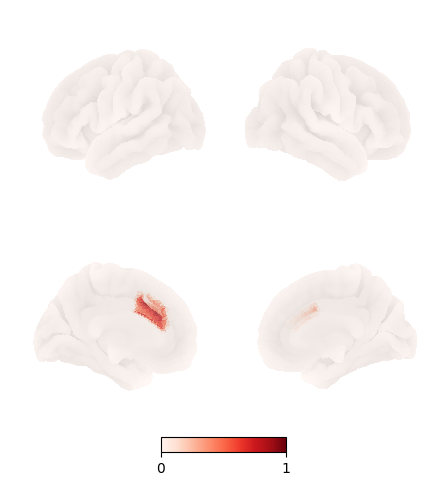

In [73]:
# Purpose: Perform an optional single-parcel power-integration sanity check.
#Sanity check: Test on a single parcel using power (optional)
parcel_index = 0

print("Parcel index:", parcel_index)
print("Atlas label:", int(atlas_labels[parcel_index]))

n_parcels = len(atlas_labels)

test_map = np.zeros(n_parcels)
test_map[parcel_index] = 1.0

power.save(
    test_map[np.newaxis, :],   # <-- no perm here
    mask_file=mask_file,
    parcellation_file=parcellation_file,
    plot_kwargs={
        "cmap": "Reds",
        "bg_on_data": True,
        "darkness": 0.5,
        "views": ["lateral", "medial"],
    },
)

In [74]:
# Purpose: Integrate atlas-ordered subject PSDs into spatial broadband and band-power maps.
# Integrate atlas-ordered parcel power for broadband and canonical bands.
# Dedicated masks avoid conflicts with masks used by preceding spectral plots.
def integrate_spatial_power(subject_psd_atlas, frequency_range):
    low, high = frequency_range
    mask = (f >= low) & (f <= high)
    if mask.sum() < 2:
        raise ValueError(
            f"Frequency range {low:g}-{high:g} Hz contains fewer than two bins."
        )
    return np.trapz(
        subject_psd_atlas[..., mask],
        x=f[mask],
        axis=-1,
    )  # (subjects, states, atlas parcels)

healthy_name = next(g for g in group_order if "health" in g.lower())
stroke_name = next(g for g in group_order if "stroke" in g.lower())

# Broadband maps retained for the downstream RSN analysis.
spatial_power = {}
for group_name in group_order:
    subject_maps = integrate_spatial_power(
        group_results[group_name]["subject_dynamic_psd_atlas"],
        power_frequency_range,
    )
    spatial_power[group_name] = {
        "subject_maps": subject_maps,
        "mean": subject_maps.mean(axis=0),
        "sd": subject_maps.std(axis=0, ddof=1),
    }

stroke_minus_healthy = (
    spatial_power[stroke_name]["mean"]
    - spatial_power[healthy_name]["mean"]
)

# Frequency-band maps.
spatial_band_power = {}
spatial_band_contrast = {}
for band_name, band_range in frequency_bands.items():
    spatial_band_power[band_name] = {}

    for group_name in group_order:
        subject_maps = integrate_spatial_power(
            group_results[group_name]["subject_dynamic_psd_atlas"],
            band_range,
        )
        spatial_band_power[band_name][group_name] = {
            "subject_maps": subject_maps,
            "mean": subject_maps.mean(axis=0),
            "sd": subject_maps.std(axis=0, ddof=1),
        }

    spatial_band_contrast[band_name] = (
        spatial_band_power[band_name][stroke_name]["mean"]
        - spatial_band_power[band_name][healthy_name]["mean"]
    )

print("Broadband range:", power_frequency_range)
print("Frequency bands:", frequency_bands)

Broadband range: (0.0, 79.5)
Frequency bands: {'Delta': (1.0, 4.0), 'Theta': (4.0, 8.0), 'Alpha': (8.0, 13.0), 'Beta': (13.0, 30.0)}


In [75]:
# Purpose: Validate map dimensions and perform parcel-wise healthy-versus-stroke inference.
# Sanity checks and parcel-wise spatial inference.
expected_shape = (n_states, len(atlas_labels))


def center_subject_maps(subject_maps):
    subject_maps = np.asarray(subject_maps)
    return subject_maps - subject_maps.mean(axis=-1, keepdims=True)


def infer_spatial_map_set(subject_maps_by_group, analysis_name):
    t_values = np.zeros(expected_shape)
    p_values = np.ones(expected_shape)
    q_values = np.ones(expected_shape)
    effect_sizes = np.zeros(expected_shape)
    centered_contrast = np.zeros(expected_shape)
    rows = []

    healthy_maps = center_subject_maps(subject_maps_by_group["healthy"])
    stroke_maps = center_subject_maps(subject_maps_by_group["stroke"])

    for state in range(n_states):
        t_state, p_state, g_state = welch_feature_test(
            healthy_maps[:, state, :], stroke_maps[:, state, :]
        )
        q_state = fdr_bh(p_state)
        contrast_state = (
            stroke_maps[:, state, :].mean(axis=0)
            - healthy_maps[:, state, :].mean(axis=0)
        )
        t_values[state] = t_state
        p_values[state] = p_state
        q_values[state] = q_state
        effect_sizes[state] = g_state
        centered_contrast[state] = contrast_state

        for parcel_index, atlas_label in enumerate(atlas_labels):
            rows.append({
                "analysis": analysis_name,
                "state": state + 1,
                "atlas_label": int(atlas_label),
                "stroke_minus_healthy": contrast_state[parcel_index],
                "welch_t": t_state[parcel_index],
                "hedges_g": g_state[parcel_index],
                "p_value": p_state[parcel_index],
                "q_fdr_within_state_map": q_state[parcel_index],
                "significant_q05": q_state[parcel_index] < STAT_ALPHA,
            })

    return {
        "t": t_values,
        "p": p_values,
        "q_fdr": q_values,
        "hedges_g": effect_sizes,
        "centered_contrast": centered_contrast,
        "table_rows": rows,
    }

for group_name in group_order:
    maps = spatial_power[group_name]["mean"]
    assert maps.shape == expected_shape
    assert np.isfinite(maps).all()

spatial_inference = {
    "Broadband": infer_spatial_map_set(
        {
            group_name: spatial_power[group_name]["subject_maps"]
            for group_name in group_order
        },
        "Broadband",
    )
}

for band_name in frequency_bands:
    for group_name in group_order:
        maps = spatial_band_power[band_name][group_name]["mean"]
        assert maps.shape == expected_shape
        assert np.isfinite(maps).all()

    spatial_inference[band_name] = infer_spatial_map_set(
        {
            group_name: spatial_band_power[band_name][group_name]["subject_maps"]
            for group_name in group_order
        },
        band_name,
    )

spatial_inference_df = pd.DataFrame([
    row
    for result in spatial_inference.values()
    for row in result["table_rows"]
])
display(
    spatial_inference_df.groupby(["analysis", "state"])[
        "significant_q05"
    ].sum().rename("n_significant_parcels").reset_index()
)
spatial_inference_df.to_csv(
    ROOT / "spatial_power_parcel_inference.csv", index=False
)

,analysis,state,n_significant_parcels
0,Alpha,1,0
1,Alpha,2,0
2,Alpha,3,1
3,Alpha,4,1
4,Alpha,5,0
5,Alpha,6,0
6,Alpha,7,1
7,Alpha,8,0
8,Beta,1,0
9,Beta,2,1


In [76]:
# Purpose: Display state maps and thresholded group contrasts with rigorous colour scales.
# Display spatial organization and statistically thresholded group contrasts.
# Red/blue in group maps means above/below that state's parcel mean.
def center_across_parcels(maps):
    maps = np.asarray(maps)
    return maps - maps.mean(axis=-1, keepdims=True)


def power_plot_kwargs(scale):
    return {
        "cmap": "RdBu_r", "bg_on_data": True,
        "darkness": 1, "alpha": 1,
        "vmin": -scale, "vmax": scale,
        "symmetric_cbar": True,
        "cbar_tick_format": "%.1e",
        "views": ["lateral", "medial"],
    }


def show_single_power_map(values, scale):
    figures, _ = power.save(
        values[np.newaxis, :],
        mask_file=mask_file,
        parcellation_file=parcellation_file,
        subtract_mean=False,
        plot_kwargs=power_plot_kwargs(scale),
    )
    for figure in figures:
        # Nilearn uses a compact colour-bar axis; provide enough room for
        # signed scientific-notation tick labels without overlap.
        figure.set_size_inches(12, 4, forward=True)
        for axis in figure.axes:
            axis.tick_params(axis="both", labelsize=7, pad=2)
    plt.show()


def display_power_map_set(group_maps, contrast, label, inference):
    centered_groups = {
        group_name: center_across_parcels(group_maps[group_name])
        for group_name in group_order
    }
    centered_contrast = center_across_parcels(contrast)

    for state in range(n_states):
        group_scale = np.nanmax(np.abs(np.concatenate([
            centered_groups[group_name][state]
            for group_name in group_order
        ])))
        contrast_scale = np.nanmax(np.abs(centered_contrast[state]))

        if not np.isfinite(group_scale) or group_scale == 0:
            print(f"Skipping {label}, State {state + 1}: invalid group scale.")
            continue

        print(f"{label}, State {state + 1}: descriptive group maps")
        for group_name in group_order:
            print(
                f"  {group_name}; shared group scale "
                f"[{ -group_scale:.3e}, 0, {group_scale:.3e}]"
            )
            show_single_power_map(centered_groups[group_name][state], group_scale)

        if np.isfinite(contrast_scale) and contrast_scale > 0:
            print(
                f"  Full descriptive contrast: {stroke_name} minus {healthy_name}; "
                f"scale [{-contrast_scale:.3e}, 0, {contrast_scale:.3e}]"
            )
            show_single_power_map(centered_contrast[state], contrast_scale)

        significant = inference["q_fdr"][state] < STAT_ALPHA
        n_significant = int(significant.sum())
        print(
            f"  Parcel-wise Welch tests: {n_significant}/{len(atlas_labels)} "
            "parcels survive within-map FDR q<0.05"
        )
        if n_significant:
            significant_contrast = np.where(
                significant, centered_contrast[state], 0.0
            )
            significant_scale = np.nanmax(np.abs(significant_contrast))
            print("  FDR-significant contrast only")
            show_single_power_map(significant_contrast, significant_scale)



,band,n_significant_parcels
0,Alpha,1
1,Beta,15
2,Delta,0
3,Theta,1


Static absolute power: Delta (1-4 Hz)
  healthy; shared group scale [-2.966e-02, 0, 2.966e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


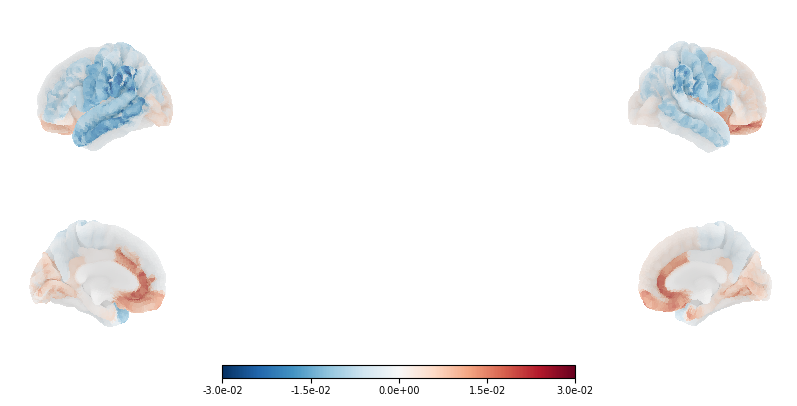

  stroke; shared group scale [-2.966e-02, 0, 2.966e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]


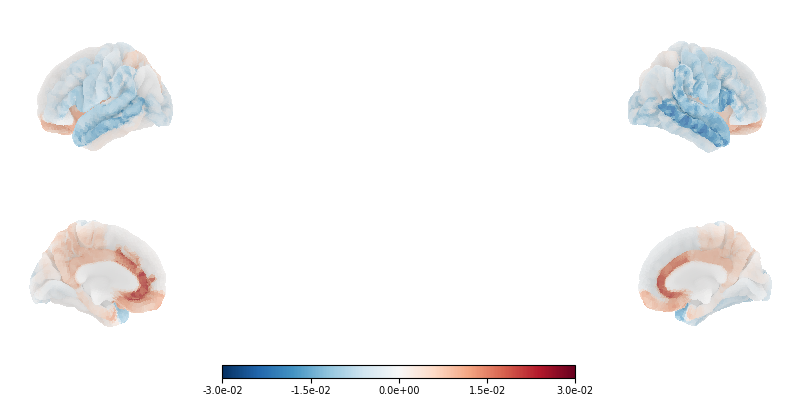

  Full contrast: stroke minus healthy; scale [-2.072e-02, 0, 2.072e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]


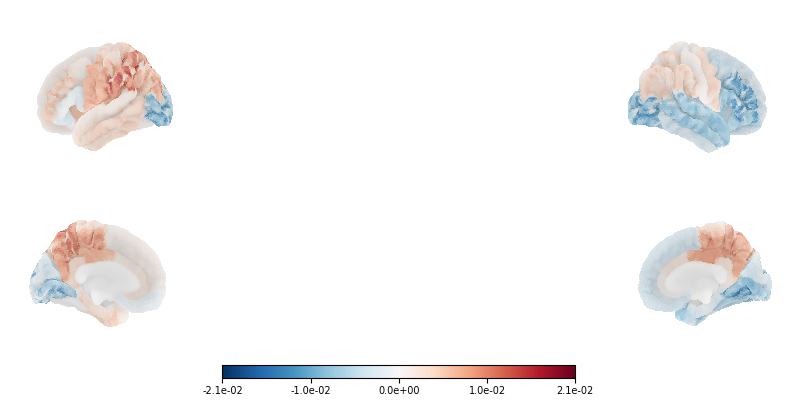

  0/62 parcels survive FDR q<0.05 across all parcel-by-band tests
Static absolute power: Theta (4-8 Hz)
  healthy; shared group scale [-3.861e-02, 0, 3.861e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


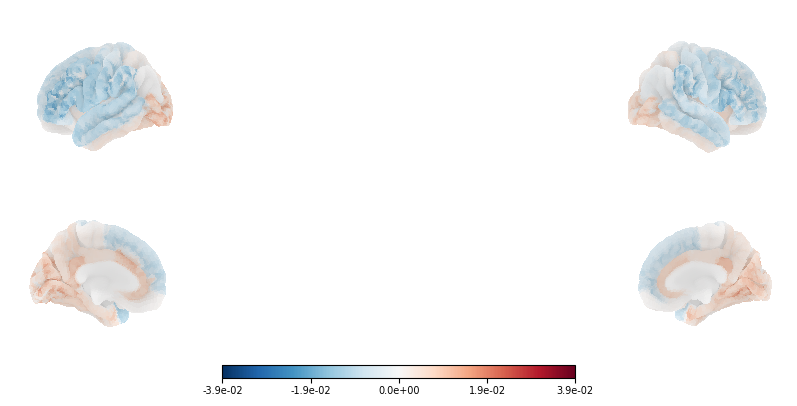

  stroke; shared group scale [-3.861e-02, 0, 3.861e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


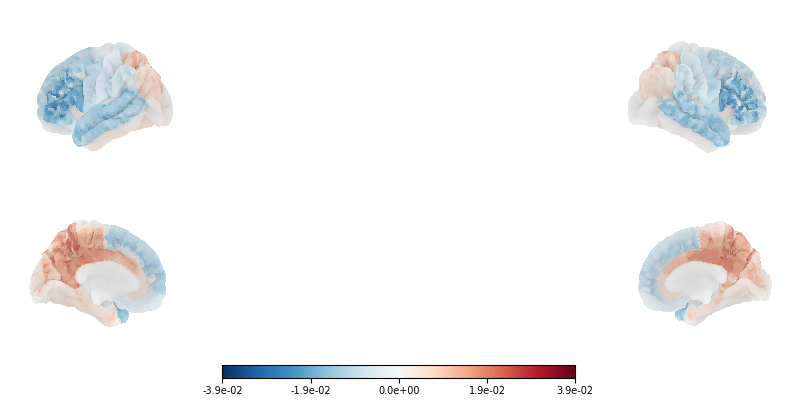

  Full contrast: stroke minus healthy; scale [-2.245e-02, 0, 2.245e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


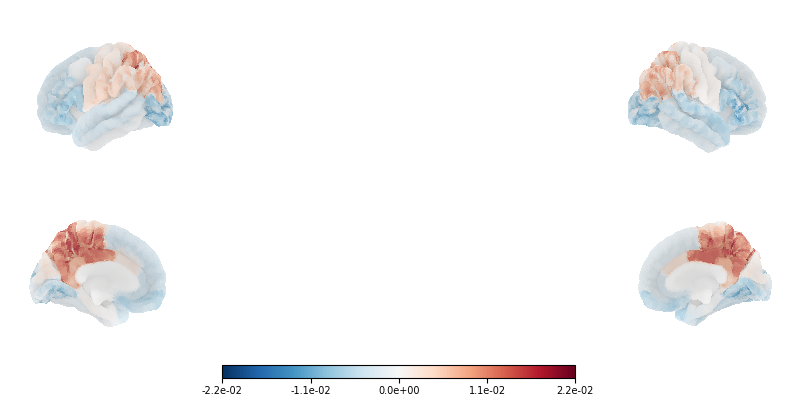

  1/62 parcels survive FDR q<0.05 across all parcel-by-band tests
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


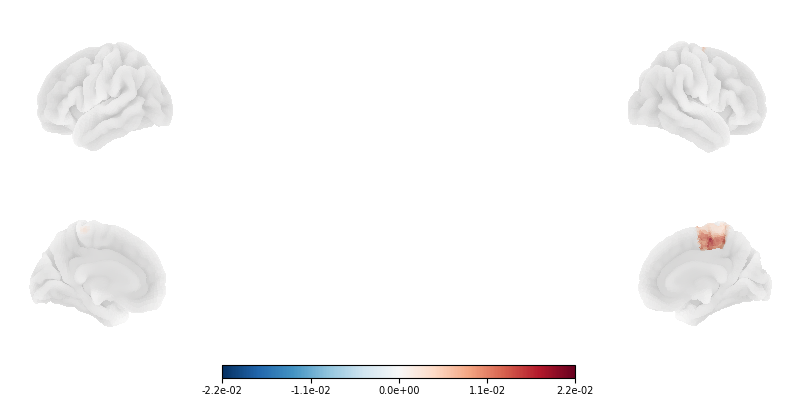

Static absolute power: Alpha (8-13 Hz)
  healthy; shared group scale [-5.768e-02, 0, 5.768e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


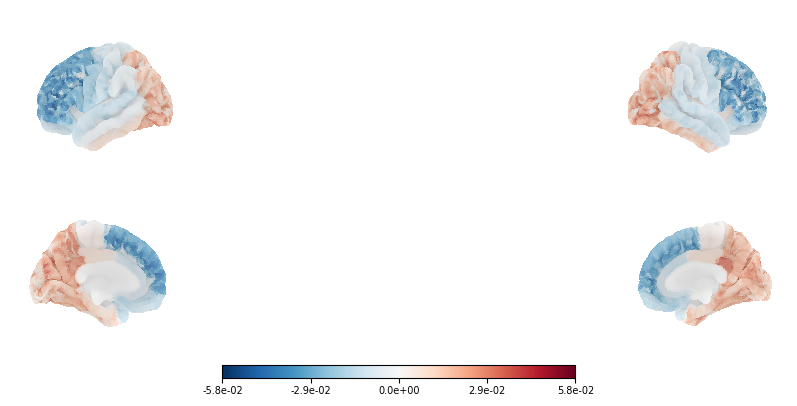

  stroke; shared group scale [-5.768e-02, 0, 5.768e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]


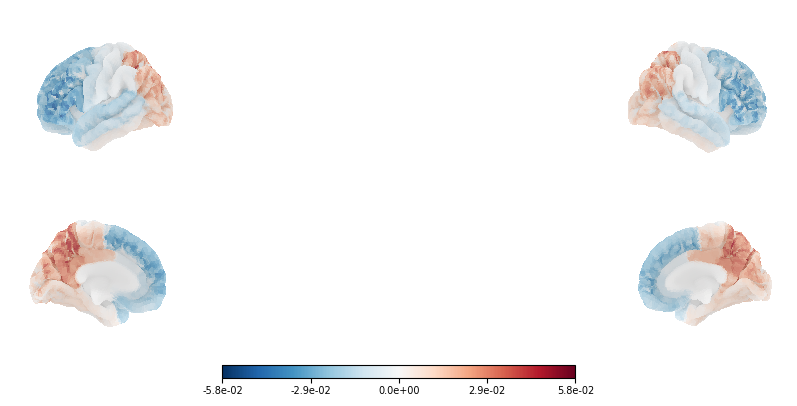

  Full contrast: stroke minus healthy; scale [-2.108e-02, 0, 2.108e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.19it/s]


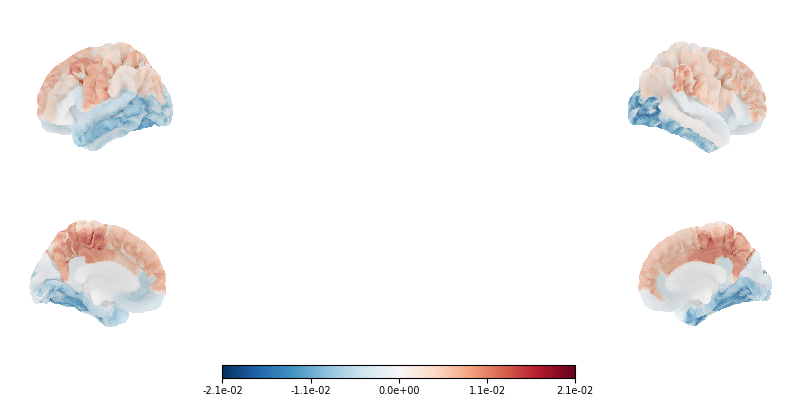

  1/62 parcels survive FDR q<0.05 across all parcel-by-band tests
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


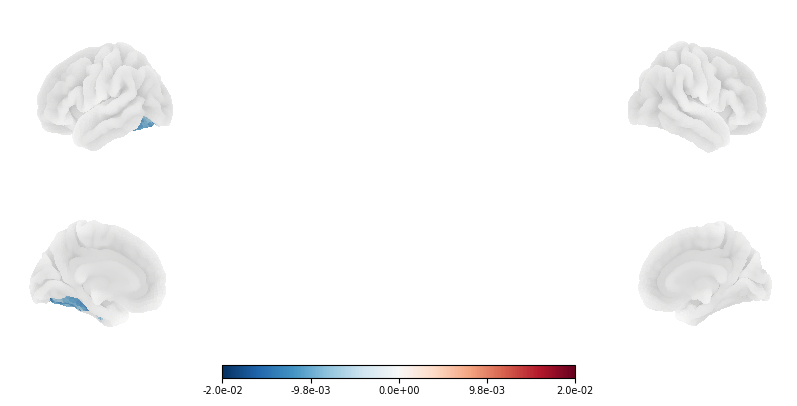

Static absolute power: Beta (13-30 Hz)
  healthy; shared group scale [-5.628e-02, 0, 5.628e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]


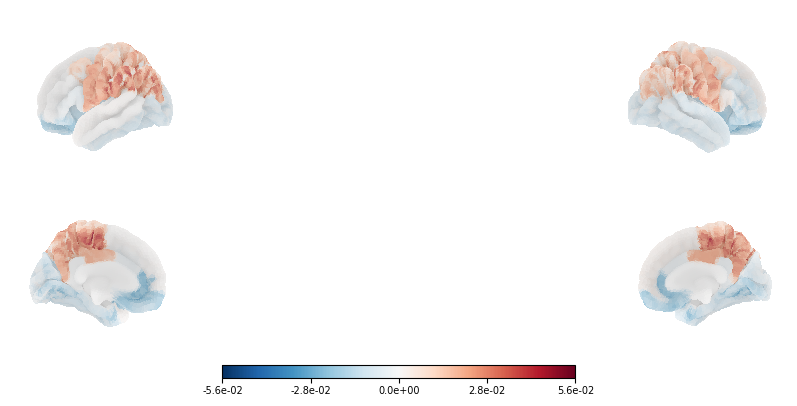

  stroke; shared group scale [-5.628e-02, 0, 5.628e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]


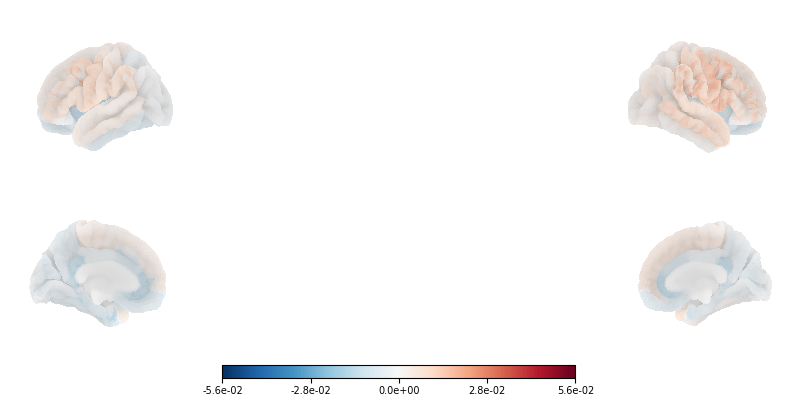

  Full contrast: stroke minus healthy; scale [-4.778e-02, 0, 4.778e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.09s/it]


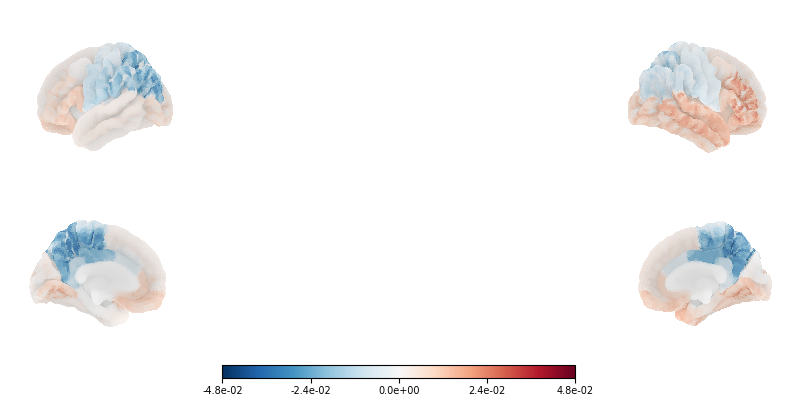

  15/62 parcels survive FDR q<0.05 across all parcel-by-band tests
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


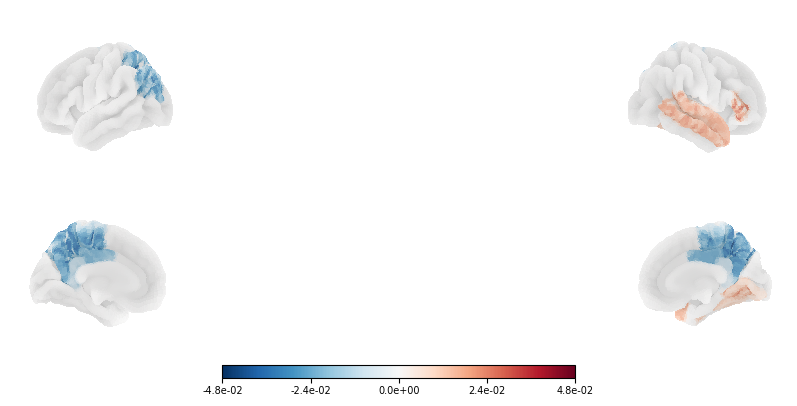

In [78]:
# Purpose: Compute static band maps and FDR across parcels and bands, with no state dimension.
# Static absolute-power spatial maps by canonical frequency band (no HMM states).
# Each subject's static PSD is the fractional-occupancy-weighted average of
# their state PSDs. FDR is controlled jointly across parcels x frequency bands.
positive_floor = np.finfo(float).tiny
subject_static_psd_atlas = {}

for group_name in group_order:
    res = group_results[group_name]
    subject_fo = np.stack([
        fo_subject_df.loc[
            (fo_subject_df["subject_id"] == subject_id)
            & (fo_subject_df["group"] == group_name)
        ].sort_values("state")["fractional_occupancy"].to_numpy()
        for subject_id in res["subject_ids"]
    ])
    if subject_fo.shape != (res["n_subjects"], n_states):
        raise ValueError(
            f"Unexpected fractional-occupancy shape for {group_name}: "
            f"{subject_fo.shape}"
        )
    # Sum over HMM states: (subjects, states, parcels, frequencies)
    # -> (subjects, parcels, frequencies), then reorder parcels to atlas order.
    subject_static_psd = np.sum(
        res["subject_psd"] * subject_fo[:, :, np.newaxis, np.newaxis],
        axis=1,
    )
    subject_static_psd_atlas[group_name] = (
        subject_static_psd[:, brainstorm_to_atlas, :]
    )

static_spatial_band_power = {band_name: {} for band_name in frequency_bands}
static_spatial_tests = {}

for band_name, band_range in frequency_bands.items():
    subject_maps_by_group = {}
    for group_name in group_order:
        subject_maps = integrate_spatial_power(
            subject_static_psd_atlas[group_name], band_range
        )
        subject_maps_by_group[group_name] = subject_maps
        static_spatial_band_power[band_name][group_name] = {
            "subject_maps": subject_maps,
            "mean": subject_maps.mean(axis=0),
            "sd": subject_maps.std(axis=0, ddof=1),
        }

    # Log power reduces positive skew. Centering across parcels tests relative
    # spatial organization rather than a global whole-brain power shift.
    healthy_maps = center_subject_maps(np.log(np.clip(
        subject_maps_by_group[healthy_name], positive_floor, None
    )))
    stroke_maps = center_subject_maps(np.log(np.clip(
        subject_maps_by_group[stroke_name], positive_floor, None
    )))
    t_values, p_values, effect_sizes = welch_feature_test(
        healthy_maps, stroke_maps
    )
    static_spatial_tests[band_name] = {
        "t": t_values,
        "p": p_values,
        "hedges_g": effect_sizes,
        "log_centered_contrast": (
            stroke_maps.mean(axis=0) - healthy_maps.mean(axis=0)
        ),
    }

# One correction family: 62 atlas parcels x 4 canonical frequency bands.
all_static_p = np.concatenate([
    static_spatial_tests[band_name]["p"]
    for band_name in frequency_bands
])
all_static_q = fdr_bh(all_static_p)
start = 0
for band_name in frequency_bands:
    stop = start + len(atlas_labels)
    static_spatial_tests[band_name]["q_fdr"] = all_static_q[start:stop]
    start = stop

static_spatial_rows = []
for band_name in frequency_bands:
    result = static_spatial_tests[band_name]
    centered_healthy_linear = center_subject_maps(
        static_spatial_band_power[band_name][healthy_name]["subject_maps"]
    )
    centered_stroke_linear = center_subject_maps(
        static_spatial_band_power[band_name][stroke_name]["subject_maps"]
    )
    linear_contrast = (
        centered_stroke_linear.mean(axis=0)
        - centered_healthy_linear.mean(axis=0)
    )
    for parcel_index, atlas_label in enumerate(atlas_labels):
        static_spatial_rows.append({
            "band": band_name,
            "atlas_label": int(atlas_label),
            "stroke_minus_healthy_centered_absolute_power": (
                linear_contrast[parcel_index]
            ),
            "stroke_minus_healthy_centered_log_power": (
                result["log_centered_contrast"][parcel_index]
            ),
            "welch_t_log_power": result["t"][parcel_index],
            "hedges_g_log_power": result["hedges_g"][parcel_index],
            "p_value": result["p"][parcel_index],
            "q_fdr_across_parcels_and_bands": result["q_fdr"][parcel_index],
            "significant_q05": result["q_fdr"][parcel_index] < STAT_ALPHA,
        })

static_spatial_inference_df = pd.DataFrame(static_spatial_rows)
display(
    static_spatial_inference_df.groupby("band")["significant_q05"]
    .sum().rename("n_significant_parcels").reset_index()
)
static_spatial_inference_df.to_csv(
    ROOT / "static_absolute_spatial_power_inference.csv", index=False
)

# One set of static maps per frequency band: healthy, stroke, full contrast,
# and (when present) the FDR-significant contrast only.
for band_name, (low, high) in frequency_bands.items():
    centered_groups = {
        group_name: center_across_parcels(
            static_spatial_band_power[band_name][group_name]["mean"]
        )
        for group_name in group_order
    }
    centered_contrast = (
        centered_groups[stroke_name] - centered_groups[healthy_name]
    )
    group_scale = np.nanmax(np.abs(np.concatenate([
        centered_groups[group_name] for group_name in group_order
    ])))
    contrast_scale = np.nanmax(np.abs(centered_contrast))

    print(f"Static absolute power: {band_name} ({low:g}-{high:g} Hz)")
    for group_name in group_order:
        print(
            f"  {group_name}; shared group scale "
            f"[{-group_scale:.3e}, 0, {group_scale:.3e}]"
        )
        show_single_power_map(centered_groups[group_name], group_scale)

    if np.isfinite(contrast_scale) and contrast_scale > 0:
        print(
            f"  Full contrast: {stroke_name} minus {healthy_name}; "
            f"scale [{-contrast_scale:.3e}, 0, {contrast_scale:.3e}]"
        )
        show_single_power_map(centered_contrast, contrast_scale)

    significant = static_spatial_tests[band_name]["q_fdr"] < STAT_ALPHA
    n_significant = int(significant.sum())
    print(
        f"  {n_significant}/{len(atlas_labels)} parcels survive FDR q<0.05 "
        "across all parcel-by-band tests"
    )
    if n_significant:
        significant_contrast = np.where(
            significant, centered_contrast, 0.0
        )
        significant_scale = np.nanmax(np.abs(significant_contrast))
        print("  FDR-significant contrast only")
        show_single_power_map(significant_contrast, significant_scale)


,state,band,n_significant_parcels
0,1,Alpha,0
1,1,Beta,0
2,1,Delta,0
3,1,Theta,0
4,2,Alpha,0
5,2,Beta,1
6,2,Delta,0
7,2,Theta,0
8,3,Alpha,1
9,3,Beta,1


Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 1: descriptive group maps
  healthy; shared group scale [-2.671e-02, 0, 2.671e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


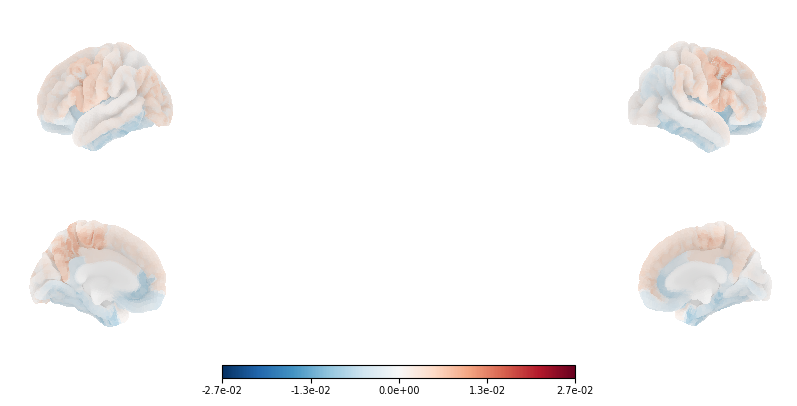

  stroke; shared group scale [-2.671e-02, 0, 2.671e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.10s/it]


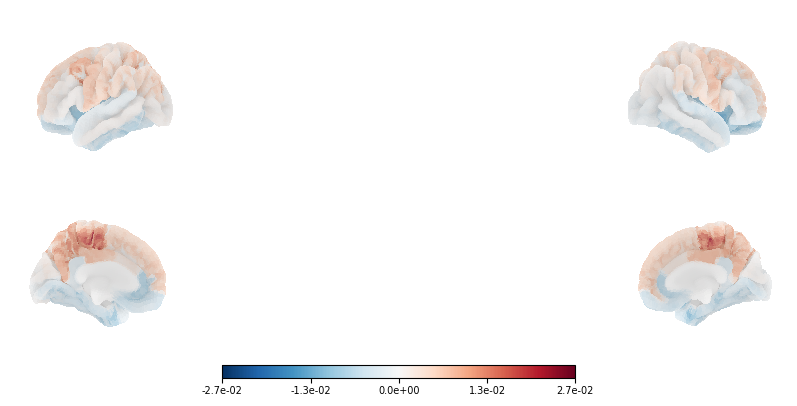

  Full descriptive contrast: stroke minus healthy; scale [-1.514e-02, 0, 1.514e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


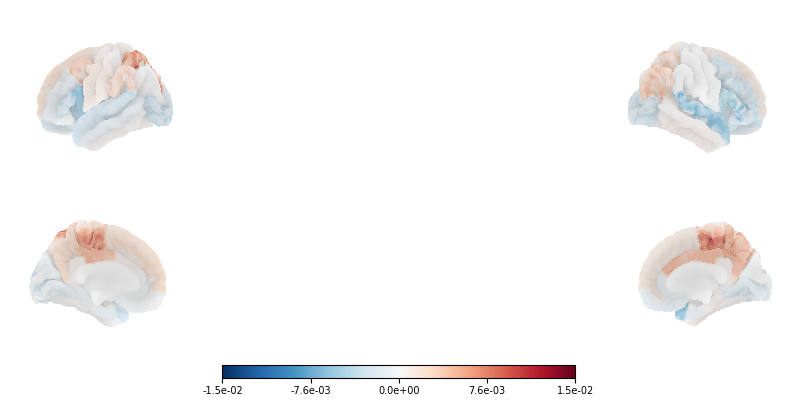

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 2: descriptive group maps
  healthy; shared group scale [-2.328e-02, 0, 2.328e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


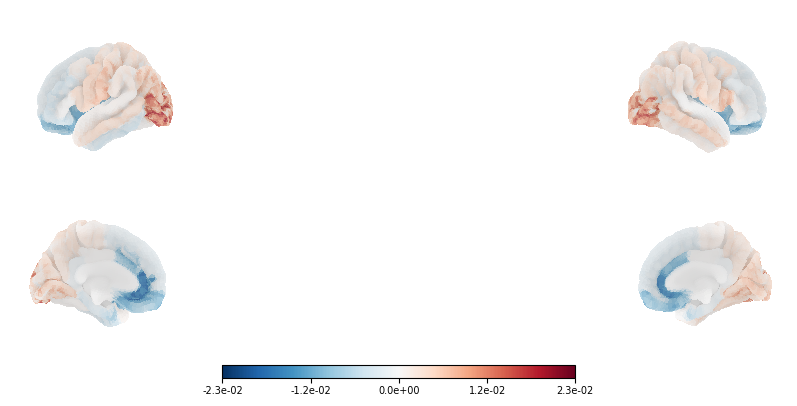

  stroke; shared group scale [-2.328e-02, 0, 2.328e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


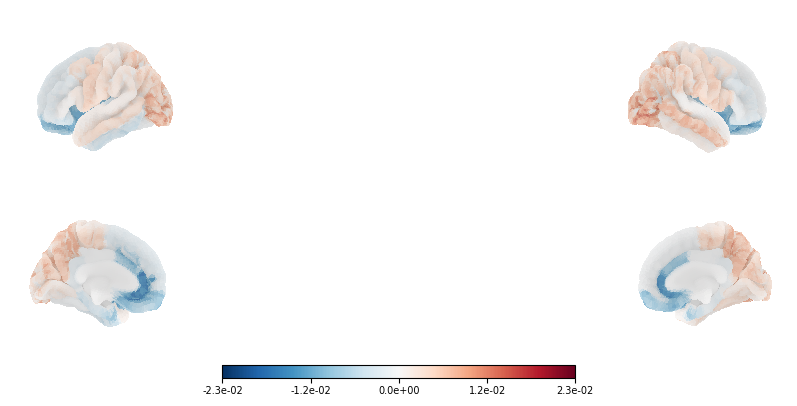

  Full descriptive contrast: stroke minus healthy; scale [-8.657e-03, 0, 8.657e-03]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


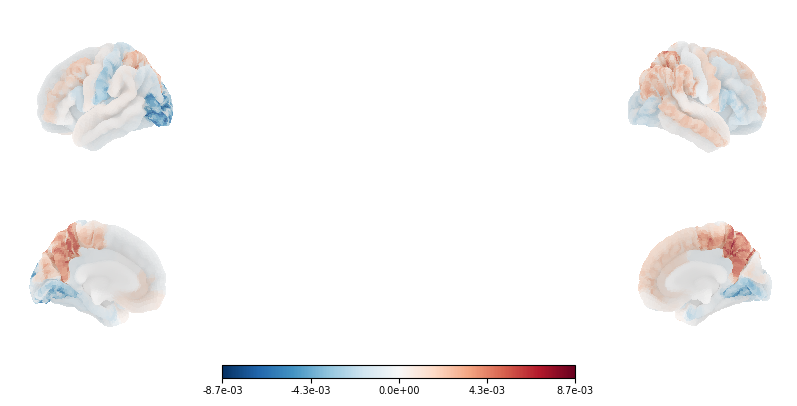

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 3: descriptive group maps
  healthy; shared group scale [-1.759e-02, 0, 1.759e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


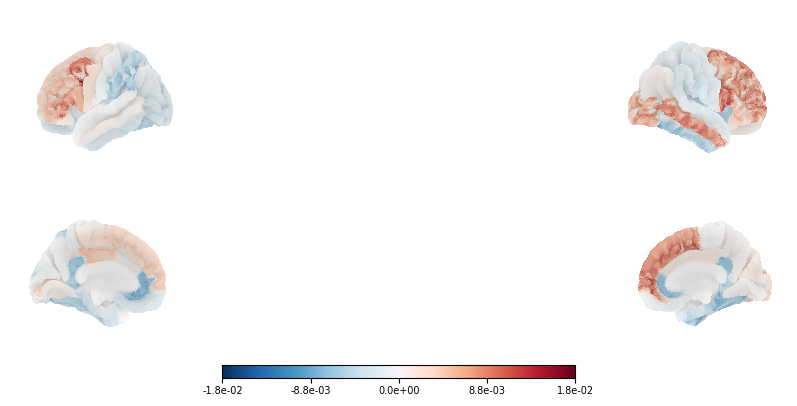

  stroke; shared group scale [-1.759e-02, 0, 1.759e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


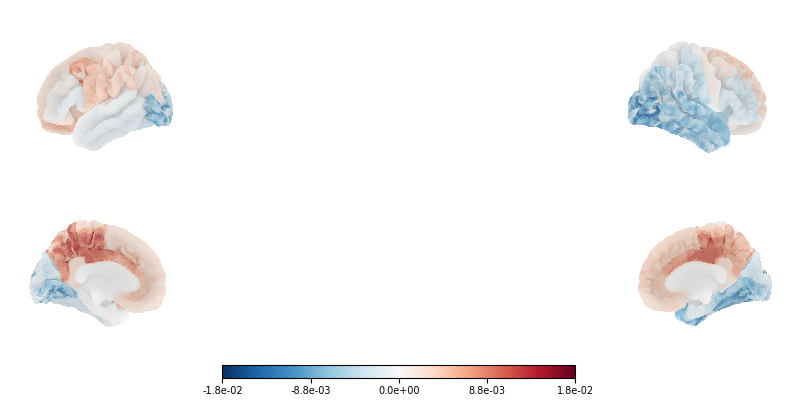

  Full descriptive contrast: stroke minus healthy; scale [-2.904e-02, 0, 2.904e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


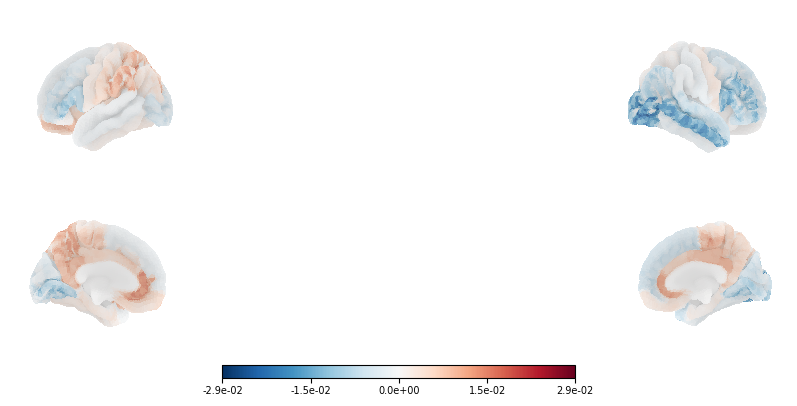

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 4: descriptive group maps
  healthy; shared group scale [-1.818e-02, 0, 1.818e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]


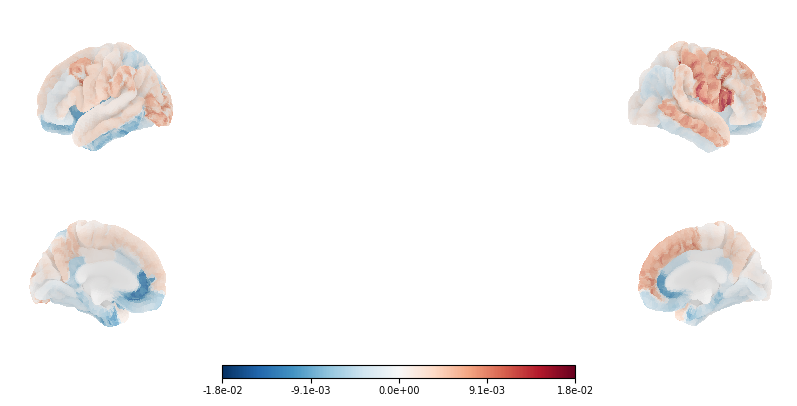

  stroke; shared group scale [-1.818e-02, 0, 1.818e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]


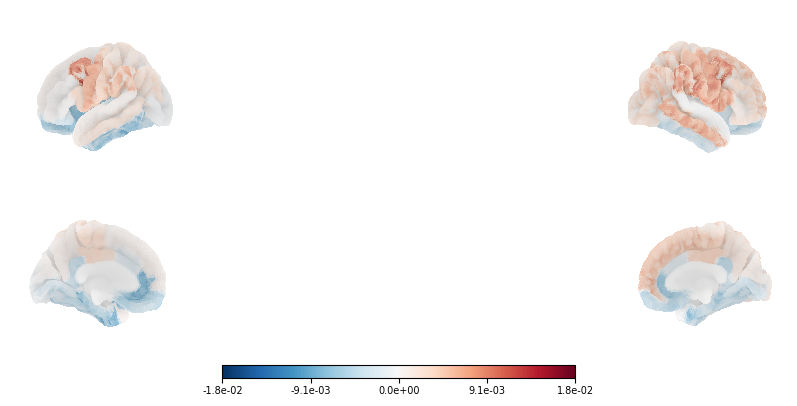

  Full descriptive contrast: stroke minus healthy; scale [-1.160e-02, 0, 1.160e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


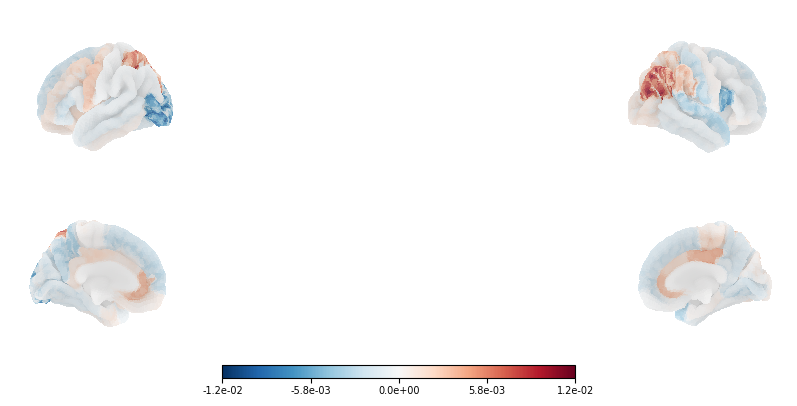

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 5: descriptive group maps
  healthy; shared group scale [-2.002e-02, 0, 2.002e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


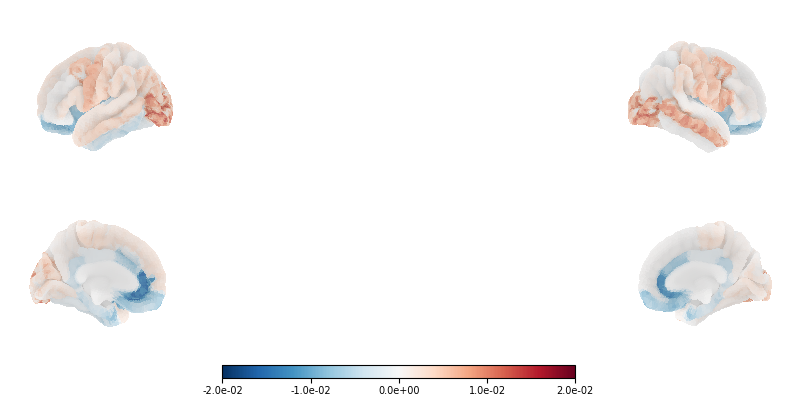

  stroke; shared group scale [-2.002e-02, 0, 2.002e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


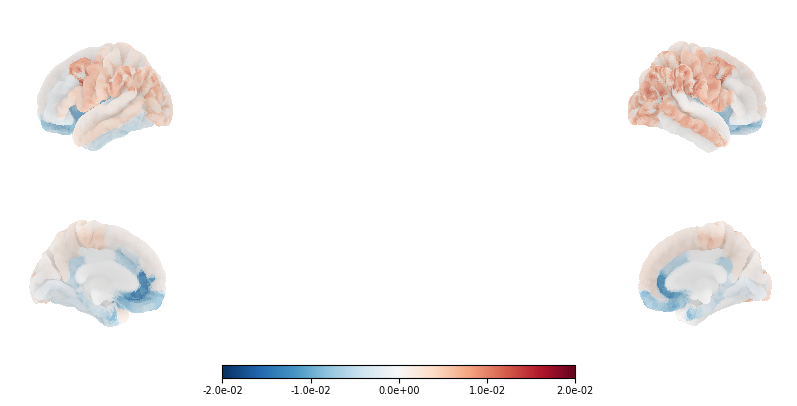

  Full descriptive contrast: stroke minus healthy; scale [-1.101e-02, 0, 1.101e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


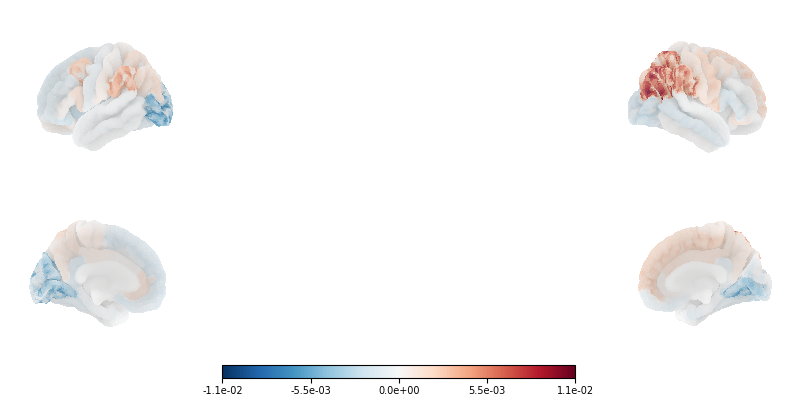

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 6: descriptive group maps
  healthy; shared group scale [-6.574e-02, 0, 6.574e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]


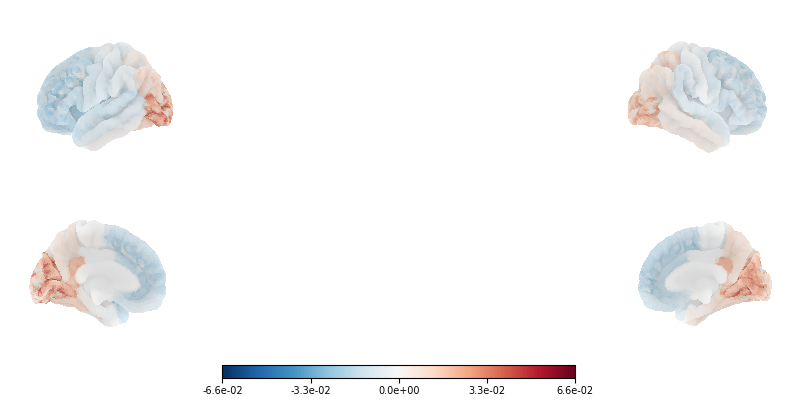

  stroke; shared group scale [-6.574e-02, 0, 6.574e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


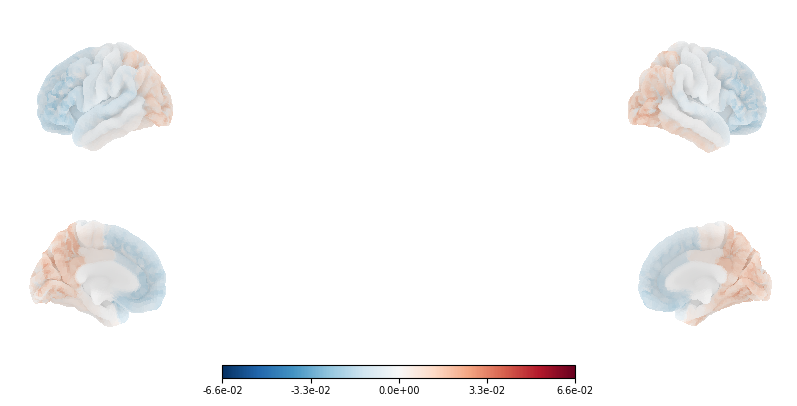

  Full descriptive contrast: stroke minus healthy; scale [-3.605e-02, 0, 3.605e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]


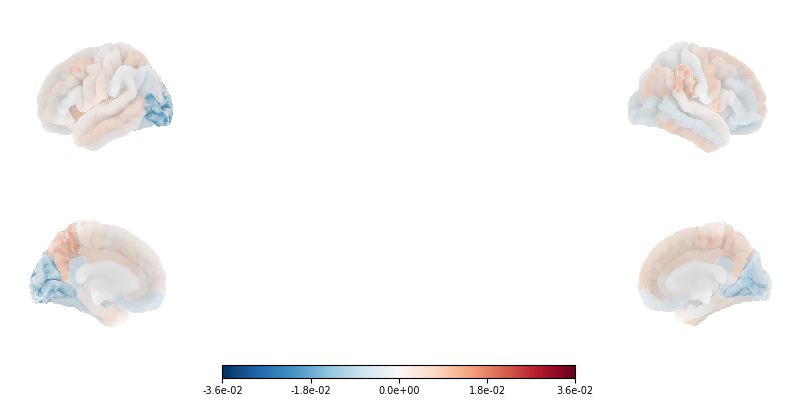

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 7: descriptive group maps
  healthy; shared group scale [-1.472e-01, 0, 1.472e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


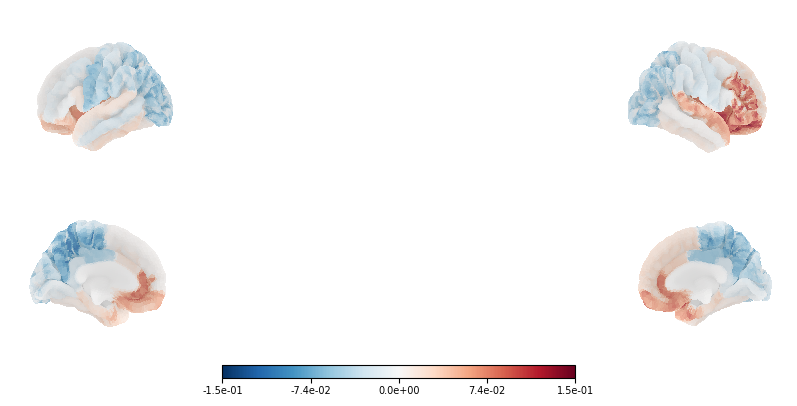

  stroke; shared group scale [-1.472e-01, 0, 1.472e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.10s/it]


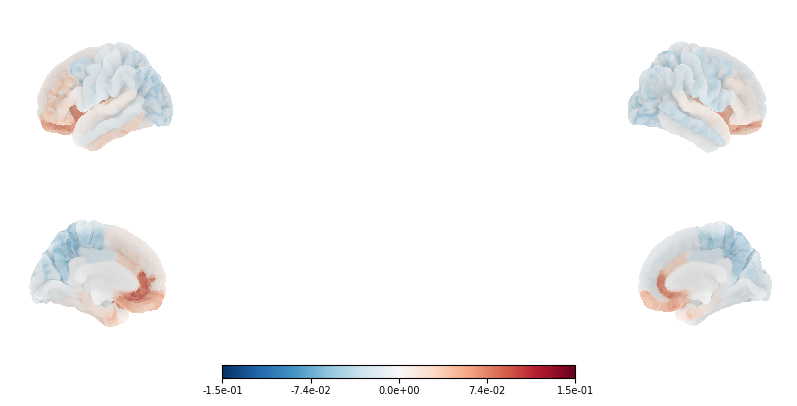

  Full descriptive contrast: stroke minus healthy; scale [-1.141e-01, 0, 1.141e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]


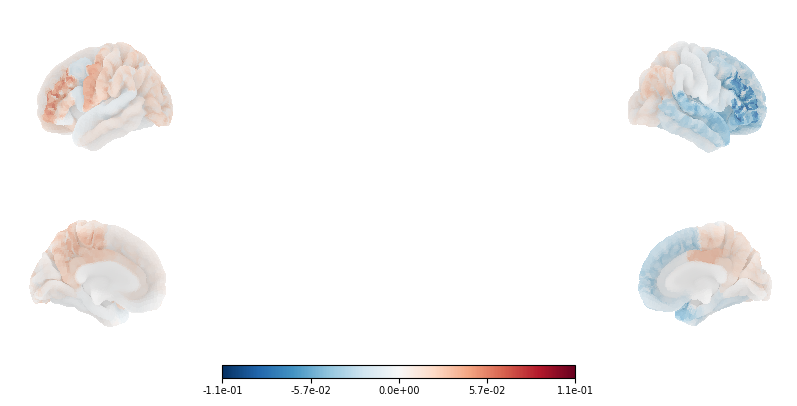

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Delta (1-4 Hz); FDR across parcels x bands within state, State 8: descriptive group maps
  healthy; shared group scale [-1.594e-02, 0, 1.594e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.15s/it]


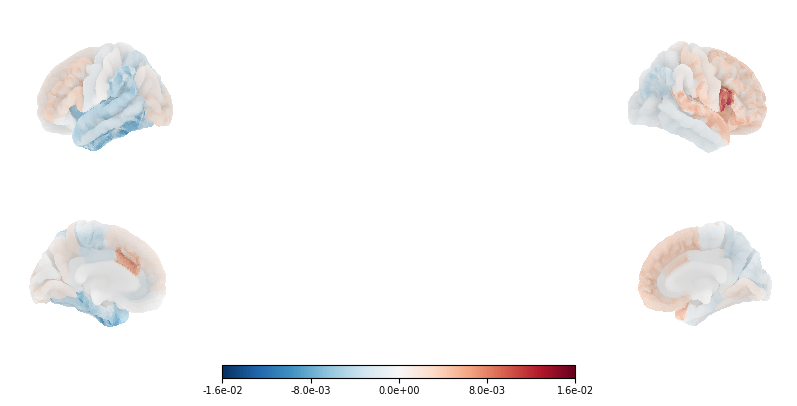

  stroke; shared group scale [-1.594e-02, 0, 1.594e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]


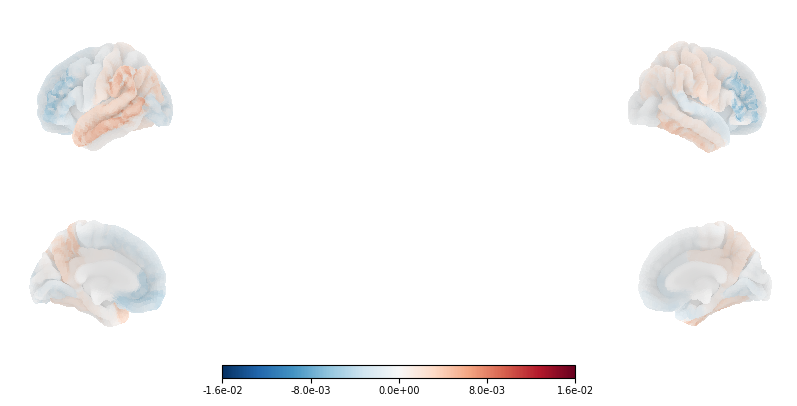

  Full descriptive contrast: stroke minus healthy; scale [-1.567e-02, 0, 1.567e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]


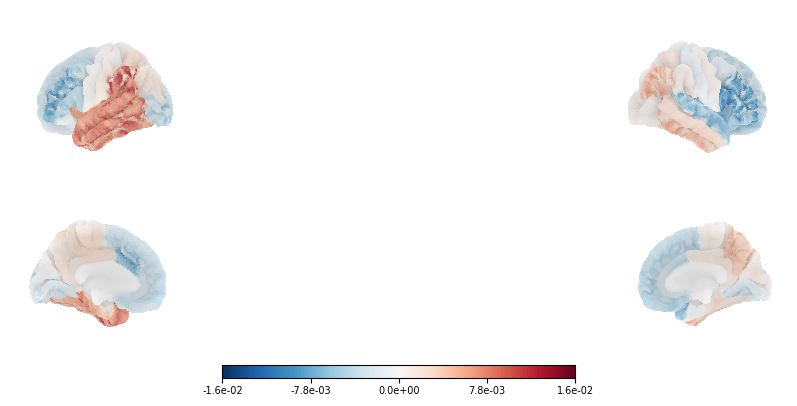

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 1: descriptive group maps
  healthy; shared group scale [-2.204e-02, 0, 2.204e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]


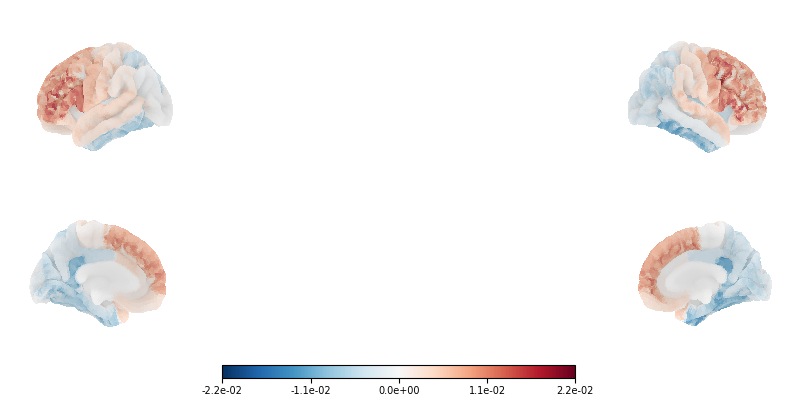

  stroke; shared group scale [-2.204e-02, 0, 2.204e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]


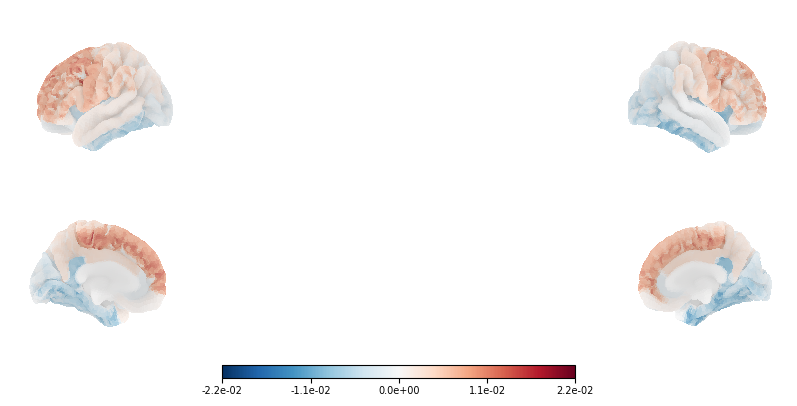

  Full descriptive contrast: stroke minus healthy; scale [-1.773e-02, 0, 1.773e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


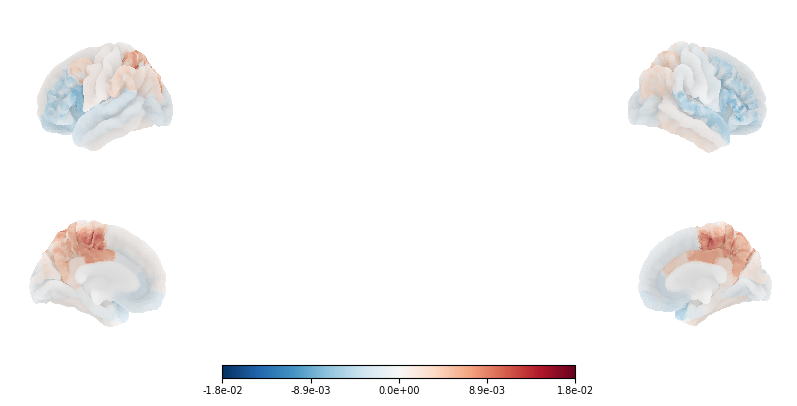

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 2: descriptive group maps
  healthy; shared group scale [-1.594e-02, 0, 1.594e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


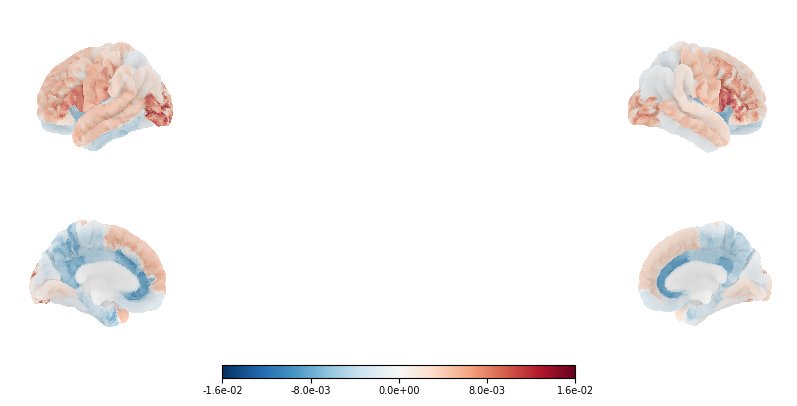

  stroke; shared group scale [-1.594e-02, 0, 1.594e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.09s/it]


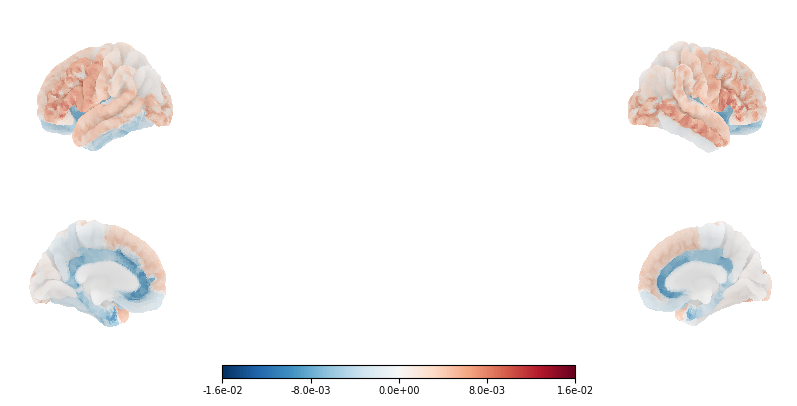

  Full descriptive contrast: stroke minus healthy; scale [-8.344e-03, 0, 8.344e-03]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]


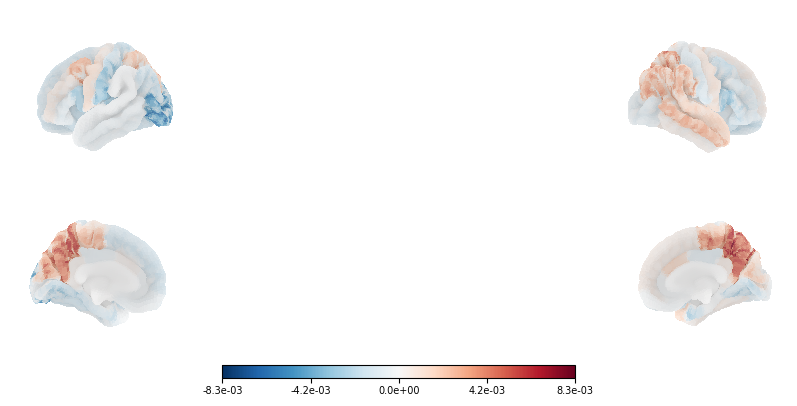

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 3: descriptive group maps
  healthy; shared group scale [-2.555e-02, 0, 2.555e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]


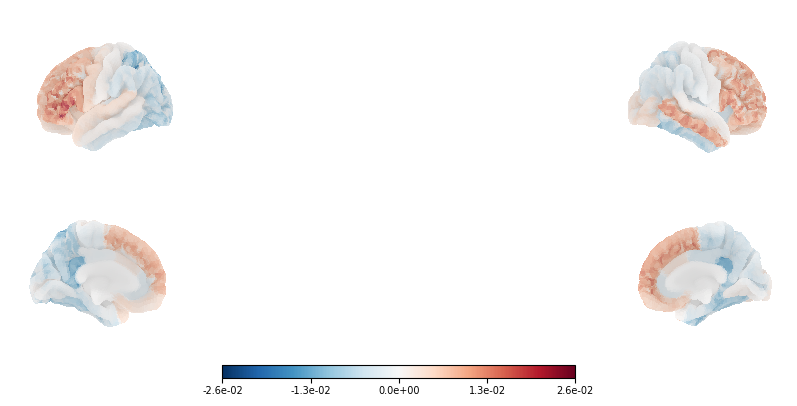

  stroke; shared group scale [-2.555e-02, 0, 2.555e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]


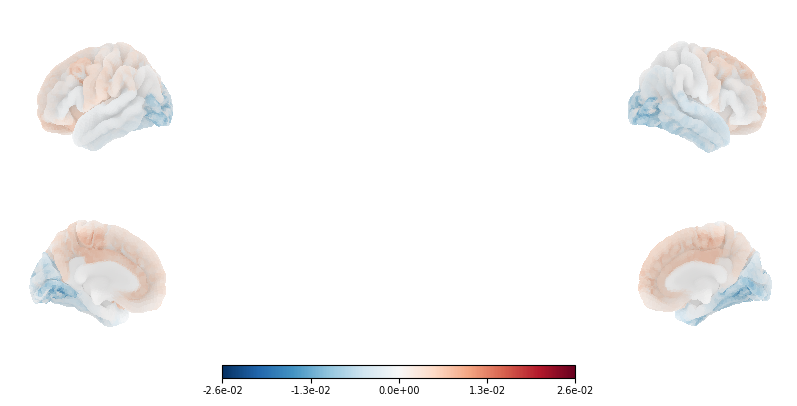

  Full descriptive contrast: stroke minus healthy; scale [-2.655e-02, 0, 2.655e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


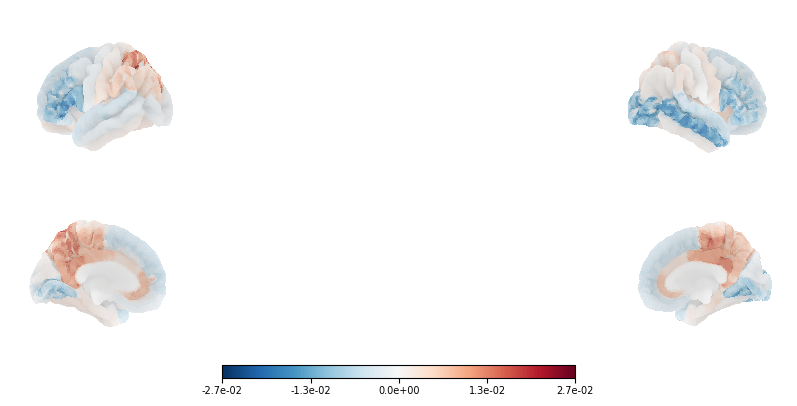

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.15s/it]


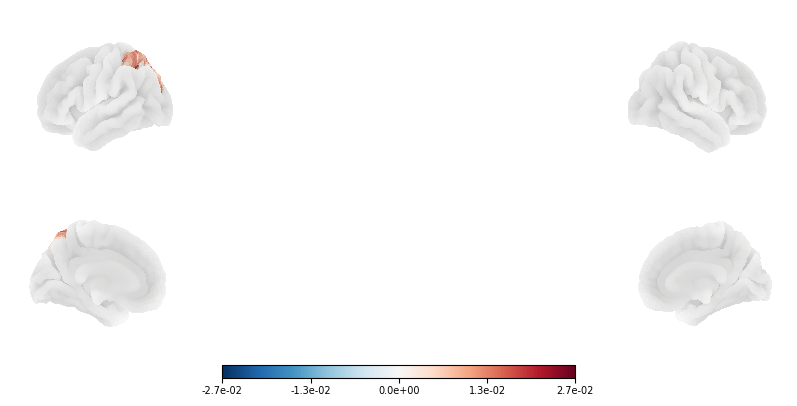

Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 4: descriptive group maps
  healthy; shared group scale [-2.452e-02, 0, 2.452e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


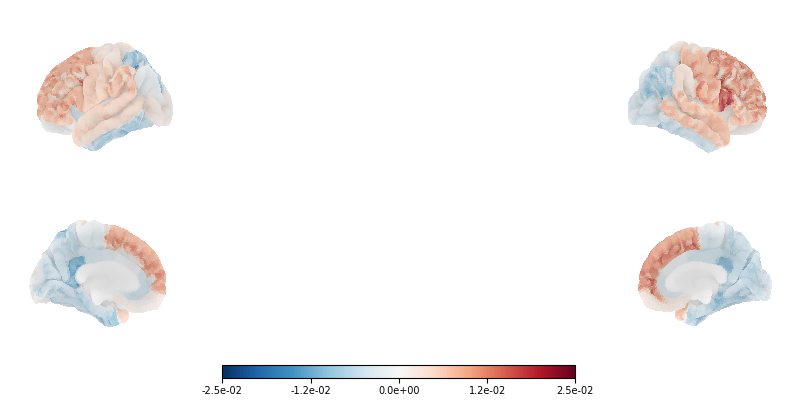

  stroke; shared group scale [-2.452e-02, 0, 2.452e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


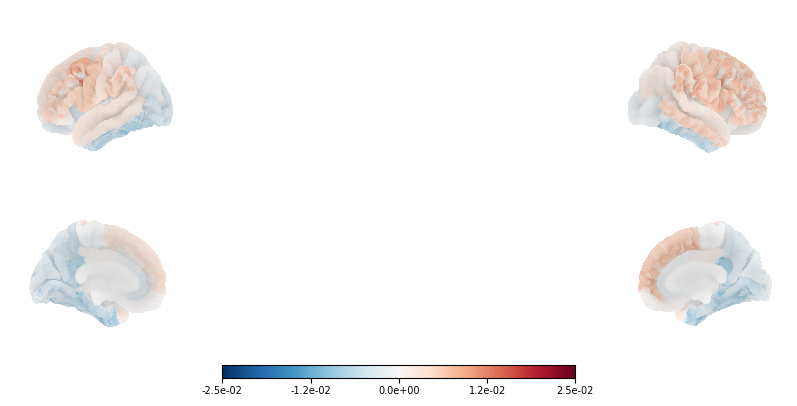

  Full descriptive contrast: stroke minus healthy; scale [-1.626e-02, 0, 1.626e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.07s/it]


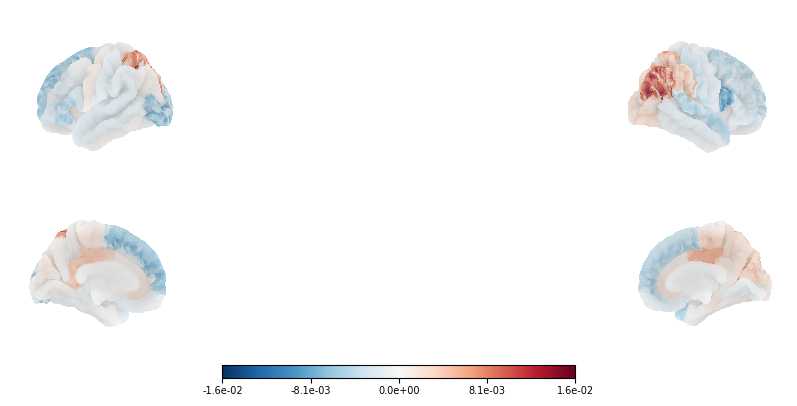

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]


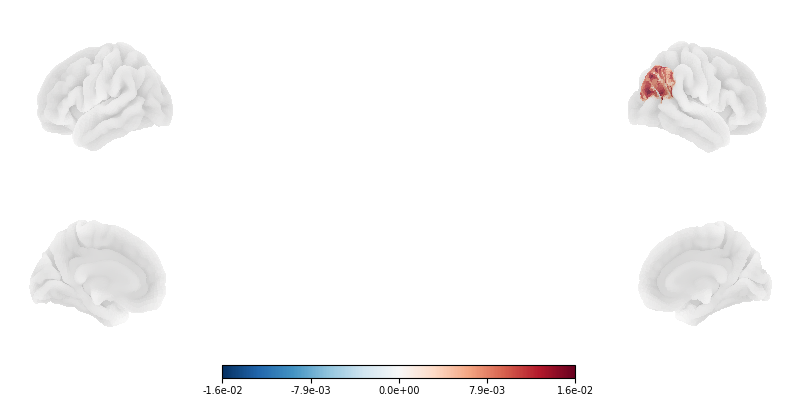

Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 5: descriptive group maps
  healthy; shared group scale [-1.770e-02, 0, 1.770e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]


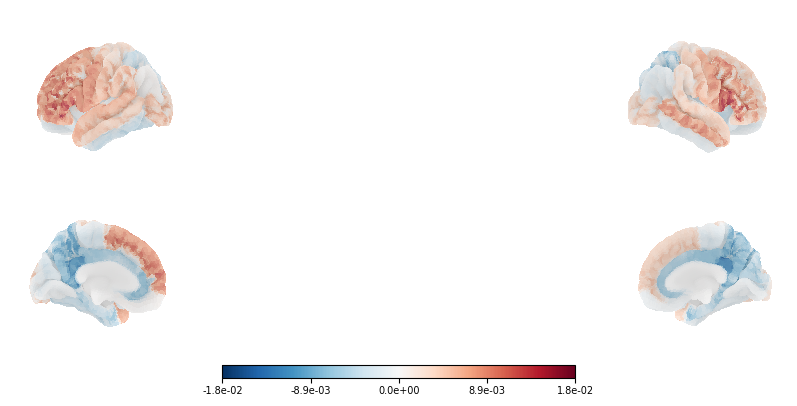

  stroke; shared group scale [-1.770e-02, 0, 1.770e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


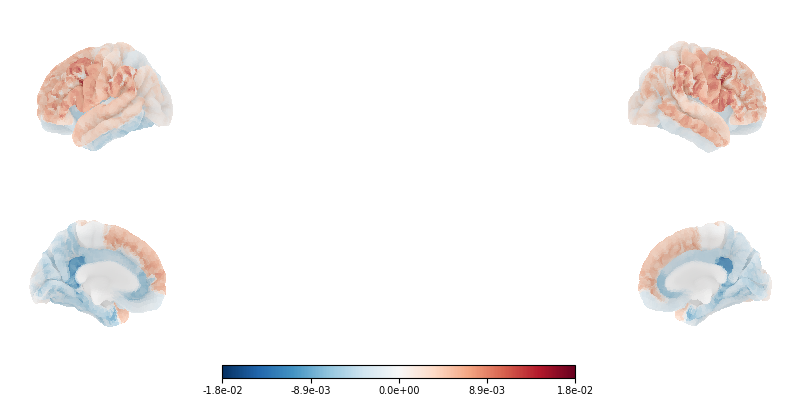

  Full descriptive contrast: stroke minus healthy; scale [-1.382e-02, 0, 1.382e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


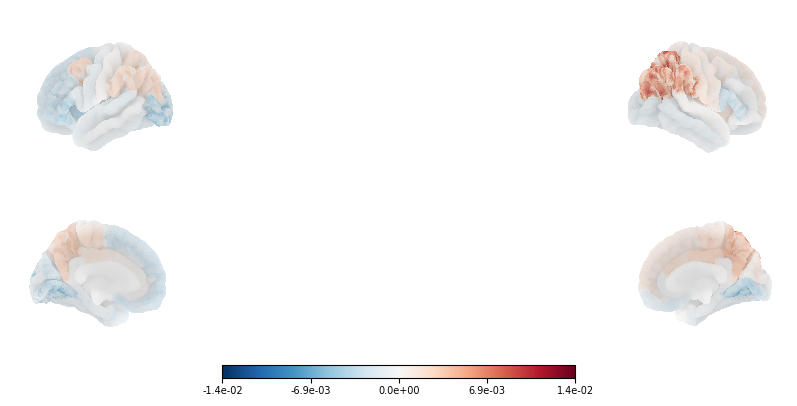

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


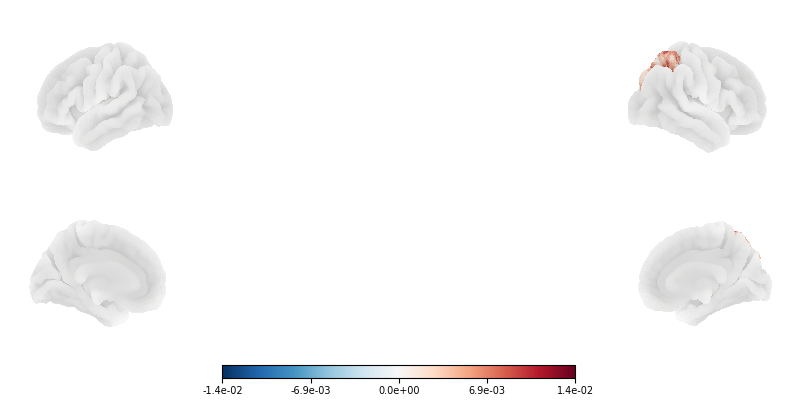

Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 6: descriptive group maps
  healthy; shared group scale [-5.305e-02, 0, 5.305e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.20s/it]


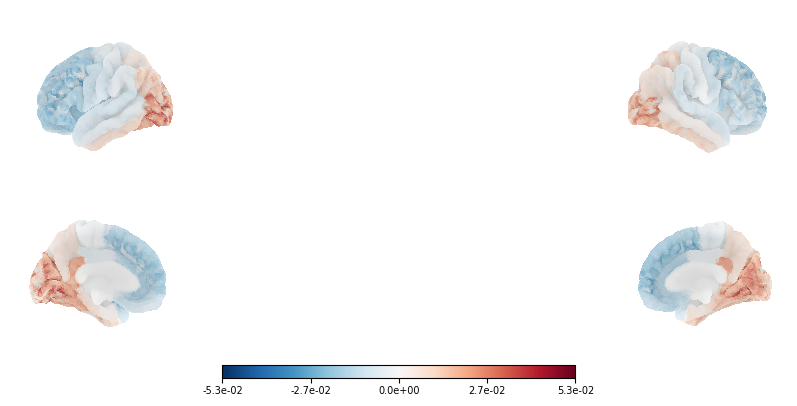

  stroke; shared group scale [-5.305e-02, 0, 5.305e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]


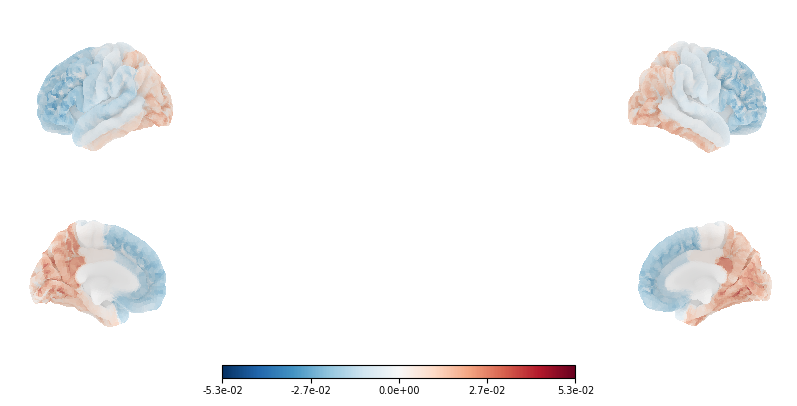

  Full descriptive contrast: stroke minus healthy; scale [-2.139e-02, 0, 2.139e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.15s/it]


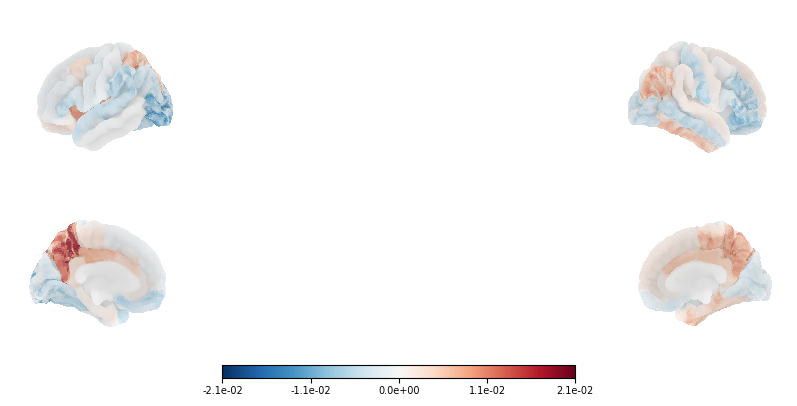

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 7: descriptive group maps
  healthy; shared group scale [-7.175e-02, 0, 7.175e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]


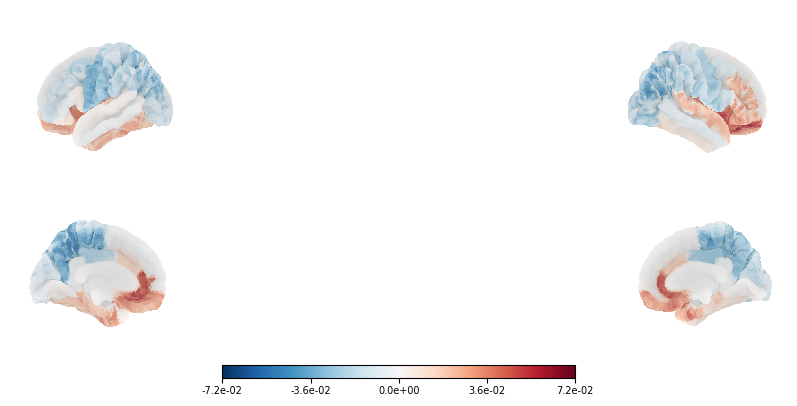

  stroke; shared group scale [-7.175e-02, 0, 7.175e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


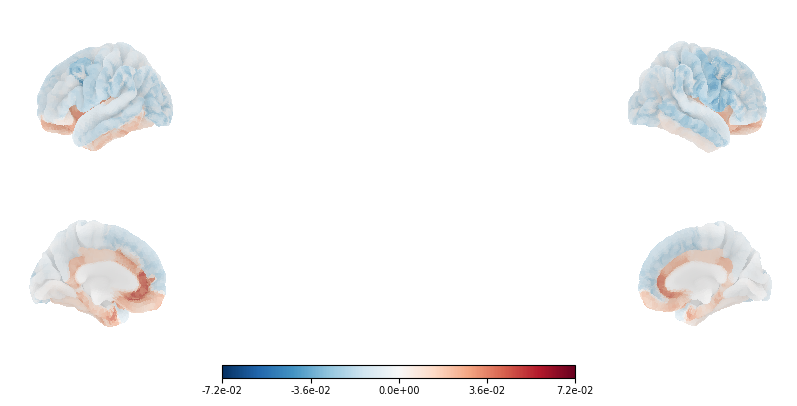

  Full descriptive contrast: stroke minus healthy; scale [-7.370e-02, 0, 7.370e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


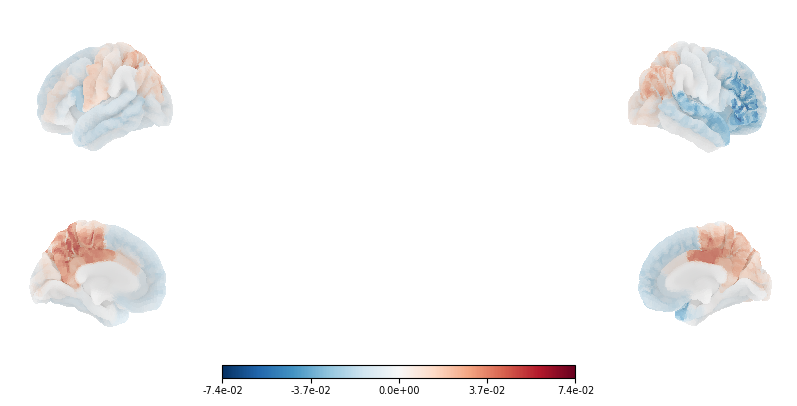

  Parcel-wise Welch tests: 3/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]


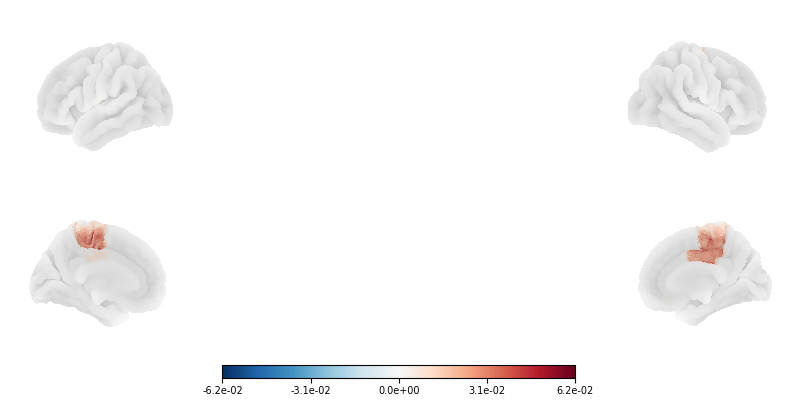

Dynamic state power: Theta (4-8 Hz); FDR across parcels x bands within state, State 8: descriptive group maps
  healthy; shared group scale [-1.706e-02, 0, 1.706e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


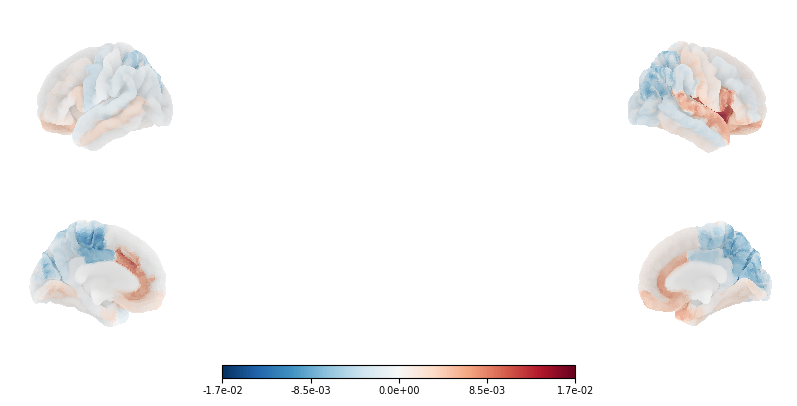

  stroke; shared group scale [-1.706e-02, 0, 1.706e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


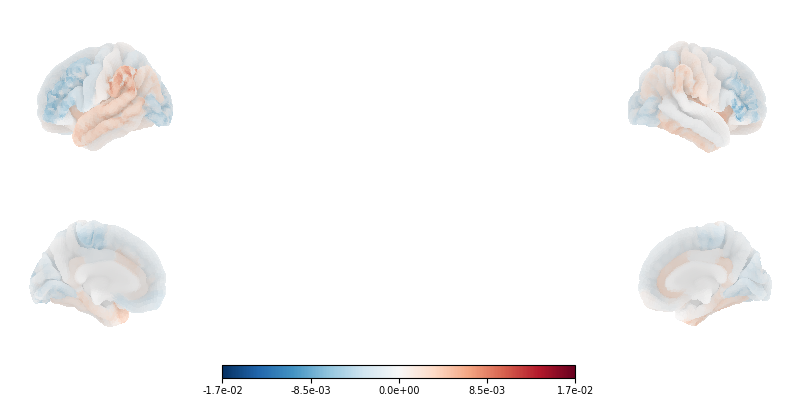

  Full descriptive contrast: stroke minus healthy; scale [-1.330e-02, 0, 1.330e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


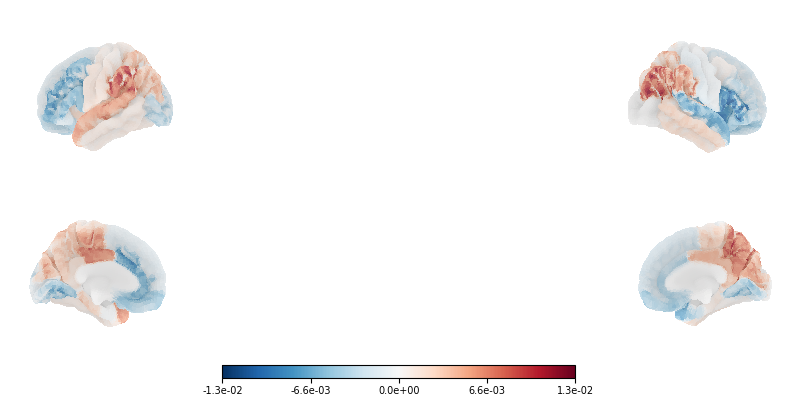

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 1: descriptive group maps
  healthy; shared group scale [-3.125e-02, 0, 3.125e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


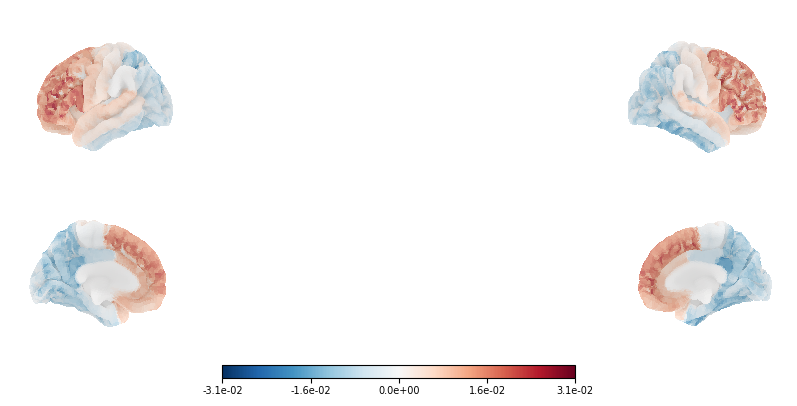

  stroke; shared group scale [-3.125e-02, 0, 3.125e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


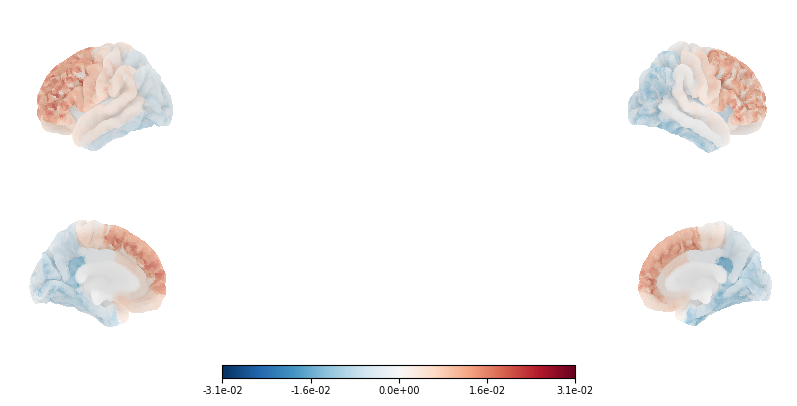

  Full descriptive contrast: stroke minus healthy; scale [-1.544e-02, 0, 1.544e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.07s/it]


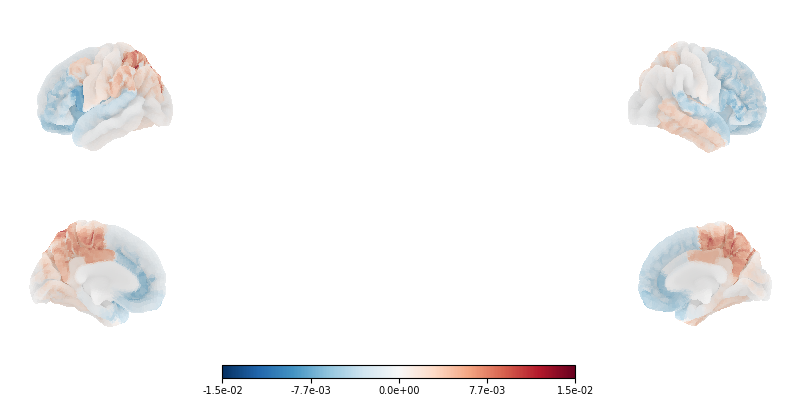

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 2: descriptive group maps
  healthy; shared group scale [-2.253e-02, 0, 2.253e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]


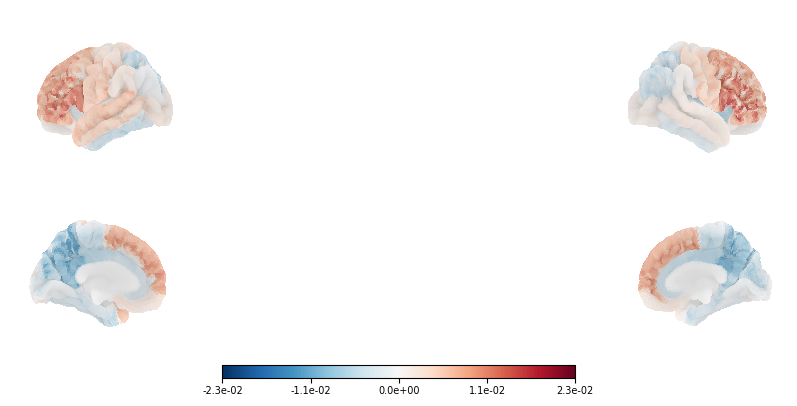

  stroke; shared group scale [-2.253e-02, 0, 2.253e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.10s/it]


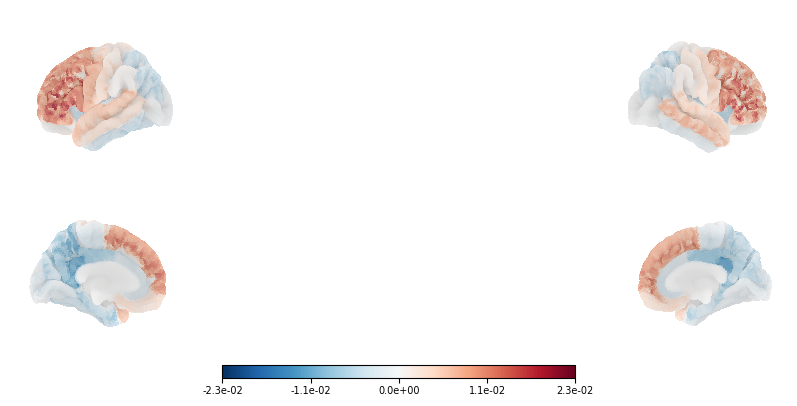

  Full descriptive contrast: stroke minus healthy; scale [-7.318e-03, 0, 7.318e-03]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


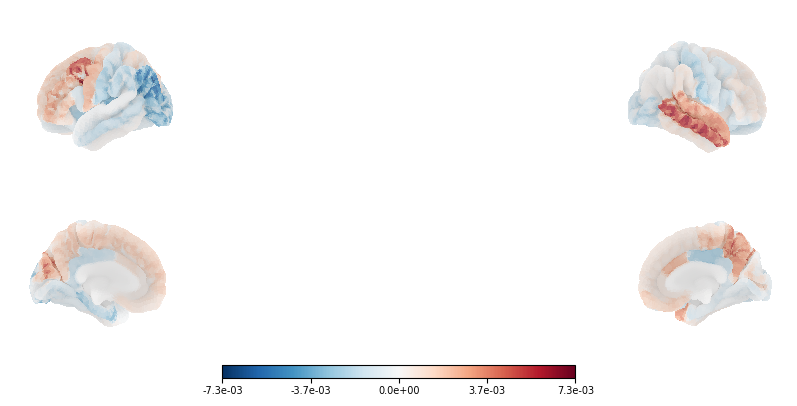

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 3: descriptive group maps
  healthy; shared group scale [-3.307e-02, 0, 3.307e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


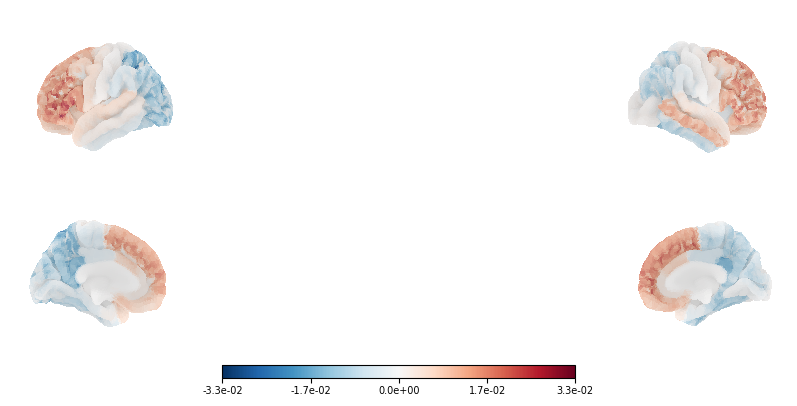

  stroke; shared group scale [-3.307e-02, 0, 3.307e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.07s/it]


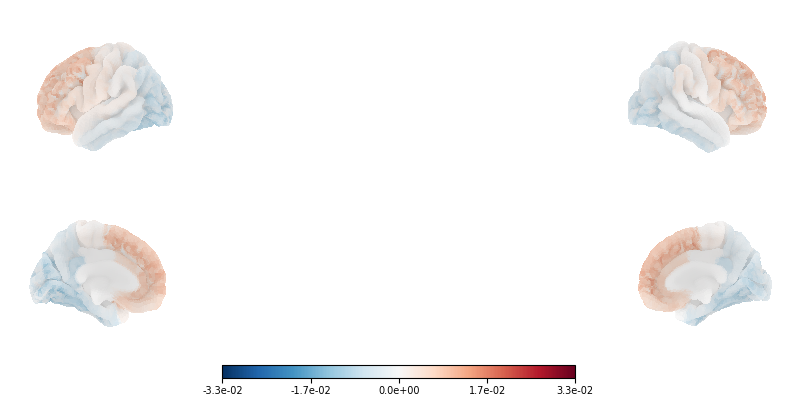

  Full descriptive contrast: stroke minus healthy; scale [-2.495e-02, 0, 2.495e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]


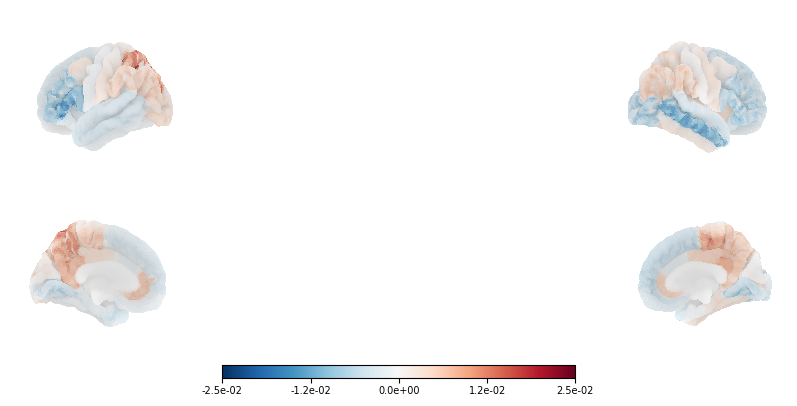

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]


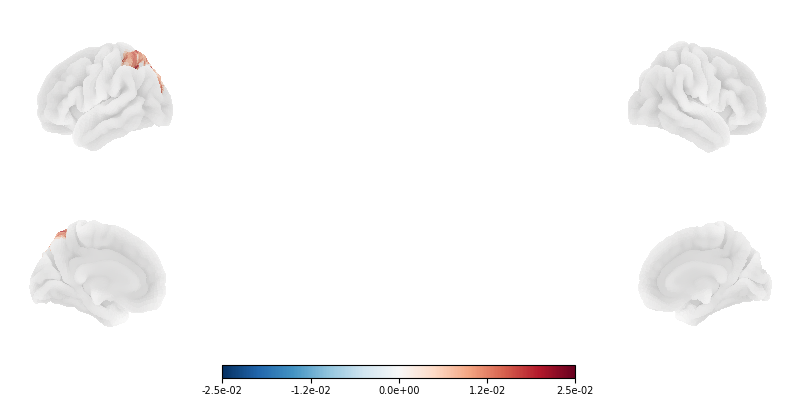

Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 4: descriptive group maps
  healthy; shared group scale [-3.026e-02, 0, 3.026e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]


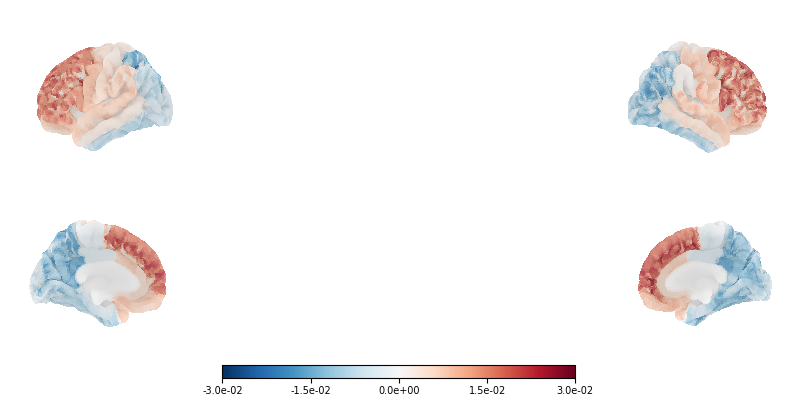

  stroke; shared group scale [-3.026e-02, 0, 3.026e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


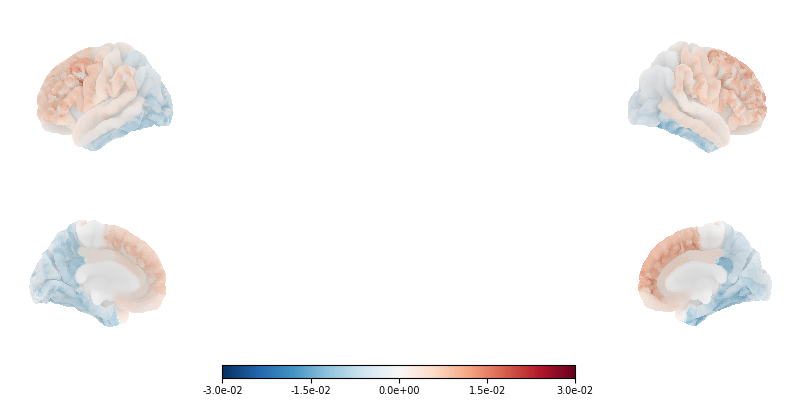

  Full descriptive contrast: stroke minus healthy; scale [-2.231e-02, 0, 2.231e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


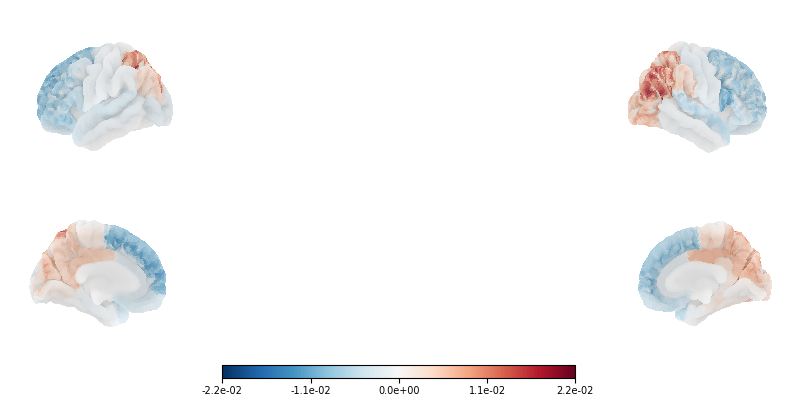

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


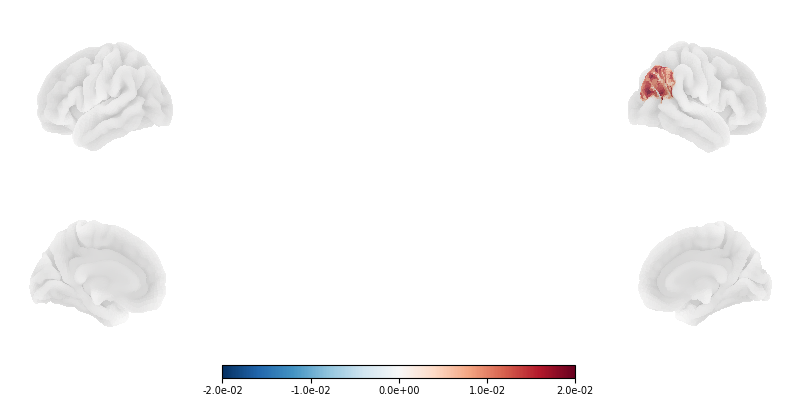

Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 5: descriptive group maps
  healthy; shared group scale [-2.474e-02, 0, 2.474e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]


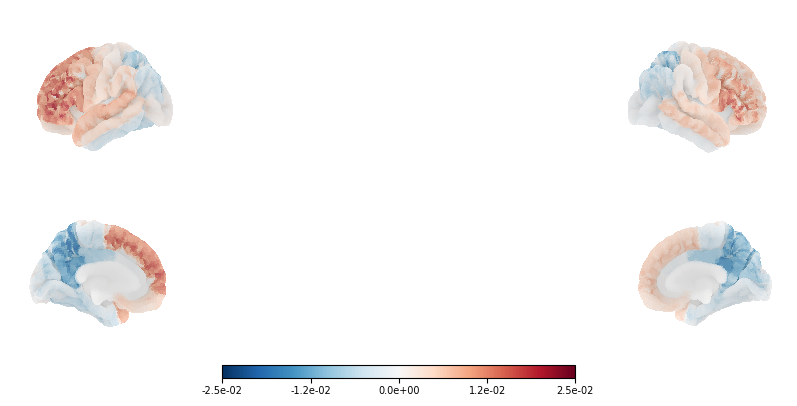

  stroke; shared group scale [-2.474e-02, 0, 2.474e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


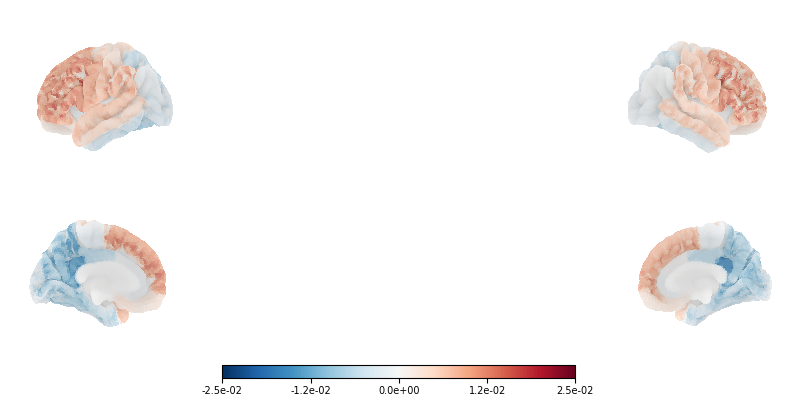

  Full descriptive contrast: stroke minus healthy; scale [-1.066e-02, 0, 1.066e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]


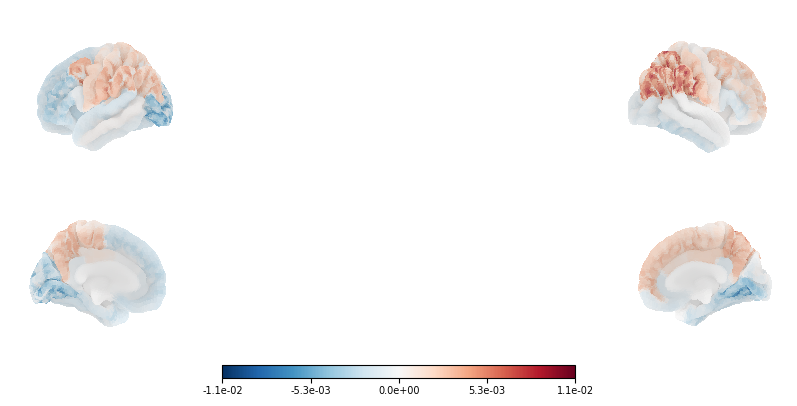

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 6: descriptive group maps
  healthy; shared group scale [-7.988e-02, 0, 7.988e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]


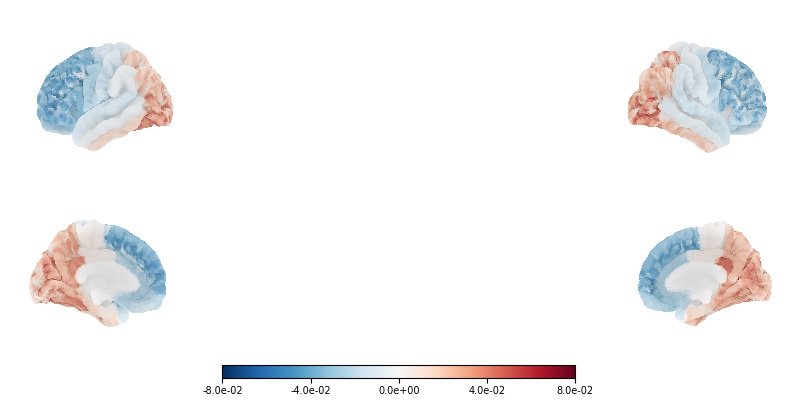

  stroke; shared group scale [-7.988e-02, 0, 7.988e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]


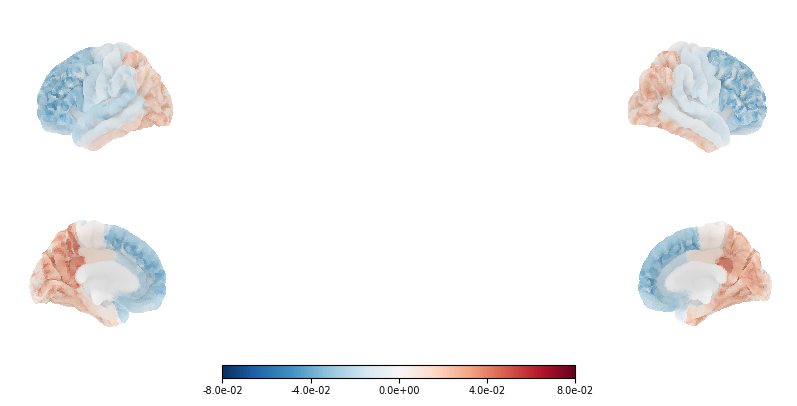

  Full descriptive contrast: stroke minus healthy; scale [-3.354e-02, 0, 3.354e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]


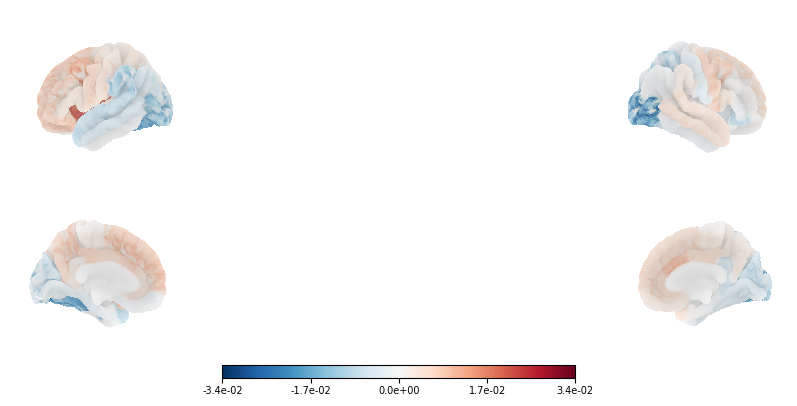

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 7: descriptive group maps
  healthy; shared group scale [-5.214e-02, 0, 5.214e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


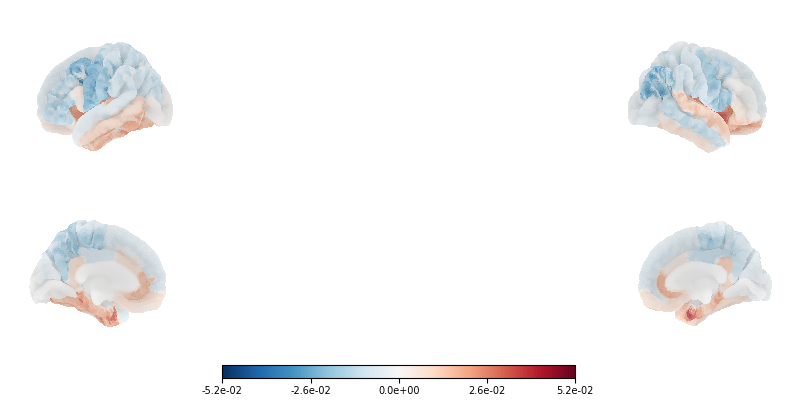

  stroke; shared group scale [-5.214e-02, 0, 5.214e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


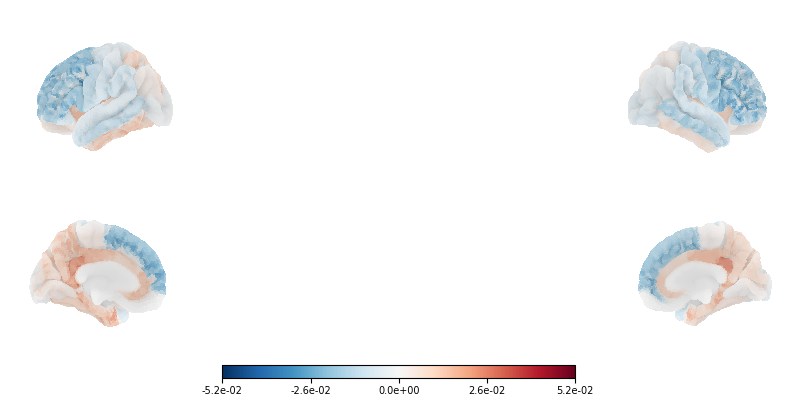

  Full descriptive contrast: stroke minus healthy; scale [-4.917e-02, 0, 4.917e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


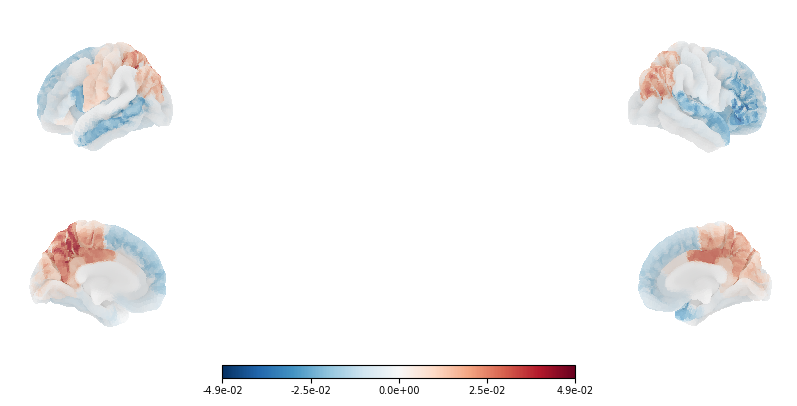

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]


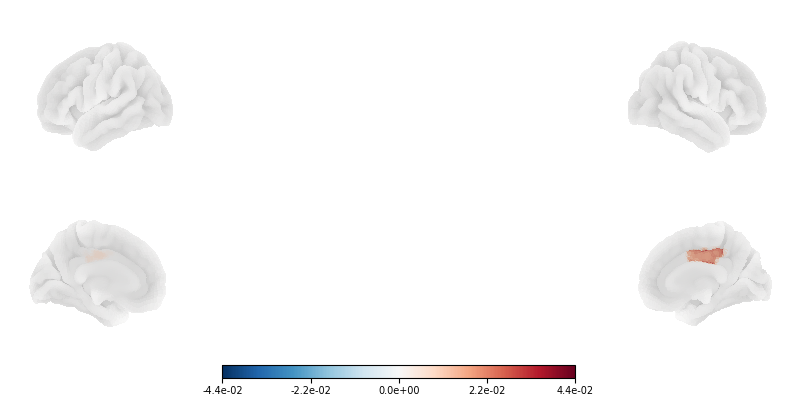

Dynamic state power: Alpha (8-13 Hz); FDR across parcels x bands within state, State 8: descriptive group maps
  healthy; shared group scale [-2.364e-02, 0, 2.364e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.17s/it]


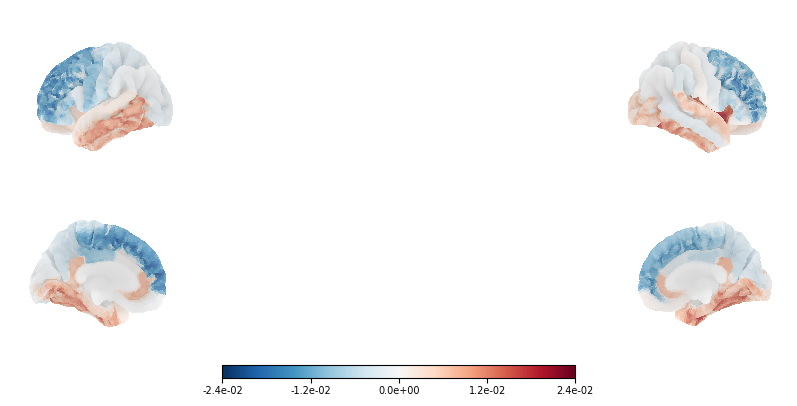

  stroke; shared group scale [-2.364e-02, 0, 2.364e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.15it/s]


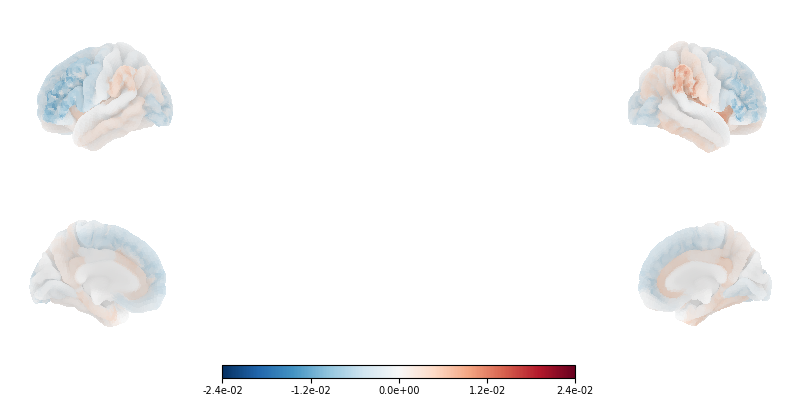

  Full descriptive contrast: stroke minus healthy; scale [-2.113e-02, 0, 2.113e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]


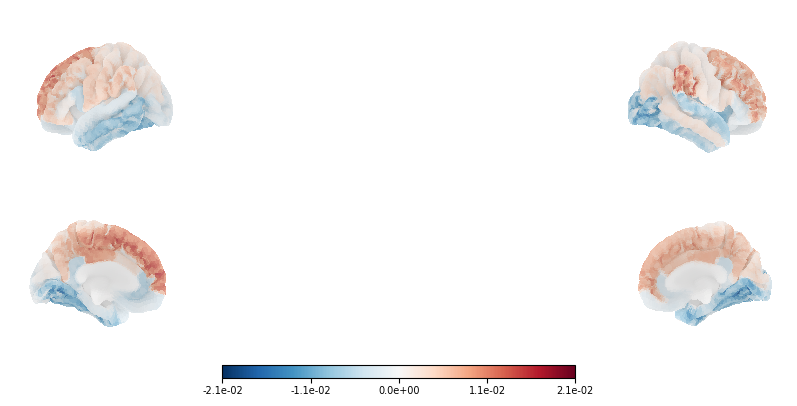

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 1: descriptive group maps
  healthy; shared group scale [-3.820e-02, 0, 3.820e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


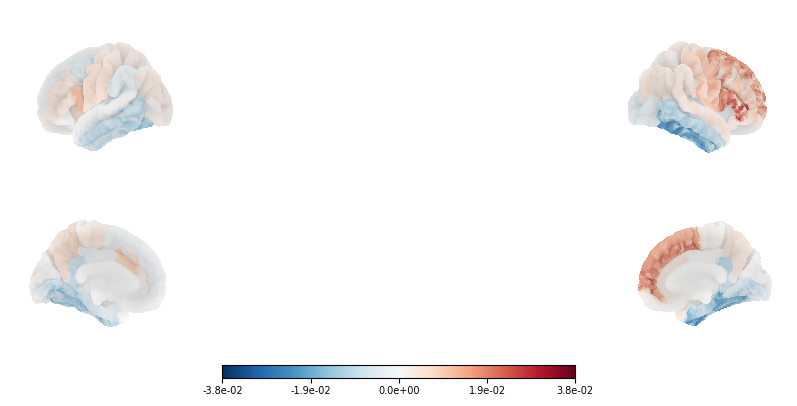

  stroke; shared group scale [-3.820e-02, 0, 3.820e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]


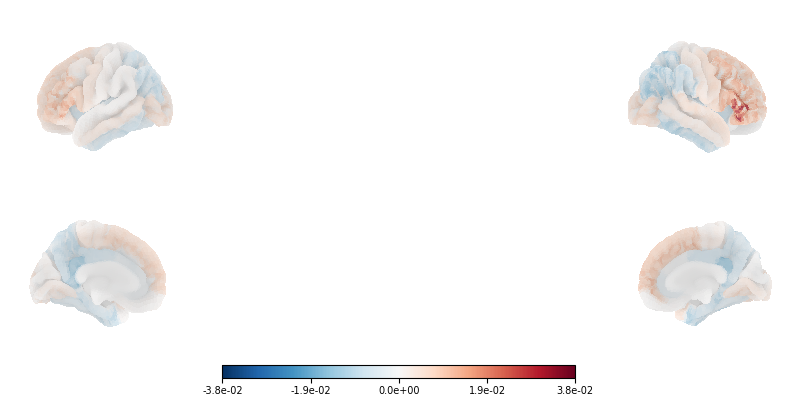

  Full descriptive contrast: stroke minus healthy; scale [-2.765e-02, 0, 2.765e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


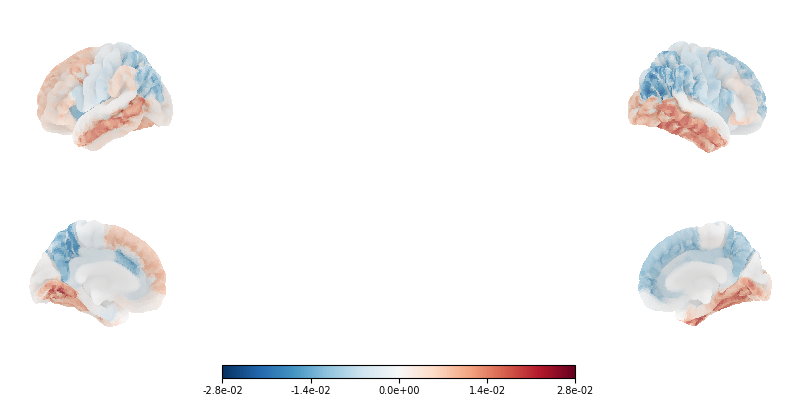

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 2: descriptive group maps
  healthy; shared group scale [-5.821e-02, 0, 5.821e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


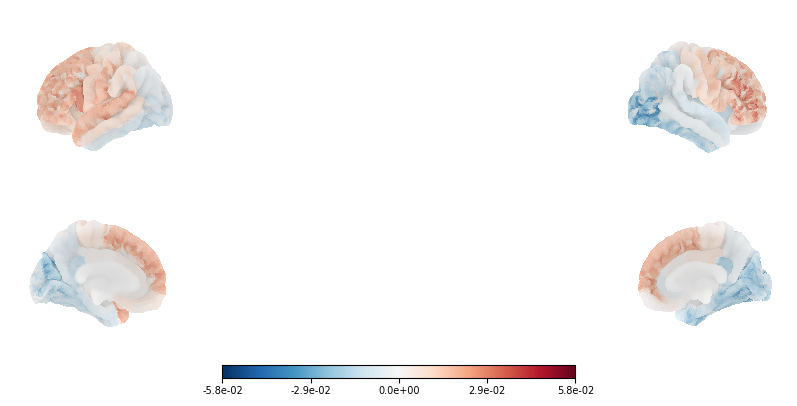

  stroke; shared group scale [-5.821e-02, 0, 5.821e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


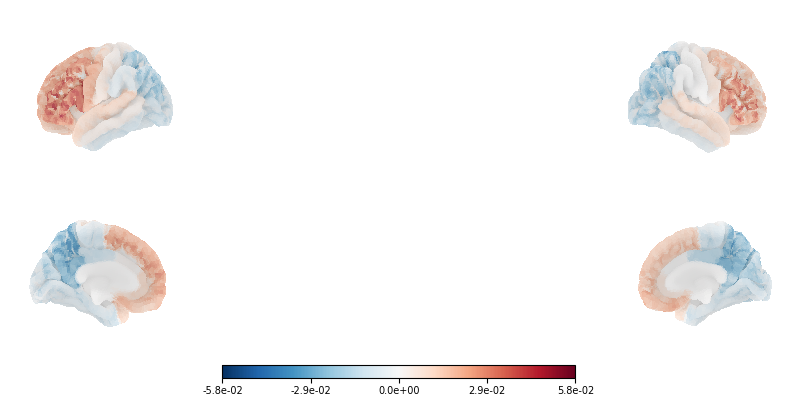

  Full descriptive contrast: stroke minus healthy; scale [-4.173e-02, 0, 4.173e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]


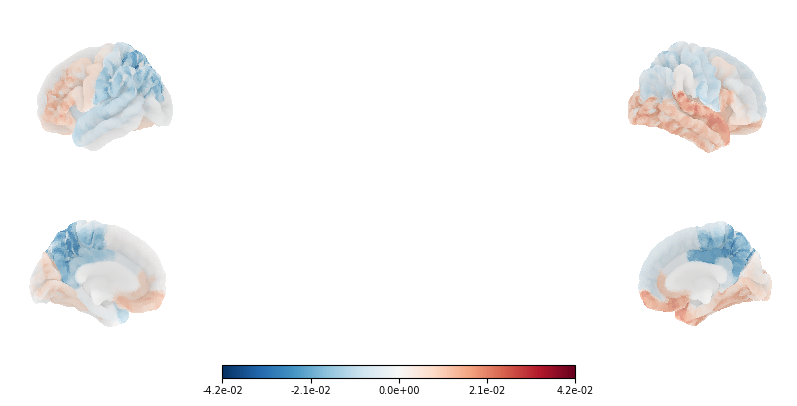

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


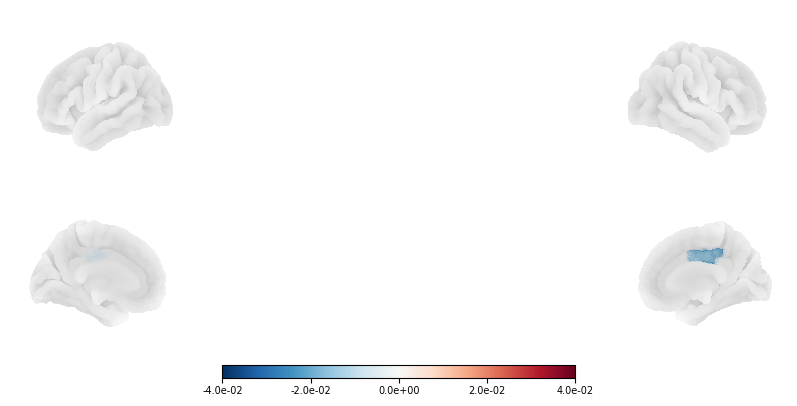

Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 3: descriptive group maps
  healthy; shared group scale [-3.446e-02, 0, 3.446e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]


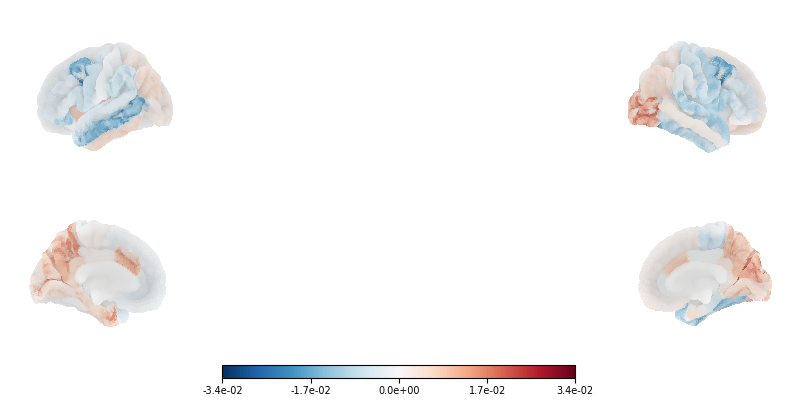

  stroke; shared group scale [-3.446e-02, 0, 3.446e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


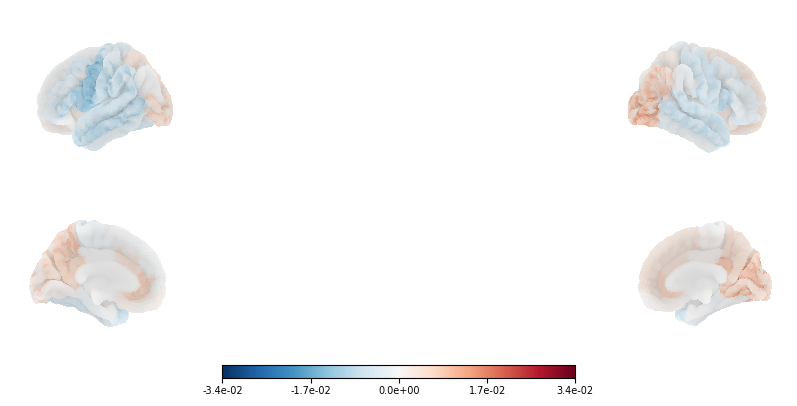

  Full descriptive contrast: stroke minus healthy; scale [-2.499e-02, 0, 2.499e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]


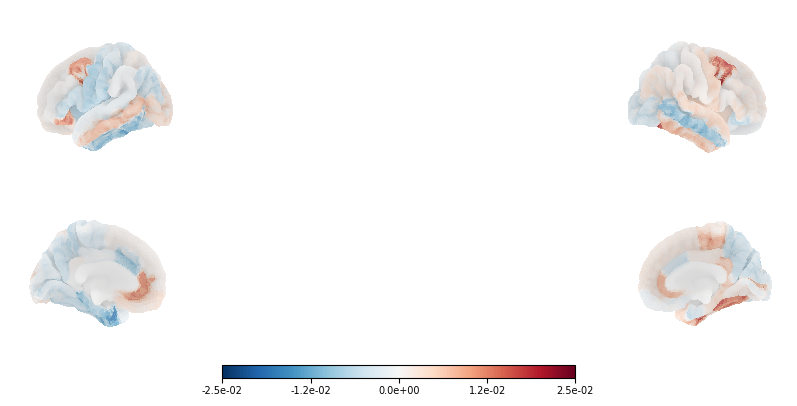

  Parcel-wise Welch tests: 1/62 parcels survive within-map FDR q<0.05
  FDR-significant contrast only


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]


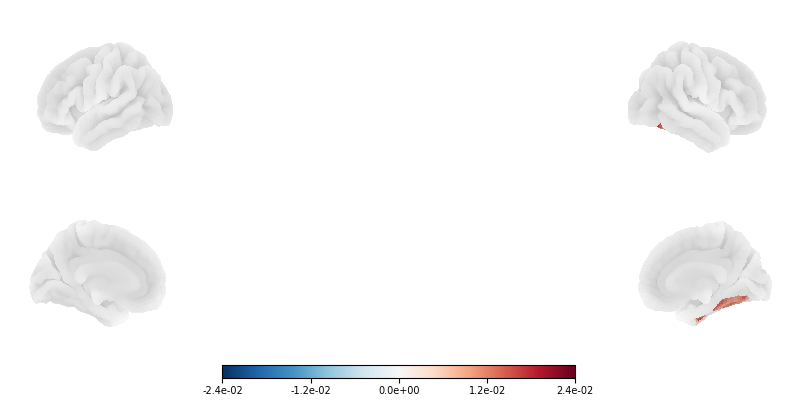

Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 4: descriptive group maps
  healthy; shared group scale [-4.718e-02, 0, 4.718e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]


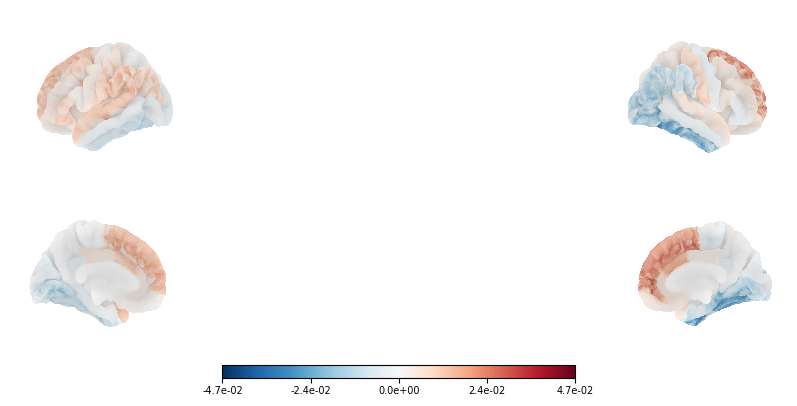

  stroke; shared group scale [-4.718e-02, 0, 4.718e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]


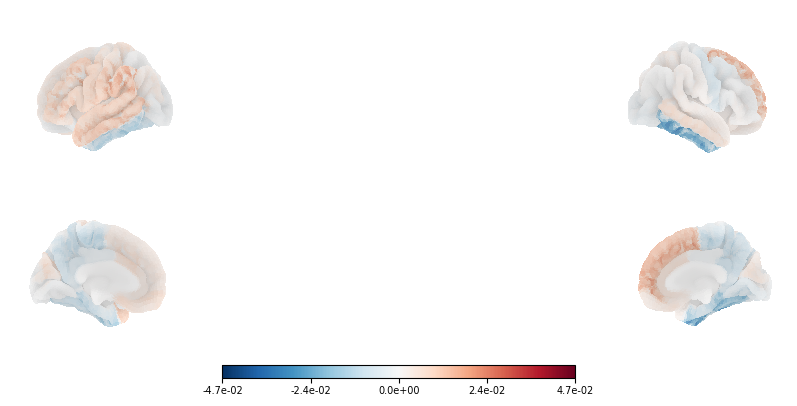

  Full descriptive contrast: stroke minus healthy; scale [-2.443e-02, 0, 2.443e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.00it/s]


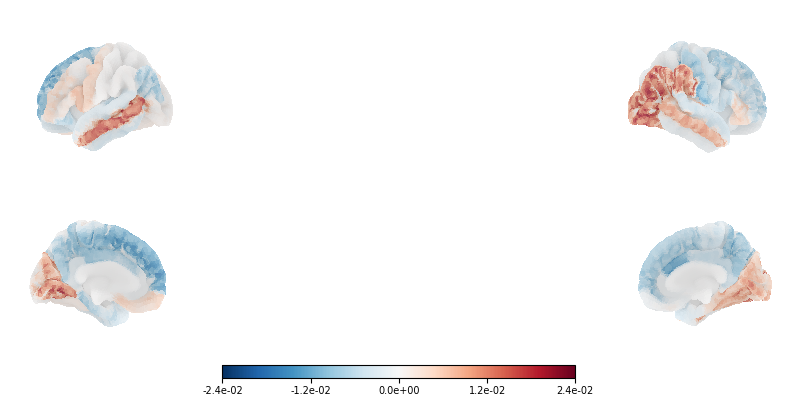

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 5: descriptive group maps
  healthy; shared group scale [-3.044e-02, 0, 3.044e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


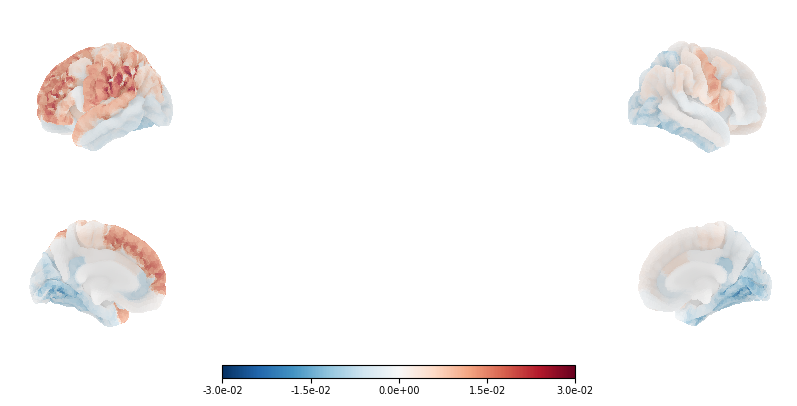

  stroke; shared group scale [-3.044e-02, 0, 3.044e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.09s/it]


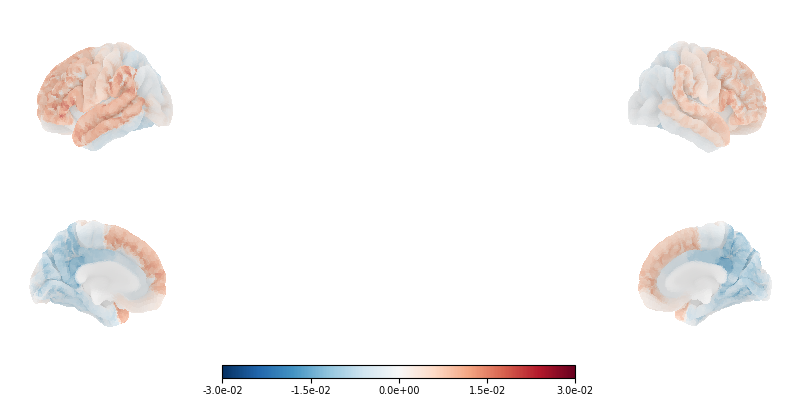

  Full descriptive contrast: stroke minus healthy; scale [-3.169e-02, 0, 3.169e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


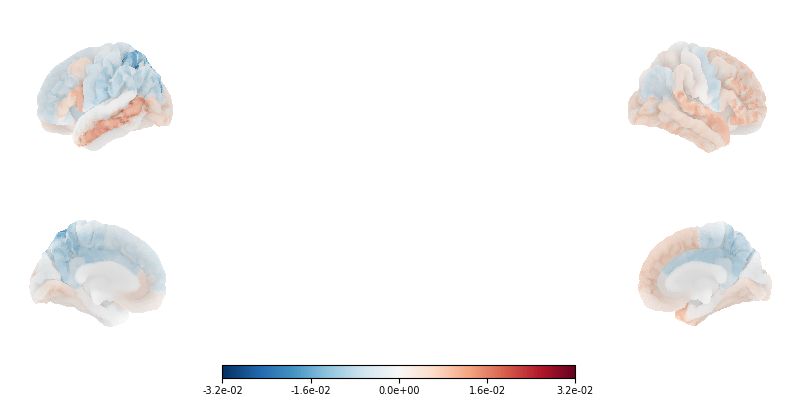

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 6: descriptive group maps
  healthy; shared group scale [-1.246e-01, 0, 1.246e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]


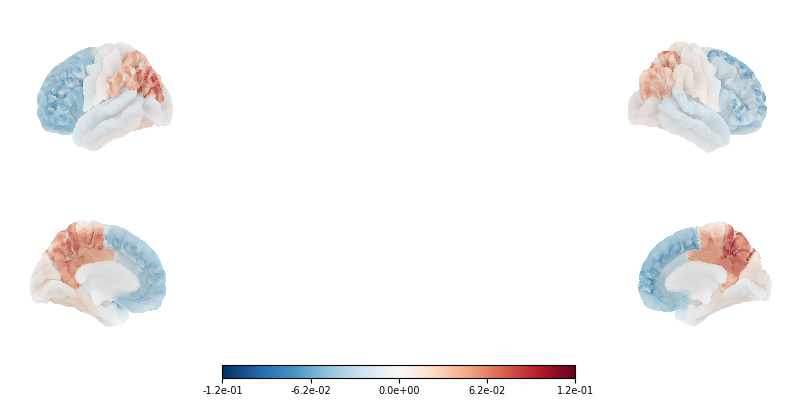

  stroke; shared group scale [-1.246e-01, 0, 1.246e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]


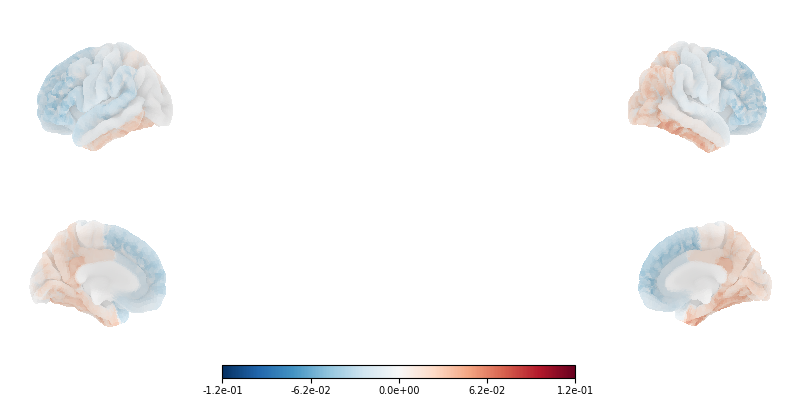

  Full descriptive contrast: stroke minus healthy; scale [-1.200e-01, 0, 1.200e-01]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]


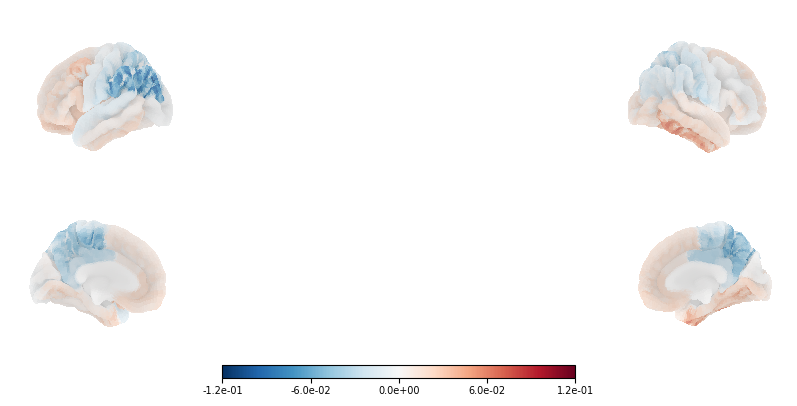

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 7: descriptive group maps
  healthy; shared group scale [-4.791e-02, 0, 4.791e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]


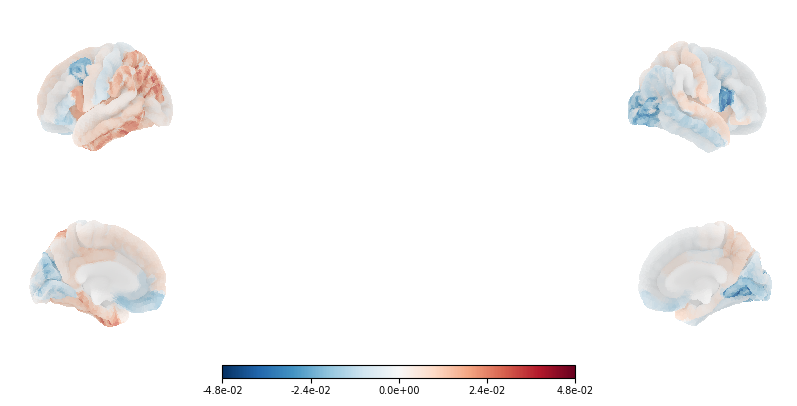

  stroke; shared group scale [-4.791e-02, 0, 4.791e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]


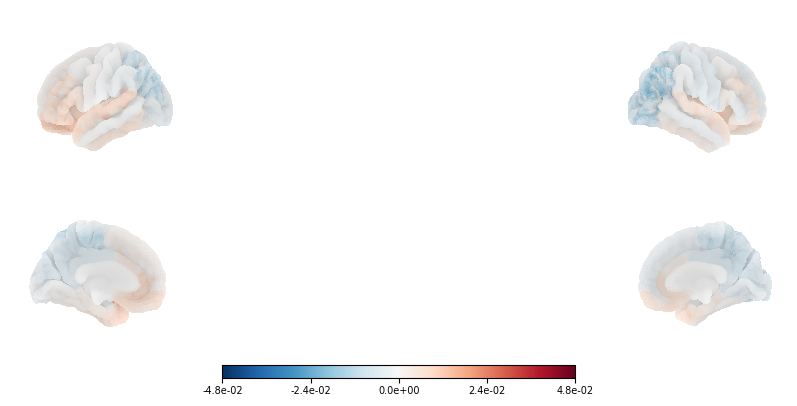

  Full descriptive contrast: stroke minus healthy; scale [-5.605e-02, 0, 5.605e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


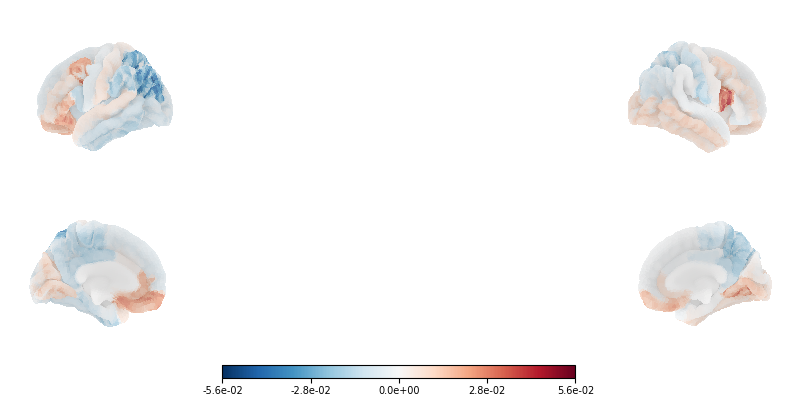

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05
Dynamic state power: Beta (13-30 Hz); FDR across parcels x bands within state, State 8: descriptive group maps
  healthy; shared group scale [-7.217e-02, 0, 7.217e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


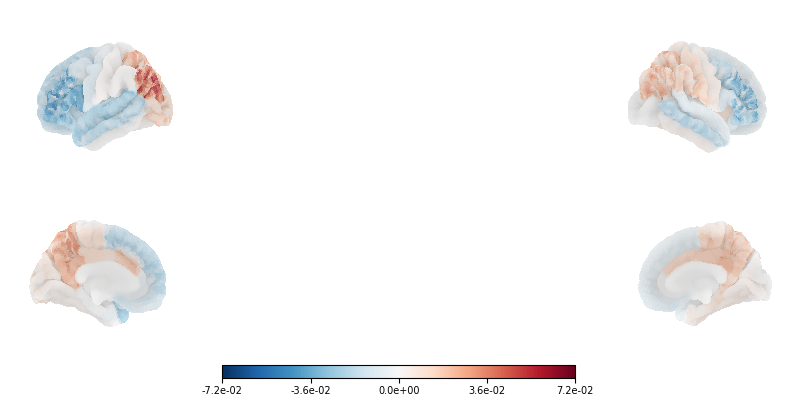

  stroke; shared group scale [-7.217e-02, 0, 7.217e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


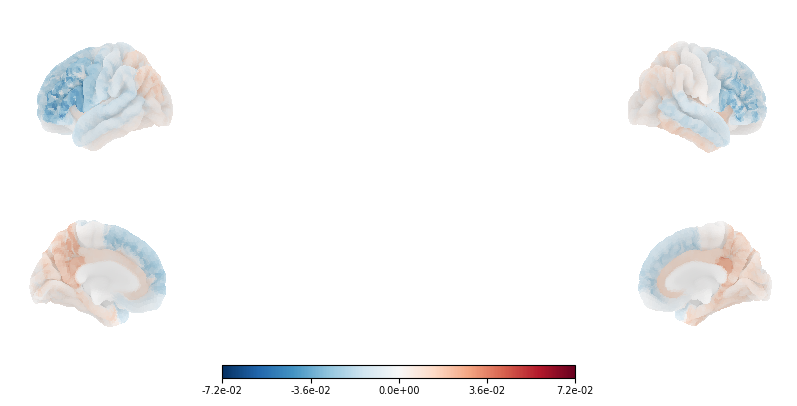

  Full descriptive contrast: stroke minus healthy; scale [-4.896e-02, 0, 4.896e-02]


/workspace/nbenlamr/osl_dynamics/notebooks/.venv_dyncon/lib/python3.11/site-packages/nilearn/image/image.py:1589: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(
Saving images: 100%|██████████████████████████████| 1/1 [00:00<00:00,  1.00it/s]


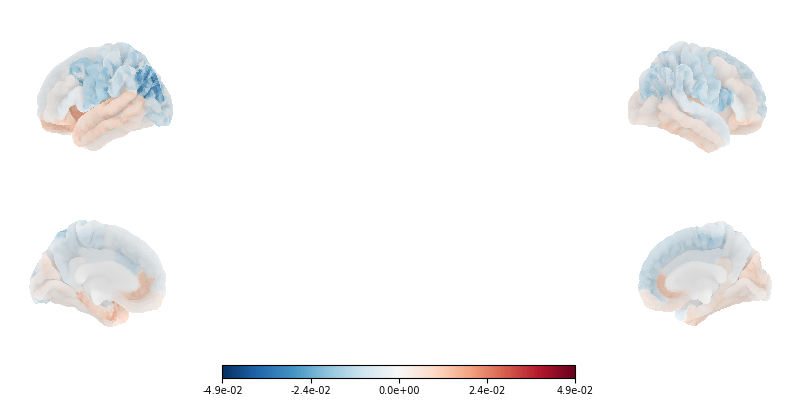

  Parcel-wise Welch tests: 0/62 parcels survive within-map FDR q<0.05


In [79]:
# Purpose: Compute dynamic state-band maps and FDR across parcels and bands within each state.
# Dynamic state-power maps with parcel-by-band FDR separately within each state.
# This matches the static-map correction scope: 62 parcels x 4 bands, while
# retaining the HMM-state dimension and never correcting across the 8 states.
dynamic_spatial_band_tests = {}

for band_name in frequency_bands:
    healthy_maps = center_subject_maps(
        spatial_band_power[band_name][healthy_name]["subject_maps"]
    )
    stroke_maps = center_subject_maps(
        spatial_band_power[band_name][stroke_name]["subject_maps"]
    )
    t_values = np.zeros((n_states, len(atlas_labels)))
    p_values = np.ones_like(t_values)
    effect_sizes = np.zeros_like(t_values)
    centered_contrast = np.zeros_like(t_values)

    for state in range(n_states):
        t_values[state], p_values[state], effect_sizes[state] = (
            welch_feature_test(
                healthy_maps[:, state, :], stroke_maps[:, state, :]
            )
        )
        centered_contrast[state] = (
            stroke_maps[:, state, :].mean(axis=0)
            - healthy_maps[:, state, :].mean(axis=0)
        )

    dynamic_spatial_band_tests[band_name] = {
        "t": t_values,
        "p": p_values,
        "hedges_g": effect_sizes,
        "centered_contrast": centered_contrast,
        "q_fdr": np.ones_like(p_values),
    }

# Eight independent correction families. For each state, concatenate all
# parcel tests from delta, theta, alpha, and beta before applying BH-FDR.
for state in range(n_states):
    state_p_values = np.concatenate([
        dynamic_spatial_band_tests[band_name]["p"][state]
        for band_name in frequency_bands
    ])
    state_q_values = fdr_bh(state_p_values)
    start = 0
    for band_name in frequency_bands:
        stop = start + len(atlas_labels)
        dynamic_spatial_band_tests[band_name]["q_fdr"][state] = (
            state_q_values[start:stop]
        )
        start = stop

dynamic_spatial_parcel_band_rows = []
for state in range(n_states):
    for band_name in frequency_bands:
        result = dynamic_spatial_band_tests[band_name]
        for parcel_index, atlas_label in enumerate(atlas_labels):
            dynamic_spatial_parcel_band_rows.append({
                "state": state + 1,
                "band": band_name,
                "atlas_label": int(atlas_label),
                "stroke_minus_healthy_centered_dynamic_power": (
                    result["centered_contrast"][state, parcel_index]
                ),
                "welch_t": result["t"][state, parcel_index],
                "hedges_g": result["hedges_g"][state, parcel_index],
                "p_value": result["p"][state, parcel_index],
                "q_fdr_parcels_by_bands_within_state": (
                    result["q_fdr"][state, parcel_index]
                ),
                "significant_q05": (
                    result["q_fdr"][state, parcel_index] < STAT_ALPHA
                ),
            })

dynamic_spatial_parcel_band_inference_df = pd.DataFrame(
    dynamic_spatial_parcel_band_rows
)
display(
    dynamic_spatial_parcel_band_inference_df.groupby(
        ["state", "band"]
    )["significant_q05"].sum()
    .rename("n_significant_parcels").reset_index()
)
dynamic_spatial_parcel_band_inference_df.to_csv(
    ROOT / "dynamic_spatial_power_parcel_band_fdr_within_state.csv",
    index=False,
)

# Display the same descriptive maps as above, but threshold the inferential
# contrasts using parcel-by-band FDR within each state.
for band_name, (low, high) in frequency_bands.items():
    display_power_map_set(
        {
            group_name: spatial_band_power[band_name][group_name]["mean"]
            for group_name in group_order
        },
        spatial_band_contrast[band_name],
        (
            f"Dynamic state power: {band_name} ({low:g}-{high:g} Hz); "
            "FDR across parcels x bands within state"
        ),
        dynamic_spatial_band_tests[band_name],
    )


In [ ]:
# Purpose: Plot state-specific PSDs for every band and spatially significant ROI.
# Plot state-specific PSD for every frequency band and all FDR-significant ROIs.
from matplotlib.lines import Line2D

dkt_spectrum_names = {
    2: "Caudal anterior cingulate", 3: "Caudal middle frontal",
    5: "Cuneus", 6: "Entorhinal", 7: "Fusiform",
    8: "Inferior parietal", 9: "Inferior temporal",
    10: "Isthmus cingulate", 11: "Lateral occipital",
    12: "Lateral orbitofrontal", 13: "Lingual",
    14: "Medial orbitofrontal", 15: "Middle temporal",
    16: "Parahippocampal", 17: "Paracentral lobule",
    18: "Pars opercularis", 19: "Pars orbitalis",
    20: "Pars triangularis", 21: "Pericalcarine",
    22: "Postcentral", 23: "Posterior cingulate",
    24: "Precentral", 25: "Precuneus",
    26: "Rostral anterior cingulate", 27: "Rostral middle frontal",
    28: "Superior frontal", 29: "Superior parietal cortex",
    30: "Superior temporal", 31: "Supramarginal",
    34: "Transverse temporal", 35: "Insula",
}


def dkt_spectrum_region_name(atlas_code):
    atlas_code = int(atlas_code)
    hemisphere = "Left" if atlas_code < 2000 else "Right"
    base_code = atlas_code - (1000 if atlas_code < 2000 else 2000)
    return f"{hemisphere} {dkt_spectrum_names.get(base_code, f'DKT {atlas_code}')}"


significant_roi_spectrum_rows = []
significant_roi_spectrum_output = (
    ROOT / "spectra" / "significant_dynamic_roi_psd_all_bands"
)
significant_roi_spectrum_output.mkdir(parents=True, exist_ok=True)

for band_name, (band_low, band_high) in frequency_bands.items():
    band_mask = (f >= band_low) & (f <= band_high)
    f_band = f[band_mask]
    q_values = dynamic_spatial_band_tests[band_name]["q_fdr"]
    states_to_plot = [
        state_index + 1
        for state_index in range(n_states)
        if np.any(q_values[state_index] < STAT_ALPHA)
    ]

    if not states_to_plot:
        print(
            f"{band_name}: no state has an ROI surviving parcel-by-band "
            "FDR q<0.05."
        )
        continue

    n_columns = min(3, len(states_to_plot))
    n_rows = int(np.ceil(len(states_to_plot) / n_columns))
    fig, axes = plt.subplots(
        n_rows,
        n_columns,
        figsize=(6.2 * n_columns, 4.8 * n_rows),
        squeeze=False,
        sharex=True,
    )
    flat_axes = axes.ravel()

    for panel_index, state_label in enumerate(states_to_plot):
        ax = flat_axes[panel_index]
        state_index = state_label - 1
        roi_indices = np.flatnonzero(q_values[state_index] < STAT_ALPHA)
        roi_colors = plt.cm.nipy_spectral(
            np.linspace(0.05, 0.95, len(roi_indices))
        )

        for roi_color, parcel_index in zip(roi_colors, roi_indices):
            atlas_label = int(atlas_labels[parcel_index])
            region_name = dkt_spectrum_region_name(atlas_label)
            q_value = float(q_values[state_index, parcel_index])

            for group_name, linestyle in [
                (healthy_name, "-"),
                (stroke_name, "--"),
            ]:
                subject_curves = group_results[group_name][
                    "subject_dynamic_psd_atlas"
                ][:, state_index, parcel_index, :][:, band_mask]
                mean_curve = subject_curves.mean(axis=0)
                sd_curve = subject_curves.std(axis=0, ddof=1)
                ax.plot(
                    f_band,
                    mean_curve,
                    color=roi_color,
                    linestyle=linestyle,
                    linewidth=2 if group_name == healthy_name else 1.8,
                    label=(
                        f"ROI {atlas_label}: {region_name} (q={q_value:.2g})"
                        if group_name == healthy_name else None
                    ),
                )

                for frequency, mean_value, sd_value in zip(
                    f_band, mean_curve, sd_curve
                ):
                    significant_roi_spectrum_rows.append({
                        "band": band_name,
                        "state": state_label,
                        "atlas_label": atlas_label,
                        "region_name": region_name,
                        "group": group_name,
                        "frequency_hz": frequency,
                        "dynamic_psd_mean": mean_value,
                        "dynamic_psd_sd": sd_value,
                        "q_fdr_parcels_by_bands_within_state": q_value,
                    })

        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(
            f"State {state_label}: {len(roi_indices)} significant "
            f"{band_name.lower()} ROI(s)"
        )
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Dynamic PSD (a.u.)")
        ax.set_xlim(band_low, band_high)
        ax.grid(True, alpha=0.25)
        ax.legend(title="ROI: colour", fontsize=7, title_fontsize=8)

    for unused_axis in flat_axes[len(states_to_plot):]:
        unused_axis.axis("off")

    style_handles = [
        Line2D(
            [0], [0], color="black", linestyle="-", linewidth=2,
            label=healthy_name,
        ),
        Line2D(
            [0], [0], color="black", linestyle="--", linewidth=2,
            label=stroke_name,
        ),
    ]
    fig.legend(
        handles=style_handles,
        title="Group: line style",
        loc="upper center",
        ncol=2,
        bbox_to_anchor=(0.5, 1.01),
    )
    fig.suptitle(
        f"{band_name} PSD in FDR-significant dynamic spatial ROIs "
        f"({band_low:g}-{band_high:g} Hz)",
        y=1.04,
        fontsize=14,
    )
    plt.tight_layout()
    figure_base = (
        significant_roi_spectrum_output
        / f"{band_name.lower()}_significant_dynamic_roi_psd"
    )
    fig.savefig(figure_base.with_suffix(".png"), dpi=300, bbox_inches="tight")
    fig.savefig(figure_base.with_suffix(".pdf"), bbox_inches="tight")
    plt.show()

significant_dynamic_roi_spectra_df = pd.DataFrame(
    significant_roi_spectrum_rows
)
display(significant_dynamic_roi_spectra_df)
significant_dynamic_roi_spectra_df.to_csv(
    significant_roi_spectrum_output
    / "all_bands_significant_dynamic_roi_psd.csv",
    index=False,
)


In [80]:
# Purpose: Define neutral state labels without imposing an NNMF-derived interpretation.
# Keep state labels neutral until their spatial and spectral patterns are interpreted.
# No frequency-component-derived state ordering or labels are used.
state_labels = [f"State {state + 1}" for state in range(n_states)]
state_labels

['State 1',
 'State 2',
 'State 3',
 'State 4',
 'State 5',
 'State 6',
 'State 7',
 'State 8']

## Longitudinal motor recovery, prediction, and coherence

These analyses map each HMM recording to the clinical participant ID, orient the motor score to the normalized right motor side, and use baseline T1 EEG to study T2/T3 motor outcomes. Regional tests use Spearman correlations with FDR control. Classification uses subject-level repeated stratified cross-validation. Coherence inference controls FDR across edges and frequency bands within each state, but not across states.


In [ ]:
# Purpose: Map HMM subjects to longitudinal clinical records and normalize the affected motor side.
# Prepare the exact EEG-clinical subject mapping and longitudinal motor table.
# Normalized-right motor = physical right for left lesions and physical left
# for right lesions whose source-space data were left-right flipped.
from pathlib import Path
import importlib
import longitudinal_recovery_analysis as longitudinal_analysis
longitudinal_analysis = importlib.reload(longitudinal_analysis)

prepare_longitudinal_data = longitudinal_analysis.prepare_longitudinal_data
run_coherence_analysis = longitudinal_analysis.run_coherence_analysis

CLINICAL_DATA_ROOT = Path("/workspace/nbenlamr/osl_data")
LONGITUDINAL_OUTPUT_ROOT = ROOT / "longitudinal_motor_recovery"

longitudinal_bundle = prepare_longitudinal_data(
    globals(), CLINICAL_DATA_ROOT, LONGITUDINAL_OUTPUT_ROOT
)


### Confounders and implicit patient-number mapping

Rows 1–86 of `Variables_FINAL_T2T1.xlsx` and `Variables_FINAL_T3T1.xlsx` map explicitly to patient numbers 1–86; missing patients are not compressed. Age, visit interval and lesion size are continuous. Education is categorical. T2 outcomes use T2–T1 covariates and T3 outcomes use T3–T1 covariates. Missing-value imputation and encoding for prediction are learned inside training folds.


In [ ]:
# Purpose: Load and merge interval-specific T2–T1 and T3–T1 confounders by patient number.
# Load T2-T1 and T3-T1 confounders by implicit patient number (rows 1-86).
expected_confounder_columns = ["Age", "Edu", "DaysDiff", "LesionSize"]


def load_interval_confounders(filename, suffix):
    table = pd.read_excel(CLINICAL_DATA_ROOT / filename, sheet_name="Sheet1")
    missing = set(expected_confounder_columns).difference(table.columns)
    if missing:
        raise KeyError(f"{filename}: missing columns {sorted(missing)}")
    if len(table) != 86:
        raise ValueError(
            f"{filename} must contain exactly 86 rows corresponding to "
            f"patient numbers 1-86; found {len(table)} rows."
        )
    table = table[expected_confounder_columns].copy()
    table.insert(0, "patient_number", np.arange(1, 87, dtype=int))
    table = table.rename(columns={
        "Age": f"confounder_age_{suffix}",
        "Edu": f"confounder_education_{suffix}",
        "DaysDiff": f"confounder_days_{suffix}",
        "LesionSize": f"confounder_lesion_size_{suffix}",
    })
    for column in [
        f"confounder_age_{suffix}",
        f"confounder_days_{suffix}",
        f"confounder_lesion_size_{suffix}",
    ]:
        table[column] = pd.to_numeric(table[column], errors="coerce")
    # Education is nominal, not a continuous/ordinal predictor.
    education = f"confounder_education_{suffix}"
    table[education] = (
        pd.to_numeric(table[education], errors="coerce")
        .astype("Int64")
        .astype("string")
    )
    return table


confounder_table_T2T1 = load_interval_confounders(
    "Variables_FINAL_T2T1.xlsx", "T2T1"
)
confounder_table_T3T1 = load_interval_confounders(
    "Variables_FINAL_T3T1.xlsx", "T3T1"
)

# Keep the historical T2-T1 names used by the downstream recovery regression.
confounder_table_T2T1 = confounder_table_T2T1.rename(columns={
    "confounder_age_T2T1": "confounder_age",
    "confounder_education_T2T1": "confounder_education",
    "confounder_days_T2T1": "confounder_days_T2_minus_T1",
    "confounder_lesion_size_T2T1": "confounder_lesion_size",
})

confounder_columns_T2T1 = [
    "confounder_age", "confounder_education",
    "confounder_days_T2_minus_T1", "confounder_lesion_size",
]
confounder_columns_T3T1 = [
    "confounder_age_T3T1", "confounder_education_T3T1",
    "confounder_days_T3T1", "confounder_lesion_size_T3T1",
]
all_confounder_columns = confounder_columns_T2T1 + confounder_columns_T3T1

analysis_table = longitudinal_bundle["analysis_table"].copy()
analysis_table = analysis_table.drop(
    columns=[column for column in all_confounder_columns if column in analysis_table],
    errors="ignore",
)
analysis_table = analysis_table.merge(
    confounder_table_T2T1, on="patient_number", how="left",
    validate="many_to_one",
)
analysis_table = analysis_table.merge(
    confounder_table_T3T1, on="patient_number", how="left",
    validate="many_to_one",
)

longitudinal_bundle["analysis_table"] = analysis_table
longitudinal_bundle["confounder_table_T2T1"] = confounder_table_T2T1
longitudinal_bundle["confounder_table_T3T1"] = confounder_table_T3T1
longitudinal_bundle["continuous_confounders"] = [
    "confounder_age", "confounder_days_T2_minus_T1",
    "confounder_lesion_size",
]
longitudinal_bundle["categorical_confounders"] = ["confounder_education"]
longitudinal_bundle["continuous_confounders_T3T1"] = [
    "confounder_age_T3T1", "confounder_days_T3T1",
    "confounder_lesion_size_T3T1",
]
longitudinal_bundle["categorical_confounders_T3T1"] = [
    "confounder_education_T3T1"
]

confounder_coverage = pd.DataFrame({
    "variable": all_confounder_columns,
    "available_n": [analysis_table[column].notna().sum() for column in all_confounder_columns],
    "missing_n": [analysis_table[column].isna().sum() for column in all_confounder_columns],
})
print(
    "T2-T1 and T3-T1 confounders joined by patient_number=row position "
    "(1-86); participant gaps were preserved."
)
print("Education is categorical in both interval-specific tables.")
display(confounder_coverage)
display(analysis_table[[
    "subject_id", "patient_number", "fm_T1", "fm_T2", "fm_T3",
    "fm_change_T2T1", "fm_change_T3T1", *all_confounder_columns,
]])

analysis_table.to_csv(
    LONGITUDINAL_OUTPUT_ROOT / "t1_eeg_longitudinal_motor_with_confounders.csv",
    index=False,
)


In [ ]:
# Purpose: Compute state- and band-resolved coherence contrasts with edge-wise inference.
# Begin state-resolved coherence analysis.
# Displays stroke-minus-healthy matrices; black dots mark FDR-significant edges.
coherence_results = run_coherence_analysis(
    globals(), LONGITUDINAL_OUTPUT_ROOT
)


### Regional power versus raw Fugl–Meyer scores

The following heatmaps contain only FM-T1, FM-T2 and FM-T3. They report partial Spearman correlations between raw Fugl–Meyer scores and power in ROIs retained by the independent stroke-versus-healthy spatial analysis. Every association is adjusted for age, categorical education and lesion size; asterisks indicate p < 0.05.


In [ ]:
# Purpose: Correlate regional power with raw FM-T1/FM-T2/FM-T3 after confounder adjustment.
# Partial Spearman heatmaps adjusted for age, categorical education and lesion size.
from scipy.stats import rankdata, t as student_t

required = [
    "dynamic_spatial_parcel_band_inference_df",
    "static_spatial_inference_df",
    "longitudinal_bundle",
]
missing = [name for name in required if name not in globals()]
if missing:
    raise RuntimeError(f"Run the spatial and longitudinal cells first: {missing}")

# DKT names used by the atlas in this notebook.
dkt_names = {
    2: "Caudal anterior cingulate", 3: "Caudal middle frontal",
    5: "Cuneus", 6: "Entorhinal", 7: "Fusiform",
    8: "Inferior parietal", 9: "Inferior temporal",
    10: "Isthmus cingulate", 11: "Lateral occipital",
    12: "Lateral orbitofrontal", 13: "Lingual",
    14: "Medial orbitofrontal", 15: "Middle temporal",
    16: "Parahippocampal", 17: "Paracentral lobule",
    18: "Pars opercularis", 19: "Pars orbitalis",
    20: "Pars triangularis", 21: "Pericalcarine",
    22: "Postcentral", 23: "Posterior cingulate",
    24: "Precentral", 25: "Precuneus",
    26: "Rostral anterior cingulate", 27: "Rostral middle frontal",
    28: "Superior frontal", 29: "Superior parietal cortex",
    30: "Superior temporal", 31: "Supramarginal",
    34: "Transverse temporal", 35: "Insula",
}


def dkt_region_name(atlas_label):
    atlas_label = int(atlas_label)
    hemisphere = "Left" if atlas_label < 2000 else "Right"
    base_label = atlas_label - (1000 if atlas_label < 2000 else 2000)
    return f"{hemisphere} {dkt_names.get(base_label, f'ROI {atlas_label}')}"


# ROI selection is inherited from the independent spatial group inference.
band_order = {"theta": 0, "alpha": 1, "beta": 2, "delta": 3}

selected_dynamic_rois = (
    dynamic_spatial_parcel_band_inference_df.loc[
        dynamic_spatial_parcel_band_inference_df["significant_q05"]
    ]
    .query("band in @frequency_bands.keys()")
    .drop_duplicates(["state", "band", "atlas_label"])
    .assign(_band_order=lambda frame: frame["band"].str.lower().map(band_order).fillna(99))
    .sort_values(["_band_order", "state", "atlas_label"])
    .drop(columns="_band_order")
    .reset_index(drop=True)
)
selected_static_rois = (
    static_spatial_inference_df.loc[
        static_spatial_inference_df["significant_q05"]
    ]
    .query("band in @frequency_bands.keys()")
    .drop_duplicates(["band", "atlas_label"])
    .assign(_band_order=lambda frame: frame["band"].str.lower().map(band_order).fillna(99))
    .sort_values(["_band_order", "atlas_label"])
    .drop(columns="_band_order")
    .reset_index(drop=True)
)
if selected_dynamic_rois.empty and selected_static_rois.empty:
    raise ValueError("No ROI survived the preceding spatial analysis.")

selected_dynamic_rois["region_name"] = selected_dynamic_rois[
    "atlas_label"
].map(dkt_region_name)
selected_static_rois["region_name"] = selected_static_rois[
    "atlas_label"
].map(dkt_region_name)

# Kept for the following ROI boxplot and prediction cells.
selected_rois = selected_dynamic_rois

clinical = longitudinal_bundle["analysis_table"].reset_index(drop=True)
atlas_codes = np.asarray(longitudinal_bundle["atlas_labels"], dtype=int)
outcomes = {
    "fm_T1": "FM-T1",
    "fm_T2": "FM-T2",
    "fm_T3": "FM-T3",
}

# Construct subject-level features using the same transformations as the maps.
features = []
for roi in selected_dynamic_rois.itertuples(index=False):
    parcel = int(np.flatnonzero(atlas_codes == int(roi.atlas_label))[0])
    maps = np.asarray(longitudinal_bundle["dynamic_maps"][roi.band], float)
    maps = maps - maps.mean(axis=-1, keepdims=True)
    features.append({
        "feature_type": "Dynamic",
        "state": int(roi.state),
        "band": roi.band,
        "atlas_label": int(roi.atlas_label),
        "region_name": dkt_region_name(roi.atlas_label),
        "label": (
            f"S{int(roi.state)} | {roi.band} | "
            f"ROI {int(roi.atlas_label)} {dkt_region_name(roi.atlas_label)}"
        ),
        "values": maps[:, int(roi.state) - 1, parcel],
    })

for roi in selected_static_rois.itertuples(index=False):
    parcel = int(np.flatnonzero(atlas_codes == int(roi.atlas_label))[0])
    maps = np.asarray(longitudinal_bundle["static_maps"][roi.band], float)
    maps = np.log(np.clip(maps, np.finfo(float).tiny, None))
    maps = maps - maps.mean(axis=-1, keepdims=True)
    features.append({
        "feature_type": "Static",
        "state": np.nan,
        "band": roi.band,
        "atlas_label": int(roi.atlas_label),
        "region_name": dkt_region_name(roi.atlas_label),
        "label": (
            f"{roi.band} | ROI {int(roi.atlas_label)} "
            f"{dkt_region_name(roi.atlas_label)}"
        ),
        "values": maps[:, parcel],
    })

# Same adjustment set for every raw FM time point; follow-up intervals are excluded.
confounder_columns = [
    "confounder_age", "confounder_education", "confounder_lesion_size",
]
missing_confounders = [
    column for column in confounder_columns if column not in clinical.columns
]
if missing_confounders:
    raise RuntimeError(
        f"Run the confounder-loading cell first. Missing: {missing_confounders}"
    )


def partial_spearman(x, y, covariates, categorical_column):
    # Residualize ranked EEG and FM values on the same covariate design.
    frame = covariates.copy()
    frame["x"] = np.asarray(x, dtype=float)
    frame["y"] = np.asarray(y, dtype=float)
    frame = frame.dropna().copy()
    if len(frame) < 6 or frame["x"].nunique() < 2 or frame["y"].nunique() < 2:
        return np.nan, np.nan, len(frame)

    design = pd.get_dummies(
        frame[confounder_columns],
        columns=[categorical_column],
        drop_first=True,
        dtype=float,
    ).astype(float)
    design.insert(0, "intercept", 1.0)
    design_matrix = design.to_numpy()

    ranked_x = rankdata(frame["x"].to_numpy())
    ranked_y = rankdata(frame["y"].to_numpy())
    residual_x = ranked_x - design_matrix @ np.linalg.lstsq(
        design_matrix, ranked_x, rcond=None
    )[0]
    residual_y = ranked_y - design_matrix @ np.linalg.lstsq(
        design_matrix, ranked_y, rcond=None
    )[0]

    rho = float(np.corrcoef(residual_x, residual_y)[0, 1])
    covariate_rank = int(np.linalg.matrix_rank(design_matrix) - 1)
    degrees_freedom = len(frame) - covariate_rank - 2
    if degrees_freedom <= 0 or not np.isfinite(rho):
        return rho, np.nan, len(frame)

    rho_for_test = np.clip(rho, -1 + 1e-12, 1 - 1e-12)
    statistic = rho_for_test * np.sqrt(
        degrees_freedom / (1 - rho_for_test ** 2)
    )
    p_value = float(2 * student_t.sf(abs(statistic), degrees_freedom))
    return rho, p_value, len(frame)


# Confounder-adjusted partial Spearman correlations.
rows = []
for feature in features:
    x = np.asarray(feature["values"], float)
    for outcome_column, outcome_label in outcomes.items():
        y = clinical[outcome_column].to_numpy(float)
        rho, p_value, sample_size = partial_spearman(
            x,
            y,
            clinical[confounder_columns],
            categorical_column="confounder_education",
        )
        rows.append({
            "feature_type": feature["feature_type"],
            "state": feature["state"],
            "band": feature["band"],
            "atlas_label": feature["atlas_label"],
            "region_name": feature["region_name"],
            "feature": feature["label"],
            "outcome": outcome_label,
            "n": int(sample_size),
            "partial_spearman_rho": float(rho),
            "p_value": float(p_value),
        })

fm_power_correlations_df = pd.DataFrame(rows)


def plot_fm_heatmap(feature_type):
    subset = fm_power_correlations_df.loc[
        fm_power_correlations_df["feature_type"].eq(feature_type)
    ]
    if subset.empty:
        print(f"No {feature_type.lower()} ROI available.")
        return None

    order = subset["feature"].drop_duplicates().tolist()
    rho = subset.pivot(index="outcome", columns="feature", values="partial_spearman_rho")
    pval = subset.pivot(index="outcome", columns="feature", values="p_value")
    rho = rho.reindex(index=list(outcomes.values()), columns=order)
    pval = pval.reindex(index=rho.index, columns=rho.columns)

    fig, ax = plt.subplots(figsize=(max(11, 0.68 * len(order)), 4.2))
    image = ax.imshow(rho.to_numpy(), cmap="RdBu_r", vmin=-1, vmax=1, aspect="auto")
    fig.colorbar(image, ax=ax, label="Partial Spearman rho")
    ax.set_yticks(np.arange(len(rho.index)), rho.index)
    ax.set_xticks(
        np.arange(len(rho.columns)), rho.columns,
        rotation=65, ha="right", fontsize=8,
    )

    for row in range(rho.shape[0]):
        for column in range(rho.shape[1]):
            value = rho.iat[row, column]
            p_value = pval.iat[row, column]
            if np.isfinite(value):
                star = "*" if np.isfinite(p_value) and p_value < 0.05 else ""
                ax.text(
                    column, row, f"{value:.2f}{star}",
                    ha="center", va="center", fontsize=7,
                    color="white" if abs(value) >= 0.55 else "black",
                )

    ax.set_title(
        f"{feature_type} regional power versus raw Fugl–Meyer scores\n"
        "Partial Spearman correlations adjusted for age, education and lesion size; * p < 0.05"
    )
    plt.tight_layout()
    plt.show()
    return fig


dynamic_fm_heatmap = plot_fm_heatmap("Dynamic")
static_fm_heatmap = plot_fm_heatmap("Static")

output_dir = LONGITUDINAL_OUTPUT_ROOT / "fm_score_heatmaps"
output_dir.mkdir(parents=True, exist_ok=True)
fm_power_correlations_df.to_csv(
    output_dir / "fm_T1_T2_T3_power_partial_spearman_adjusted.csv",
    index=False,
)

print("Heatmap associations adjusted for age, categorical education and lesion size.")
display(fm_power_correlations_df)


### Nested-ridge prognosis with parsimonious dynamic EEG summaries

Raw FM-T2 and FM-T3 are predicted from FM-T1 and interval-specific clinical covariates. The dynamic model adds mean theta power across significant state-7 ROIs, state-7 fractional occupancy and switching rate. The static comparator uses mean static beta power across significant static ROIs. Ridge strength is selected inside inner cross-validation. Reported out-of-fold R² depends on the documented outer cross-validation scheme; results from single and repeated partitions must not be compared as if they were identical estimands.


In [ ]:
# Purpose: Predict raw FM-T2/FM-T3 from baseline clinical variables and parsimonious EEG summaries using nested ridge.
# Nested-ridge longitudinal prognosis using parsimonious EEG summaries.
# The outcome is raw follow-up FM; baseline FM-T1 is a predictor in every model.
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, KFold, RepeatedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

prediction_table = longitudinal_bundle["analysis_table"].reset_index(drop=True).copy()
atlas_codes = np.asarray(longitudinal_bundle["atlas_labels"], dtype=int)

# Spatial ROIs were selected by the independent stroke-versus-healthy analysis,
# never by FM-T2/FM-T3 or prediction performance.
target_dynamic_rois = selected_dynamic_rois.loc[
    selected_dynamic_rois["state"].eq(7)
    & selected_dynamic_rois["band"].str.lower().eq("theta")
].copy()
target_static_rois = selected_static_rois.loc[
    selected_static_rois["band"].str.lower().eq("beta")
].copy()
if target_dynamic_rois.empty:
    raise ValueError("No spatially FDR-significant dynamic theta ROI exists in state 7.")
if target_static_rois.empty:
    raise ValueError("No spatially FDR-significant static beta ROI exists.")

# One dynamic regional summary: ordinary mean of centered theta state-7 power
# across the independently selected ROIs. Values share the same physical scale.
dynamic_roi_values = []
for roi in target_dynamic_rois.itertuples(index=False):
    parcel_index = int(np.flatnonzero(atlas_codes == int(roi.atlas_label))[0])
    maps = np.asarray(longitudinal_bundle["dynamic_maps"][roi.band], dtype=float)
    centered_maps = maps - maps.mean(axis=-1, keepdims=True)
    dynamic_roi_values.append(centered_maps[:, 6, parcel_index])
prediction_table["dynamic_theta_state7_mean"] = np.nanmean(
    np.column_stack(dynamic_roi_values), axis=1
)

# One static comparator: mean centered log-beta power across independently
# significant static beta ROIs.
static_roi_values = []
for roi in target_static_rois.itertuples(index=False):
    parcel_index = int(np.flatnonzero(atlas_codes == int(roi.atlas_label))[0])
    maps = np.asarray(longitudinal_bundle["static_maps"][roi.band], dtype=float)
    log_maps = np.log(np.clip(maps, np.finfo(float).tiny, None))
    centered_log_maps = log_maps - log_maps.mean(axis=-1, keepdims=True)
    static_roi_values.append(centered_log_maps[:, parcel_index])
prediction_table["static_beta_mean"] = np.nanmean(
    np.column_stack(static_roi_values), axis=1
)

# Add temporal TDE-HMM summaries by the exact HMM subject identifier.
state7_occupancy = fo_subject_df.loc[
    fo_subject_df["group"].eq("stroke") & fo_subject_df["state"].eq(6),
    ["subject_id", "fractional_occupancy"],
].rename(columns={"fractional_occupancy": "fractional_occupancy_state7"})
stroke_switching = switch_subject_df.loc[
    switch_subject_df["group"].eq("stroke"),
    ["subject_id", "switching_rate_hz"],
]
if state7_occupancy["subject_id"].duplicated().any():
    raise ValueError("State-7 fractional occupancy is not unique by subject_id.")
if stroke_switching["subject_id"].duplicated().any():
    raise ValueError("Switching rate is not unique by subject_id.")
# Make the cell safe to rerun: remove any temporal columns already carried by
# the longitudinal table, otherwise pandas would create _x/_y suffixes.
temporal_columns = ["fractional_occupancy_state7", "switching_rate_hz"]
prediction_table = prediction_table.drop(
    columns=[column for column in temporal_columns if column in prediction_table],
    errors="ignore",
)
prediction_table = prediction_table.merge(
    state7_occupancy, on="subject_id", how="left", validate="one_to_one"
).merge(
    stroke_switching, on="subject_id", how="left", validate="one_to_one"
)

dynamic_summary_columns = [
    "dynamic_theta_state7_mean",
    "fractional_occupancy_state7",
    "switching_rate_hz",
]
static_summary_columns = ["static_beta_mean"]

outcome_specifications = {
    "FM-T2": {
        "outcome": "fm_T2",
        "numeric_covariates": [
            "fm_T1", "confounder_age", "confounder_days_T2_minus_T1",
            "confounder_lesion_size",
        ],
        "categorical_covariates": ["confounder_education"],
        "interval": "T2-T1",
    },
    "FM-T3": {
        "outcome": "fm_T3",
        "numeric_covariates": [
            "fm_T1", "confounder_age_T3T1", "confounder_days_T3T1",
            "confounder_lesion_size_T3T1",
        ],
        "categorical_covariates": ["confounder_education_T3T1"],
        "interval": "T3-T1",
    },
}

model_feature_sets = {
    "Clinical baseline": [],
    "Clinical + dynamic TDE-HMM": dynamic_summary_columns,
    "Clinical + static beta": static_summary_columns,
    "Clinical + dynamic + static": dynamic_summary_columns + static_summary_columns,
}
model_colors = {
    "Clinical baseline": "#6C757D",
    "Clinical + dynamic TDE-HMM": "#7B2CBF",
    "Clinical + static beta": "#009E73",
    "Clinical + dynamic + static": "#CC6677",
}
ridge_alphas = np.logspace(-3, 4, 15)


def make_ridge_pipeline(numeric_covariates, categorical_covariates, eeg_columns):
    transformers = [
        ("clinical_numeric", Pipeline([
            ("impute", SimpleImputer(strategy="median", add_indicator=True)),
            ("scale", StandardScaler()),
        ]), numeric_covariates),
        ("clinical_categorical", Pipeline([
            ("impute", SimpleImputer(strategy="most_frequent")),
            ("one_hot", OneHotEncoder(handle_unknown="ignore", drop="first")),
        ]), categorical_covariates),
    ]
    if eeg_columns:
        transformers.append(("eeg", Pipeline([
            ("impute", SimpleImputer(strategy="median", add_indicator=True)),
            ("scale", StandardScaler()),
        ]), eeg_columns))
    return Pipeline([
        ("preprocess", ColumnTransformer(transformers, remainder="drop")),
        ("model", Ridge(solver="lsqr")),
    ])


summary_rows = []
prediction_rows = []
alpha_rows = []
increment_rows = []
rng_bootstrap = np.random.default_rng(2026)

for outcome_index, (outcome_label, specification) in enumerate(
    outcome_specifications.items()
):
    outcome_column = specification["outcome"]
    valid = np.isfinite(prediction_table[outcome_column].to_numpy(float))
    outcome_table = prediction_table.loc[valid].reset_index(drop=True).copy()
    y = outcome_table[outcome_column].to_numpy(float)
    n_subjects = len(y)
    if n_subjects < 15:
        raise ValueError(f"Only {n_subjects} valid participants for {outcome_label}.")

    numeric_covariates = specification["numeric_covariates"]
    categorical_covariates = specification["categorical_covariates"]
    # Ten repeated outer tests; each patient is predicted ten times. The exact
    # same splits are reused for every model within an outcome.
    outer_cv = RepeatedKFold(
        n_splits=min(5, n_subjects), n_repeats=10,
        random_state=2026 + outcome_index,
    )
    shared_outer_splits = list(outer_cv.split(np.zeros(n_subjects), y))
    outcome_predictions = {}

    for model_index, (model_name, eeg_columns) in enumerate(model_feature_sets.items()):
        columns = numeric_covariates + categorical_covariates + eeg_columns
        X = outcome_table[columns].copy()
        for column in categorical_covariates:
            X[column] = X[column].astype("object")
            X.loc[X[column].isna(), column] = np.nan

        prediction_sum = np.zeros(n_subjects, dtype=float)
        prediction_count = np.zeros(n_subjects, dtype=int)
        selected_alphas = []
        for split_index, (train_indices, test_indices) in enumerate(shared_outer_splits):
            pipeline = make_ridge_pipeline(
                numeric_covariates, categorical_covariates, eeg_columns
            )
            inner_cv = KFold(
                n_splits=min(4, len(train_indices)), shuffle=True,
                random_state=10000 + 1000 * outcome_index + split_index,
            )
            search = GridSearchCV(
                pipeline,
                {"model__alpha": ridge_alphas},
                scoring="neg_mean_squared_error",
                cv=inner_cv,
                n_jobs=-1,
                refit=True,
                error_score="raise",
            )
            search.fit(X.iloc[train_indices], y[train_indices])
            fold_prediction = search.predict(X.iloc[test_indices])
            prediction_sum[test_indices] += fold_prediction
            prediction_count[test_indices] += 1
            selected_alpha = float(search.best_params_["model__alpha"])
            selected_alphas.append(selected_alpha)
            alpha_rows.append({
                "outcome": outcome_label,
                "model": model_name,
                "outer_split": split_index,
                "selected_alpha": selected_alpha,
            })
        if not np.all(prediction_count == 10):
            raise RuntimeError("Each participant must receive 10 OOF predictions.")
        oof_prediction = prediction_sum / prediction_count
        outcome_predictions[model_name] = oof_prediction

        # Descriptive apparent R² from a separately tuned full-sample ridge.
        full_pipeline = make_ridge_pipeline(
            numeric_covariates, categorical_covariates, eeg_columns
        )
        full_inner_cv = KFold(
            n_splits=min(5, n_subjects), shuffle=True,
            random_state=30000 + outcome_index,
        )
        full_search = GridSearchCV(
            full_pipeline,
            {"model__alpha": ridge_alphas},
            scoring="neg_mean_squared_error",
            cv=full_inner_cv,
            n_jobs=-1,
            refit=True,
            error_score="raise",
        )
        full_search.fit(X, y)
        apparent_prediction = full_search.predict(X)

        summary_rows.append({
            "outcome": outcome_label,
            "model": model_name,
            "n": n_subjects,
            "n_eeg_summaries": len(eeg_columns),
            "apparent_full_sample_r2": r2_score(y, apparent_prediction),
            "repeated_oof_r2": r2_score(y, oof_prediction),
            "repeated_oof_rmse": mean_squared_error(y, oof_prediction) ** 0.5,
            "repeated_oof_mae": mean_absolute_error(y, oof_prediction),
            "median_outer_alpha": float(np.median(selected_alphas)),
            "full_sample_selected_alpha": float(full_search.best_params_["model__alpha"]),
            "eeg_summaries": ", ".join(eeg_columns) if eeg_columns else "None",
        })
        for subject_index, predicted in enumerate(oof_prediction):
            prediction_rows.append({
                "outcome": outcome_label,
                "model": model_name,
                "subject_id": outcome_table.loc[subject_index, "subject_id"],
                "patient_number": outcome_table.loc[subject_index, "patient_number"],
                "observed_score": y[subject_index],
                "predicted_score_oof": predicted,
            })

    baseline_prediction = outcome_predictions["Clinical baseline"]
    denominator = np.sum((y - y.mean()) ** 2)
    for model_name, prediction in outcome_predictions.items():
        if model_name == "Clinical baseline":
            continue
        delta_r2 = (
            np.sum((y - baseline_prediction) ** 2)
            - np.sum((y - prediction) ** 2)
        ) / denominator
        bootstrap_delta = []
        for _ in range(5000):
            sample = rng_bootstrap.integers(0, n_subjects, n_subjects)
            sampled_y = y[sample]
            sampled_denominator = np.sum((sampled_y - sampled_y.mean()) ** 2)
            if sampled_denominator > 0:
                bootstrap_delta.append((
                    np.sum((sampled_y - baseline_prediction[sample]) ** 2)
                    - np.sum((sampled_y - prediction[sample]) ** 2)
                ) / sampled_denominator)
        ci_low, ci_high = np.quantile(bootstrap_delta, [0.025, 0.975])
        increment_rows.append({
            "outcome": outcome_label,
            "model": model_name,
            "delta_oof_r2_vs_clinical": float(delta_r2),
            "bootstrap_ci_low": float(ci_low),
            "bootstrap_ci_high": float(ci_high),
            "n": n_subjects,
        })

nested_ridge_summary_df = pd.DataFrame(summary_rows)
nested_ridge_predictions_df = pd.DataFrame(prediction_rows)
nested_ridge_alpha_df = pd.DataFrame(alpha_rows)
nested_ridge_increment_df = pd.DataFrame(increment_rows)

prediction_output = LONGITUDINAL_OUTPUT_ROOT / "nested_ridge_followup_prediction"
prediction_output.mkdir(parents=True, exist_ok=True)

# Observed-versus-predicted plots for both follow-up visits.
for outcome_label in outcome_specifications:
    frame = nested_ridge_predictions_df.loc[
        nested_ridge_predictions_df["outcome"].eq(outcome_label)
    ]
    fig, axes = plt.subplots(1, 4, figsize=(19, 4.8), sharex=True, sharey=True)
    limits = [
        np.nanmin(frame[["observed_score", "predicted_score_oof"]].to_numpy()),
        np.nanmax(frame[["observed_score", "predicted_score_oof"]].to_numpy()),
    ]
    padding = 0.05 * max(limits[1] - limits[0], 1e-6)
    limits = [limits[0] - padding, limits[1] + padding]
    for ax, model_name in zip(axes, model_feature_sets):
        model_frame = frame.loc[frame["model"].eq(model_name)]
        result = nested_ridge_summary_df.loc[
            nested_ridge_summary_df["outcome"].eq(outcome_label)
            & nested_ridge_summary_df["model"].eq(model_name)
        ].iloc[0]
        ax.scatter(
            model_frame["observed_score"], model_frame["predicted_score_oof"],
            s=40, alpha=0.78, color=model_colors[model_name],
            edgecolor="white", linewidth=0.5,
        )
        ax.plot(limits, limits, "--", color="black", linewidth=1)
        ax.set_xlim(limits); ax.set_ylim(limits)
        ax.set_title(
            f"{model_name}\nOOF R²={result.repeated_oof_r2:.2f}; "
            f"RMSE={result.repeated_oof_rmse:.1f}"
        )
        ax.set_xlabel(f"Observed {outcome_label}")
        ax.grid(alpha=0.22)
    axes[0].set_ylabel(f"Nested repeated-OOF predicted {outcome_label}")
    fig.suptitle(
        f"Nested-ridge prediction of {outcome_label}\n"
        "All models contain baseline FM-T1 and interval-specific covariates",
        y=1.03,
    )
    plt.tight_layout()
    stem = outcome_label.lower().replace("-", "_")
    fig.savefig(prediction_output / f"{stem}_observed_vs_predicted.png", dpi=300, bbox_inches="tight")
    fig.savefig(prediction_output / f"{stem}_observed_vs_predicted.pdf", bbox_inches="tight")
    plt.show()

# Direct incremental comparison against the clinical model.
fig, axes = plt.subplots(1, 2, figsize=(14, 5.2), sharex=True)
for ax, outcome_label in zip(axes, outcome_specifications):
    frame = nested_ridge_increment_df.loc[
        nested_ridge_increment_df["outcome"].eq(outcome_label)
    ].copy()
    positions = np.arange(len(frame))
    delta = frame["delta_oof_r2_vs_clinical"].to_numpy(float)
    lower = delta - frame["bootstrap_ci_low"].to_numpy(float)
    upper = frame["bootstrap_ci_high"].to_numpy(float) - delta
    ax.errorbar(
        delta, positions, xerr=np.vstack([lower, upper]), fmt="o",
        markersize=8, color="#7B2CBF", ecolor="#444444",
        elinewidth=2, capsize=5,
    )
    ax.axvline(0, color="black", linestyle="--", linewidth=1.2)
    ax.set_yticks(positions, frame["model"])
    ax.set_title(outcome_label)
    ax.set_xlabel("Δ nested-OOF R² versus clinical baseline")
    ax.grid(axis="x", alpha=0.25)
fig.suptitle(
    "Incremental predictive value of parsimonious EEG summaries\n"
    "Right of zero: improvement | Left of zero: deterioration",
    y=1.04,
)
plt.tight_layout()
fig.savefig(prediction_output / "incremental_nested_oof_r2.png", dpi=300, bbox_inches="tight")
fig.savefig(prediction_output / "incremental_nested_oof_r2.pdf", bbox_inches="tight")
plt.show()

nested_ridge_summary_df.to_csv(
    prediction_output / "nested_ridge_summary.csv", index=False
)
nested_ridge_predictions_df.to_csv(
    prediction_output / "nested_ridge_oof_predictions.csv", index=False
)
nested_ridge_alpha_df.to_csv(
    prediction_output / "nested_ridge_selected_alphas.csv", index=False
)
nested_ridge_increment_df.to_csv(
    prediction_output / "nested_ridge_incremental_r2.csv", index=False
)

print("Dynamic theta state-7 ROIs aggregated into one regional summary:")
display(target_dynamic_rois[["state", "band", "atlas_label", "region_name"]])
print("Static beta ROIs aggregated into one regional summary:")
display(target_static_rois[["band", "atlas_label", "region_name"]])
print("Temporal-feature coverage after exact subject-ID merge:")
display(prediction_table[[
    "subject_id", "patient_number", "fractional_occupancy_state7",
    "switching_rate_hz",
]].isna().sum().rename("missing_n").to_frame())
display(nested_ridge_summary_df)
display(nested_ridge_increment_df)
print(
    "The classical adjusted-R² formula is intentionally omitted because it is "
    "an OLS degrees-of-freedom statistic and is not rigorous for tuned ridge. "
    "Use nested out-of-fold R² and ΔR² as the primary results."
)


### Static and dynamic power distributions in significant ROIs

For every significant dynamic state-band-ROI feature, transparent boxplots compare centered static and dynamic regional power, with every participant shown. Panels stratify participants by proportional recovery and raw T2 Fugl-Meyer medians to expose distributions and outliers. Median splits are used only for visualization; continuous outcomes remain the basis of correlation and prediction analyses.


In [ ]:
# Purpose: Show raw static/dynamic ROI power distributions by exploratory recovery and FM-T2 median groups.
# Transparent boxplots with all subjects visible for the spatially significant ROIs.
# Dynamic state power is compared with static power from the same band and ROI.
from matplotlib.patches import Patch

required_objects = ["selected_rois", "longitudinal_bundle"]
missing_objects = [name for name in required_objects if name not in globals()]
if missing_objects:
    raise RuntimeError(
        "Run the significant-ROI recovery heatmap cell first. "
        f"Missing: {missing_objects}"
    )

clinical_table = longitudinal_bundle["analysis_table"].reset_index(drop=True)
atlas_codes = np.asarray(longitudinal_bundle["atlas_labels"], dtype=int)

recovery_values = clinical_table["recovery_T2T1"].to_numpy(float)
fm_t2_values = clinical_table["fm_T2"].to_numpy(float)
recovery_median = float(np.nanmedian(recovery_values))
fm_t2_median = float(np.nanmedian(fm_t2_values))

feature_type_colors = {
    "Static": "#009E73",
    "Dynamic": "#7B2CBF",
}
rng_boxplots = np.random.default_rng(2026)


def zscore_finite(values):
    values = np.asarray(values, dtype=float)
    result = np.full(values.shape, np.nan)
    valid = np.isfinite(values)
    if valid.sum() > 1:
        sd = values[valid].std(ddof=1)
        if np.isfinite(sd) and sd > 0:
            result[valid] = (values[valid] - values[valid].mean()) / sd
    return result


def draw_grouped_boxplot_with_points(
    ax, frame, outcome_group_column, category_labels, title
):
    base_positions = np.arange(len(category_labels), dtype=float)
    offsets = {"Static": -0.18, "Dynamic": 0.18}
    widths = 0.28

    for feature_type in ["Static", "Dynamic"]:
        color = feature_type_colors[feature_type]
        for category_index, category in enumerate(category_labels):
            values = frame.loc[
                frame[outcome_group_column].eq(category)
                & frame["feature_type"].eq(feature_type),
                "standardized_centered_power",
            ].dropna().to_numpy()
            if len(values) == 0:
                continue
            position = base_positions[category_index] + offsets[feature_type]
            ax.boxplot(
                [values],
                positions=[position],
                widths=widths,
                patch_artist=True,
                showfliers=False,
                manage_ticks=False,
                boxprops={
                    "facecolor": color,
                    "edgecolor": color,
                    "alpha": 0.18,
                    "linewidth": 1.5,
                },
                medianprops={"color": color, "linewidth": 2.2},
                whiskerprops={"color": color, "linewidth": 1.2},
                capprops={"color": color, "linewidth": 1.2},
            )
            jitter = rng_boxplots.normal(0, 0.035, len(values))
            ax.scatter(
                np.full(len(values), position) + jitter,
                values,
                s=28,
                facecolor=color,
                edgecolor="white",
                linewidth=0.45,
                alpha=0.78,
                zorder=3,
            )
            ax.text(
                position,
                -0.12,
                f"n={len(values)}",
                ha="center",
                va="top",
                fontsize=7,
                transform=ax.get_xaxis_transform(),
            )

    ax.axhline(0, color="black", linewidth=0.8, alpha=0.6)
    ax.set_xticks(base_positions, category_labels)
    ax.set_xlim(-0.55, len(category_labels) - 0.45)
    ax.set_title(title, fontsize=10)
    ax.set_ylabel("Standardized centered regional power")
    ax.grid(axis="y", alpha=0.22)


significant_roi_boxplot_rows = []
for roi in selected_rois.itertuples(index=False):
    state = int(roi.state)
    state_index = state - 1
    atlas_label = int(roi.atlas_label)
    parcel_matches = np.flatnonzero(atlas_codes == atlas_label)
    if len(parcel_matches) != 1:
        raise ValueError(f"Atlas label {atlas_label} does not map to one parcel.")
    parcel_index = int(parcel_matches[0])

    dynamic_maps = np.asarray(
        longitudinal_bundle["dynamic_maps"][roi.band], dtype=float
    )
    static_maps = np.asarray(
        longitudinal_bundle["static_maps"][roi.band], dtype=float
    )
    dynamic_centered = (
        dynamic_maps - dynamic_maps.mean(axis=-1, keepdims=True)
    )[:, state_index, parcel_index]
    static_centered = (
        static_maps - static_maps.mean(axis=-1, keepdims=True)
    )[:, parcel_index]

    for feature_type, raw_power in [
        ("Static", static_centered),
        ("Dynamic", dynamic_centered),
    ]:
        standardized_power = zscore_finite(raw_power)
        for subject_index, subject in clinical_table.iterrows():
            recovery = recovery_values[subject_index]
            fm_t2 = fm_t2_values[subject_index]
            significant_roi_boxplot_rows.append({
                "subject_id": int(subject["subject_id"]),
                "patient_number": int(subject["patient_number"]),
                "state": state,
                "band": roi.band,
                "atlas_label": atlas_label,
                "region_name": dkt_region_name(atlas_label),
                "feature_type": feature_type,
                "centered_power": raw_power[subject_index],
                "standardized_centered_power": standardized_power[subject_index],
                "recovery_T2T1": recovery,
                "recovery_group": (
                    "High recovery" if np.isfinite(recovery)
                    and recovery > recovery_median
                    else "Low recovery" if np.isfinite(recovery)
                    else np.nan
                ),
                "fm_T2": fm_t2,
                "fm_T2_group": (
                    "High T2 FM" if np.isfinite(fm_t2) and fm_t2 > fm_t2_median
                    else "Low T2 FM" if np.isfinite(fm_t2)
                    else np.nan
                ),
                "spatial_group_q": float(
                    roi.q_fdr_parcels_by_bands_within_state
                ),
            })

significant_roi_boxplot_df = pd.DataFrame(significant_roi_boxplot_rows)

boxplot_output = LONGITUDINAL_OUTPUT_ROOT / "significant_roi_boxplots"
boxplot_output.mkdir(parents=True, exist_ok=True)
significant_roi_boxplot_df.to_csv(
    boxplot_output / "significant_roi_dynamic_static_subject_values.csv",
    index=False,
)

for state in sorted(selected_rois["state"].unique()):
    state_rois = selected_rois.loc[selected_rois["state"].eq(state)].copy()
    state_rois = state_rois.sort_values(["band", "atlas_label"])
    n_rows = len(state_rois)
    fig, axes = plt.subplots(
        n_rows,
        2,
        figsize=(14, max(4.0, 3.5 * n_rows)),
        squeeze=False,
    )

    for row_index, roi in enumerate(state_rois.itertuples(index=False)):
        roi_frame = significant_roi_boxplot_df.loc[
            significant_roi_boxplot_df["state"].eq(int(roi.state))
            & significant_roi_boxplot_df["band"].eq(roi.band)
            & significant_roi_boxplot_df["atlas_label"].eq(int(roi.atlas_label))
        ]
        anatomical_title = (
            f"{roi.band}, ROI {int(roi.atlas_label)}: "
            f"{dkt_region_name(roi.atlas_label)}"
        )
        draw_grouped_boxplot_with_points(
            axes[row_index, 0],
            roi_frame.dropna(subset=["recovery_group"]),
            "recovery_group",
            ["Low recovery", "High recovery"],
            anatomical_title
            + f"\nProportional recovery split at median={recovery_median:.3f}",
        )
        draw_grouped_boxplot_with_points(
            axes[row_index, 1],
            roi_frame.dropna(subset=["fm_T2_group"]),
            "fm_T2_group",
            ["Low T2 FM", "High T2 FM"],
            anatomical_title
            + f"\nRaw Fugl-Meyer T2 split at median={fm_t2_median:.1f}",
        )

    legend_handles = [
        Patch(
            facecolor=feature_type_colors[feature_type],
            edgecolor=feature_type_colors[feature_type],
            alpha=0.35,
            label=feature_type,
        )
        for feature_type in ["Static", "Dynamic"]
    ]
    fig.legend(
        handles=legend_handles,
        title="Power feature",
        loc="upper center",
        ncol=2,
        bbox_to_anchor=(0.5, 1.005),
    )
    fig.suptitle(
        f"State {int(state)}: static and dynamic power in significant ROIs\n"
        "Transparent boxes show IQR/median; every point is one participant",
        y=1.025,
        fontsize=14,
    )
    plt.tight_layout()
    figure_base = boxplot_output / f"state_{int(state):02d}_significant_roi_boxplots"
    fig.savefig(
        figure_base.with_suffix(".png"), dpi=300, bbox_inches="tight"
    )
    fig.savefig(figure_base.with_suffix(".pdf"), bbox_inches="tight")
    plt.show()

print(
    "Boxplots use median splits only for visualization. Statistical inference "
    "continues to use the continuous recovery and Fugl-Meyer values."
)
display(significant_roi_boxplot_df)
